Importacion de librerias

In [252]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.ensemble import (RandomForestClassifier, 
                              GradientBoostingClassifier, 
                              GradientBoostingRegressor)

from sklearn.metrics import ( 
    accuracy_score, 
    precision_score, 
    recall_score, 
    f1_score, 
    classification_report, 
    roc_auc_score,
    mean_squared_error,
    confusion_matrix)

from sklearn.dummy import DummyClassifier


from sklearn.neighbors import KNeighborsClassifier
from sklearn.experimental import enable_halving_search_cv  # noqa

from sklearn.model_selection import (
    KFold,
    cross_validate,
    cross_val_score,
    train_test_split,
    GridSearchCV,
    RandomizedSearchCV,
    HalvingGridSearchCV,
    StratifiedKFold)

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
from sklearn.preprocessing import StandardScaler, RobustScaler
from scipy import stats
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
import random

Funciones

In [253]:
def parejas(df):
    '''Obtiene diagonal inferior de parejas en matriz de correlacion'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

In [254]:
def correlaciones(data, n=5,metodo='pearson'):
    au_corr = data.corr(method=metodo).abs().unstack()
    labels_to_drop = parejas(data)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

In [255]:
def hist_box(variable,agrupado):
    fig,axes = plt.subplots(2,1,figsize=(15,10),
                            sharex = True,
                            gridspec_kw={'height_ratios':[1,3]})
    sns.boxplot(ax = axes[0],
                data = bank_df,
                x = variable,
                y = agrupado
                )
    sns.histplot(ax = axes[1],
                 data  =bank_df,
                 x = variable,
                 hue = agrupado,
                 kde = True,
                 )
    if agrupado == None: 
        plt.axvline(x=bank_df[variable].mean(), 
                   color = "red",
                   linestyle = "--",
                   label = "mean")
        plt.axvline(x=bank_df[variable].median(), 
                   color = "green",
                   linestyle = "--",
                   label = 'median')
        plt.legend(loc = 1)
        titulo = (f'HISTOGRAMA + BOXPLOT DE: {variable}')
    else:
        titulo = (f'HISTOGRAMA + BOXPLOT DE: {variable} SEGUN TARGET')
    plt.suptitle(titulo,fontsize=16,y = 0.9)
    axes[0].set(xlabel=None, ylabel=None)
    fig.set_facecolor('white')
    return(plt.show())

In [256]:
def graf_cat(variable):
    titulo = (f'Barras variables no numericas: {variable}')
    fig,axes = plt.subplots(1,2,figsize=(12,5),
                            sharex = True)
    sns.histplot(ax = axes[0],
                data = bank_df,
                x = variable
                )
    sns.histplot(ax = axes[1],
                 data  =bank_df,
                 x = variable,
                 hue = "Attrition_Flag",
                 multiple = 'fill'
                 )
    plt.suptitle(titulo,fontsize=16,y = 0.97)
#     ax.set(xlabel='common xlabel', ylabel='common ylabel')
    axes[0].set_title('Histograma')
    axes[0].set(xlabel=None, ylabel='count')
    axes[0].tick_params(axis='x', rotation=90)
    axes[1].set_title('Barras 100%')
    axes[1].set(xlabel=None, ylabel='%')
    axes[1].tick_params(axis='x', rotation=90)
    fig.set_facecolor('white')
    return(plt.show())

In [257]:
def mat_conf(y_test,y_pred):
  cf_matrix = confusion_matrix(y_test, y_pred)
  ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues',fmt='.1f')
  ax.set_title('Matriz de confusion con labels\n\n');
  ax.set_xlabel('\nValores predichos')
  ax.set_ylabel('Valores reales ');
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])
  return(plt.show())

In [258]:
# Funcion para devolver el train_score de cross_validate en un DataFrame. 
# Con opcion de seleccionar todos los valores 'all', solo los de
# entrenamiento con 'train' o los de test con 'test'

def resultados_train_scores_cv(train_score,opcion='all'):
  df = pd.DataFrame(train_score).T
  df['mean'] = df.mean(axis=1)
  df['max'] = df.max(axis=1)
  df['min'] = df.min(axis=1)
  df['std'] = np.std(df,axis=1)
  
  if opcion == 'all':
    return(print(df.round(3)))
  if opcion == 'test':
    return(df.filter(regex='^test', axis=0).round(3))
  if opcion == 'train':
    return(df.filter(regex='^train', axis=0).round(3))

FIN FUNCIONES

#ABANDONO DE CLIENTES EN TARJETAS DE CRÉDITO


**Integrante:**
- Alejandro Gutierrez 
- Lourdes Rojos
- Juan Pablo Manzano

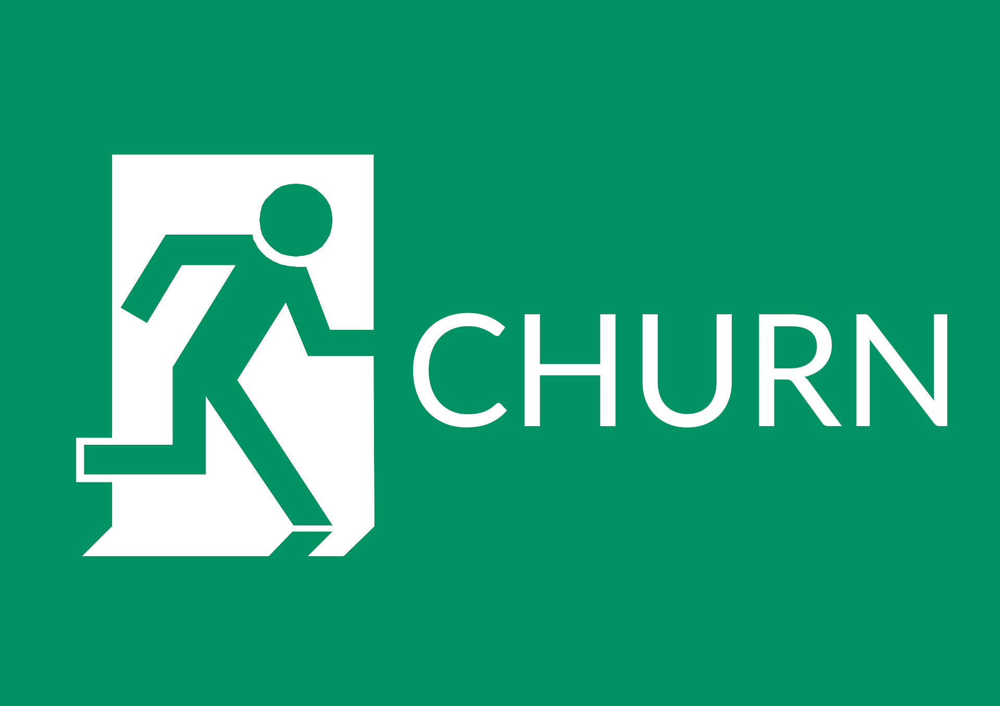

Como podremos saber, una empresa vende un producto o presta un servicio a sus clientes y de esto obtiene dinero, cumpliendo su objetivo principal el cual es generar ganancias.

Por ello, este proyecto aputanara a uno de los componentes mas importantes de una empresa que son los clientes. Mas especificamente, analizaremos el abandono de los mismos, o mas conocido como customer chrun en ingles. 

Utilizaremos un dataset brindando por un banco anonimo, con datos de su cartera de clientes. Como podremos observar el customer churn rate o taza de abandono de clientes es bastante elevado 

In [259]:
bank_df = pd.read_csv("https://docs.google.com/spreadsheets/d/e/2PACX-1vSz3Yx52trZcGRODnR1-aMr8bTTKZDGsZbJj1kw5ms_H5ZOypBXNd2Hyx1bn1A8sznMTQOtCUniEnvJ/pub?output=csv")

In [260]:
bank_df = bank_df.drop(columns=["CLIENTNUM","Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1","Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2"])

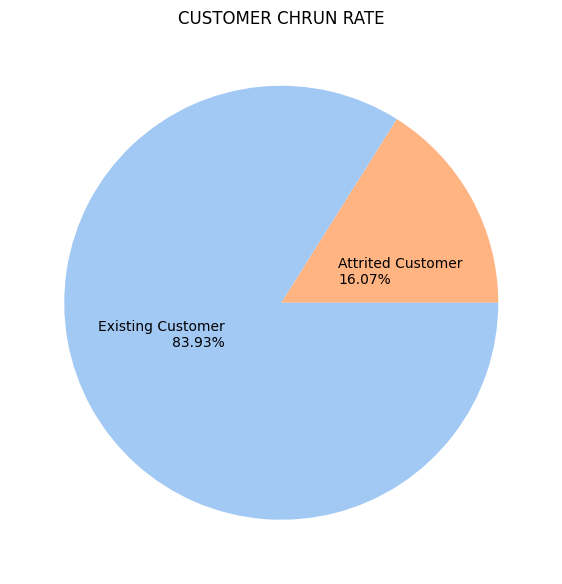

In [261]:
client_count = bank_df['Total_Trans_Amt'].groupby(bank_df['Attrition_Flag']).count()
plt.subplots(figsize = (7,9))
plt.title("CUSTOMER CHRUN RATE")
plt.pie(client_count,
        labels = [client_count.index[0] + "\n" + (str(round((client_count[0]/(client_count[1]+client_count[0]))*100,2))) + "%",
                  client_count.index[1]+ "\n" + (str(round((client_count[1]/(client_count[1]+client_count[0]))*100,2))) + "%"],
        colors = (sns.color_palette('pastel')[1],sns.color_palette('pastel')[0]),
        labeldistance=0.3)

plt.show()

Esto quiere decir que desde el año anterior a dia de hoy el banco perdio un 16,07% de sus clientes. 

In [262]:
bank_df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


# 1- OBJETIVOS

**Objetivos principales**

- Descubrir la causa por la cual hay deserción de clientes en las tarjetas de crédito
-Pronosticar cuales son los posibles clientes que abandonaran las tarjetas de crédito

**Objetivos secuendarios**

- Determinar que Modelo se adapta de mejor manera a las necesidades del problema
- Utilizar modelo para predecir grupos de clientes que abandonarian el banco
- Testear modelos generados

# 2-Contexto comercial

El Gerente comercial de un banco se encuentra frente a un listado de clientes que utilizan el servicio de tarjetas de crédito y detecta una alta taza de abandono de los mismos. Quieren analizar los datos para descubrir la razón detrás de esto y aprovechar lo mismo para predecir los clientes que probablemente abandonarán para poder tomar medidas sobre esto.

# 3- Problema comercial

### Hipótesis 1
H1 = La media del monto total de transacciones (Total_Trans_Amt) es igual para clientes activos y retirados

H0 = La media del monto total de transacciones (Total_Trans_Amt) es diferente para clientes activos y retirados

### Hipótesis 2


H2 = La media de la cantidad total de transacciones (Total_Trans_Ct) es **igual** para clientes activos y retirados

H0 = La media de la cantidad total de transacciones (Total_Trans_Ct) es **diferente** para clientes activos y retirados

## Hipótesis 3

H3 = La media de la variacion en cantidad de transacciones Q4 -Q1 (1) es **igual** para clientes activos y retirados 

H0 = La media de la variacion en cantidad de transacciones Q4 -Q1 (Total_Ct_Chng_Q4_Q1) es **diferente** para clientes activos y retirados

## Pregunta 1
 ¿Cúal es el género que más abandona la tarjeta de crédito?

## Pregunta 2
 Los que abandonan la tarjeta de crédito, ¿Cúal es su estado civil?

## Pregunta 3
 ¿Que edades promedio tienen las personas que abandonan las tarjetas de crédito?

## Pregunta 4
¿Cuanto tiempo en promedio llevan las tarjetas sin utilizar de las personas que abandonan la tarjeta de crédito?

## Pregunta 5 
¿Que tipo de tarjeta usan los clientes que abandonan los servicios?

## Pregunta 6 
¿Que nivel de educacion tienen los clientes que abanonan los servicios?

## Pregunta 7
¿Que nivel de ingresos tienen los clientes que abandonan los servicios?



#4-Glosario

**CLIENTNUM** Client number. Unique identifier for the customer holding the account

**Attrition_FlagInternal** event (customer activity) variable - if the account is closed then 1 else 0

**Customer_Age Demographic** variable - Customer's Age in Years

**Gender Demographic** variable - M=Male, F=Female

**Dependent_count** Demographic variable - Number of dependents

**Education_Level** Demographic variable - Educational Qualification of the account holder (example: high school, college graduate, etc.)

**Marital_Status** Demographic variable - Married, Single, Divorced, Unknown

**Income_Category** Demographic variable - Annual Income Category of the account holder (<40K,40K-60K,60K-80K,80K-120K,>120K, Unknown)

**Card_Category** Product Variable - Type of Card (Blue, Silver, Gold, Platinum)

**Months_on_book** Period of relationship with bank

**Total_Relationship_Count** Total no. of products held by the customer

**Months_Inactive_12_mon** No. of months inactive in the last 12 months

**Contacts_Count_12_mon** No. of Contacts in the last 12 months

**Credit_Limit Credit** Limit on the Credit Card

**Total_Revolving_Bal** Total Revolving Balance on the Credit Card

**Avg_Open_To_Buy** Open to Buy Credit Line (Average of last 12 months)

**Total_Amt_Chng_Q4_Q1** Change in Transaction Amount (Q4 over- Q1)

**Total_Trans_Amt** Total Transaction Amount (Last 12 months)

**Total_Trans_Ct** Total Transaction Count (Last 12 months)

**Total_Ct_Chng_Q4_Q1** Change in Transaction Count (Q4 over Q1)

**Avg_Utilization_Ratio** Average Card Utilization Ratio

# 5-EDA

In [263]:
bank_df.describe(include = "all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Attrition_Flag,10127,2,Existing Customer,8500,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,10127.0,NaN,NaN,NaN,46.32596,8.016814,26.0,41.0,46.0,52.0,73.0
Gender,10127,2,F,5358,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,10127.0,NaN,NaN,NaN,2.346203,1.298908,0.0,1.0,2.0,3.0,5.0
Education_Level,10127,7,Graduate,3128,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,10127,4,Married,4687,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,10127,6,Less than $40K,3561,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,10127,4,Blue,9436,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,10127.0,NaN,NaN,NaN,35.928409,7.986416,13.0,31.0,36.0,40.0,56.0
Total_Relationship_Count,10127.0,NaN,NaN,NaN,3.81258,1.554408,1.0,3.0,4.0,5.0,6.0


In [264]:
bank_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In [265]:
columns_name = list(bank_df.columns.values)

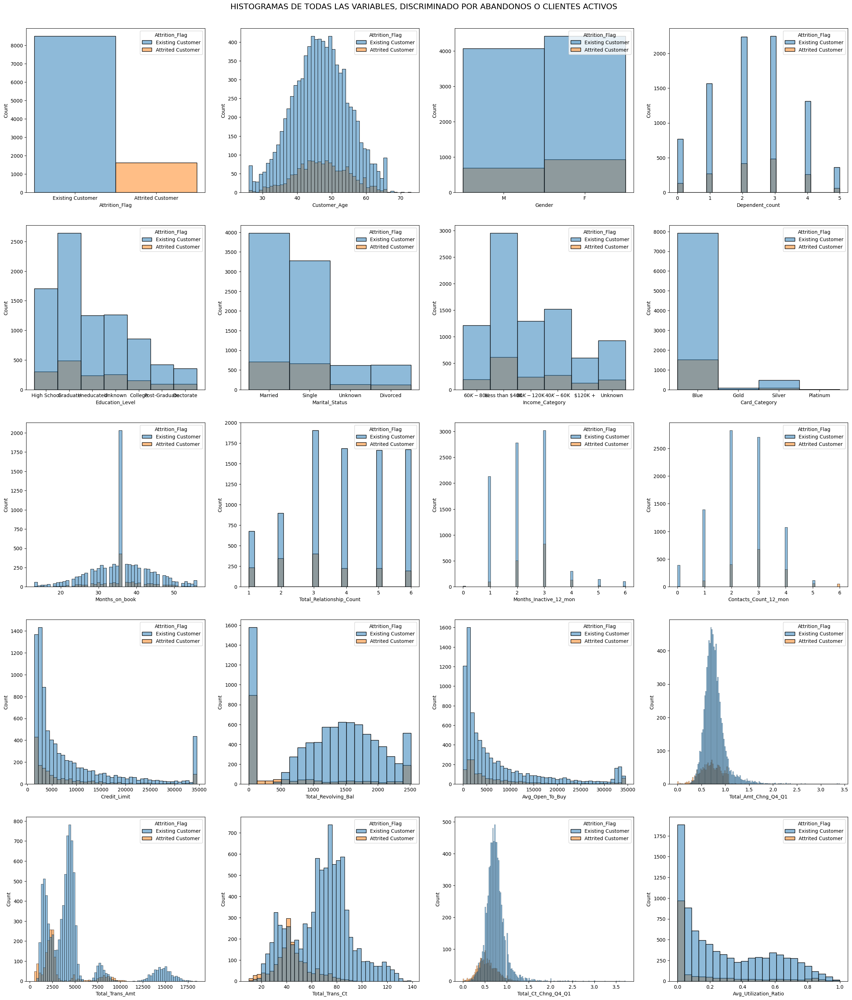

In [266]:
#  Se arma una lista con los nombres de las columnas para usarla a continuacion

fig , axes = plt.subplots(5,4,figsize = (30,35))
plt.suptitle('HISTOGRAMAS DE TODAS LAS VARIABLES, DISCRIMINADO POR ABANDONOS O CLIENTES ACTIVOS',fontsize=16,y = 0.9)
i = 0
for fil in range(5):
  for col in range(4):
    if i <=20:                     #esta condicion se plantea ya que las ultimas 2 columnas del dataset no hay que usarlas para analisi segun la pagina
        sns.histplot(data=bank_df,
              ax=axes[fil,col],
              x=columns_name[i],
              hue = 'Attrition_Flag'
              )
        i = i + 1
plt.show()

>Analisis de distribuciones y outliers en variables numericas 

In [267]:
var_num = bank_df.select_dtypes(include = ["number"]).columns

En un principio se corria este bucle de la funcion propia hist_box para graficar, pero se decidio hacer los graficos uno a uno para sacar conclusiones y que quede mas prolijo.

```
for i in range(len(var_num)):
    hist_box(var_num[i],None)
```



In [268]:
print(f'analisis grafico de {var_num[0]}')

analisis grafico de Customer_Age


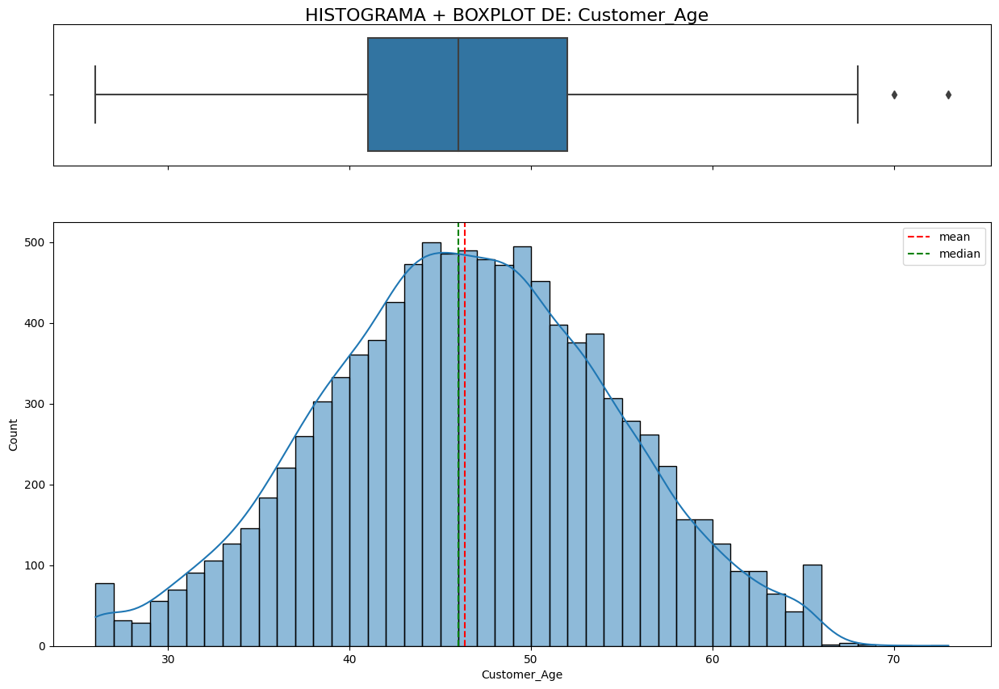

In [269]:
hist_box(var_num[0],None)

Como era de esperarse, la distribucion de los datos de las edades es normal. Presentando muy pocos outliers. 

In [270]:
print(f'analisis grafico de {var_num[1]}')

analisis grafico de Dependent_count


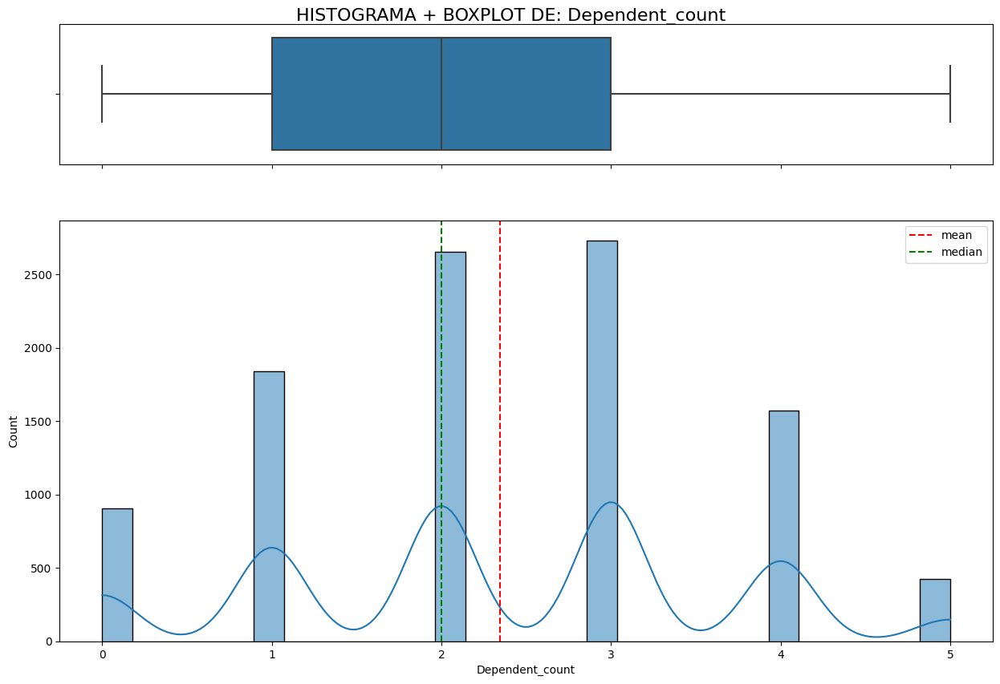

In [271]:
hist_box(var_num[1],None)

Este grafico tiene esta forma porque la cantidad de cuentas es un numero entero. Por lo tanto, podria considerarse como categorica. 

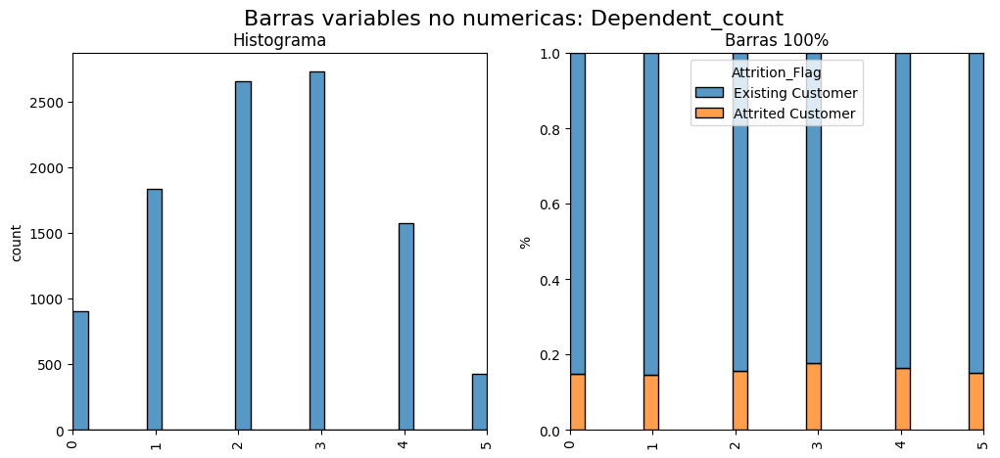

In [272]:
graf_cat(var_num[1])

el histograma muestra que la mayoria de las personas tienen entre 2 y 3 cuentas dependientes. Por otro lado, las barras al 100%, mostrarian que no hay un comportamiento diferente para ninguna de las categorias desde el punto de vista del target. 

In [273]:
print(f'analisis grafico de {var_num[2]}')

analisis grafico de Months_on_book


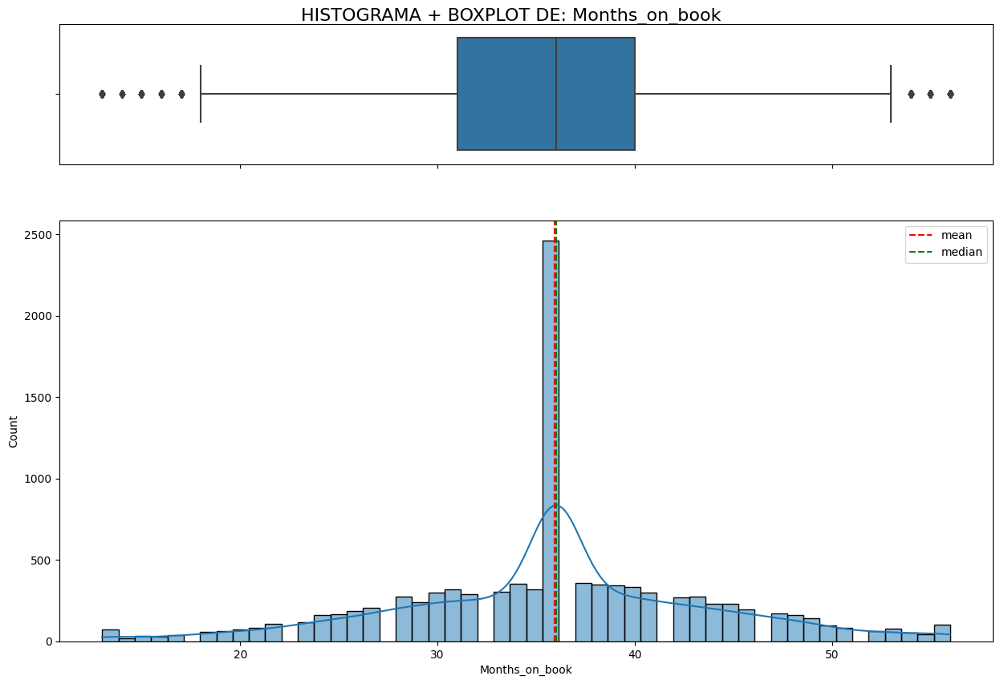

In [274]:
hist_box(var_num[2],None)

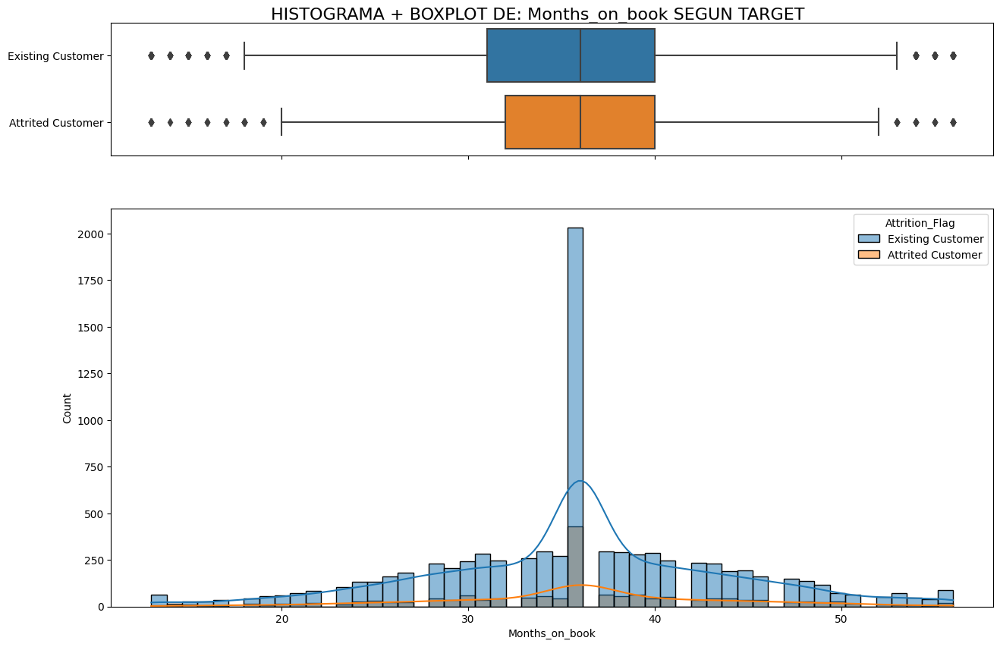

In [275]:
hist_box(var_num[2],'Attrition_Flag')

Para la variable meses en los libros podemos observar un valor predominante, que es 36 meses. Esto se mantiene para ambas categorias analizadas

In [276]:
print(f'analisis grafico de {var_num[3]}')

analisis grafico de Total_Relationship_Count


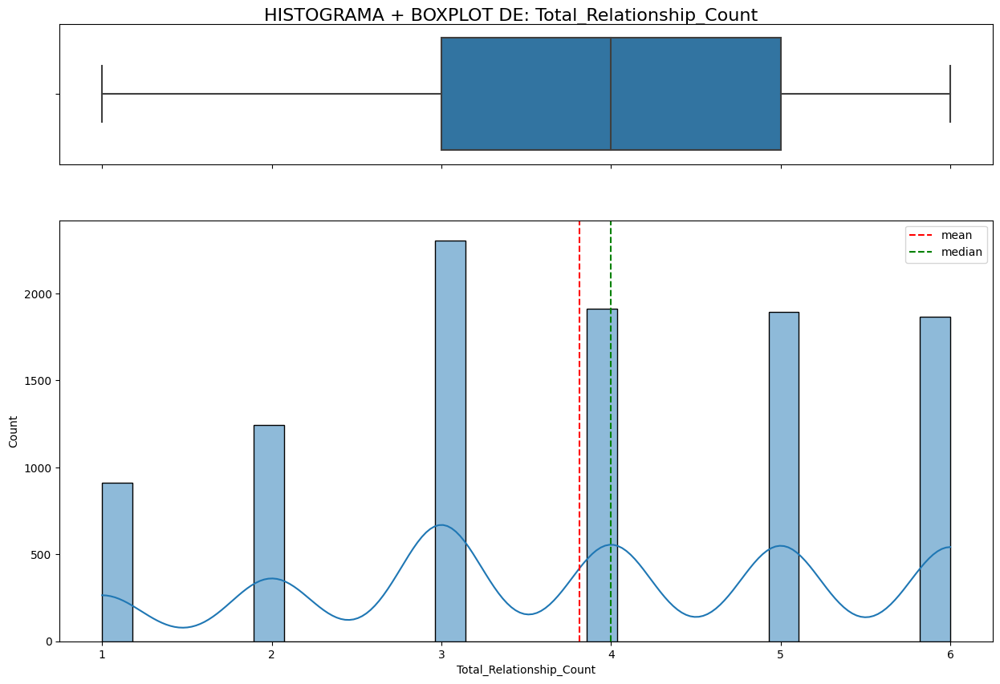

In [277]:
hist_box(var_num[3],None)

Con esta variable sucede lo mismo que con la cantidad de cuentas dependientes. Podemos considerarla como categorica o discreta. 

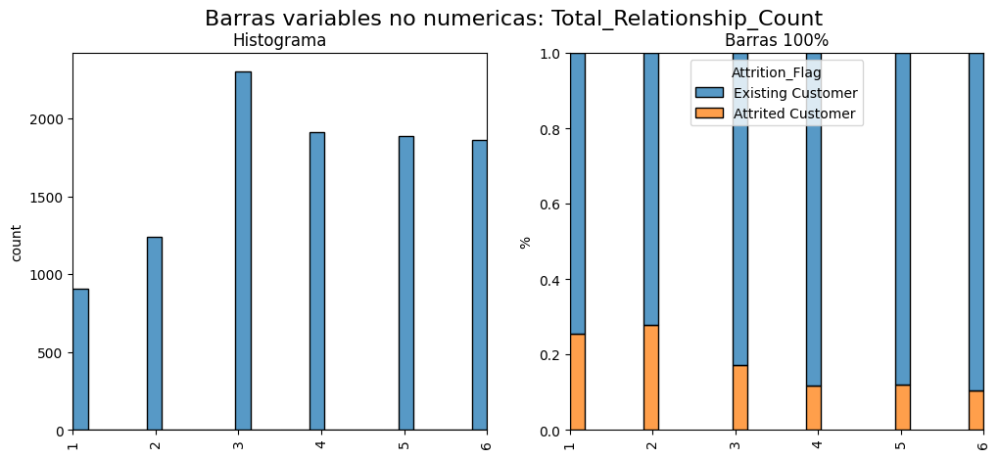

In [278]:
graf_cat(var_num[3])

El histograma muestra que la mayoria de las personas tienen mas de 3 cuentas dependientes. Las barras agrupadas, por otro lado, muestran que las personas que tienen 2 o menos cuentas dependientes tienen un mayor abandono que las demas. 

In [279]:
print(f'analisis grafico de {var_num[4]}')

analisis grafico de Months_Inactive_12_mon


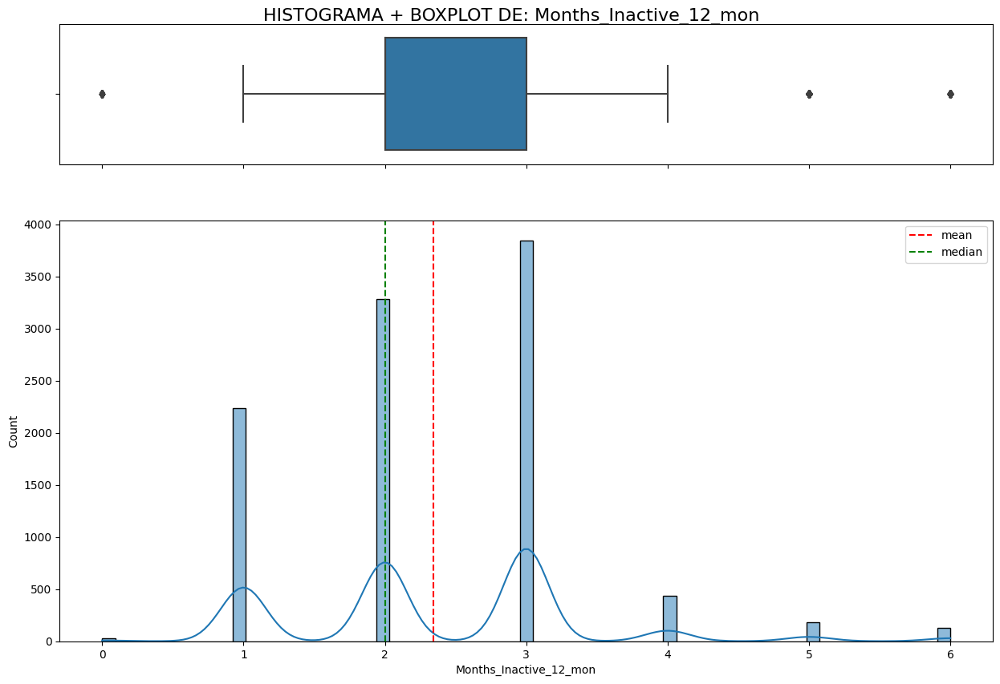

In [280]:
hist_box(var_num[4],None)

Esta varable tambien es discreta. Y tambien podemos observar una gran tendencia a que el total de las observaciones estan 2 o 3 meses inactivos. 

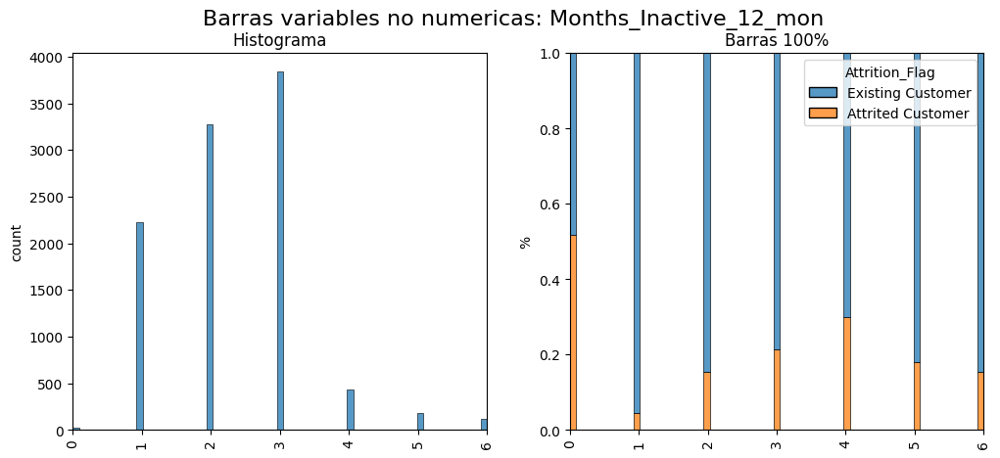

In [281]:
graf_cat(var_num[4])

Observando los datos mas significantes, es decir esos clientes que pasan 1, 2 o 3 meses inactivos, podemos decir que a medida que aumentan los meses de inactividad, hay mayor porcentaje de abandono del servicio. 

In [282]:
print(f'analisis grafico de {var_num[5]}')

analisis grafico de Contacts_Count_12_mon


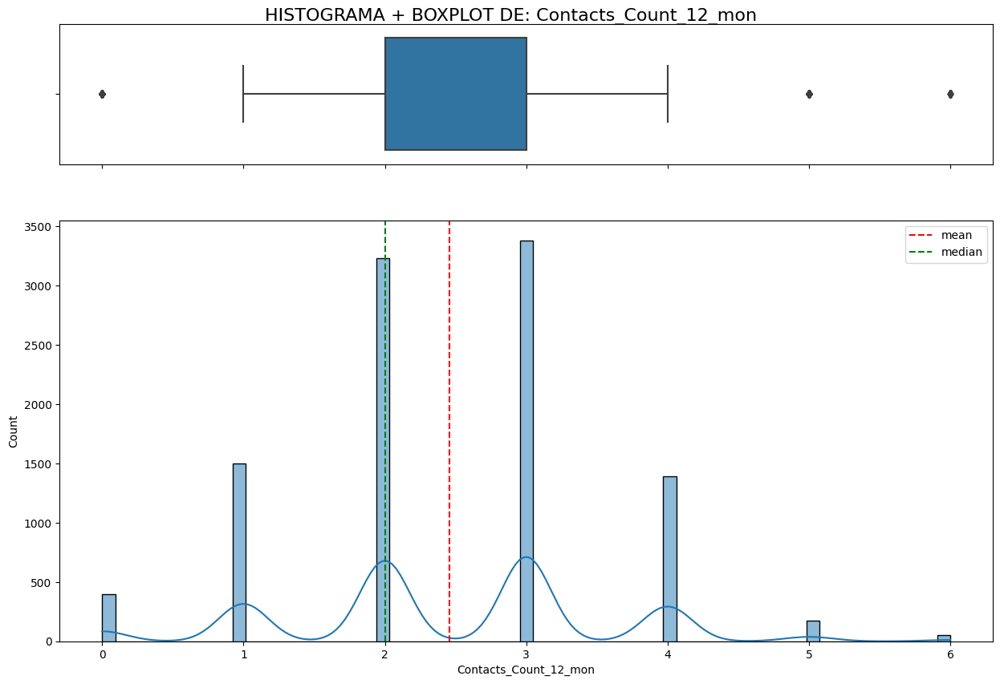

In [283]:
hist_box(var_num[5],None)

Variable discreta, puede observarse una concenrtacion en 2 y 3 cuentas contactadas en los ultimos 12 meses.

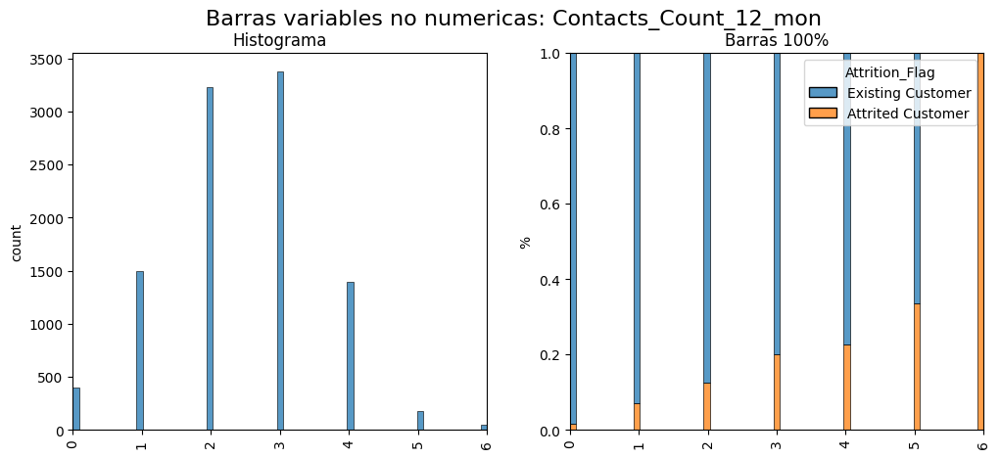

In [284]:
graf_cat(var_num[5])

Esta variable preseenta un comportamiento bastante marcado, podemos observar que mientras mas contactos tienen en los ultimos 12 meses, mas tasa de abandono existe. 

In [285]:
print(f'analisis grafico de {var_num[6]}')

analisis grafico de Credit_Limit


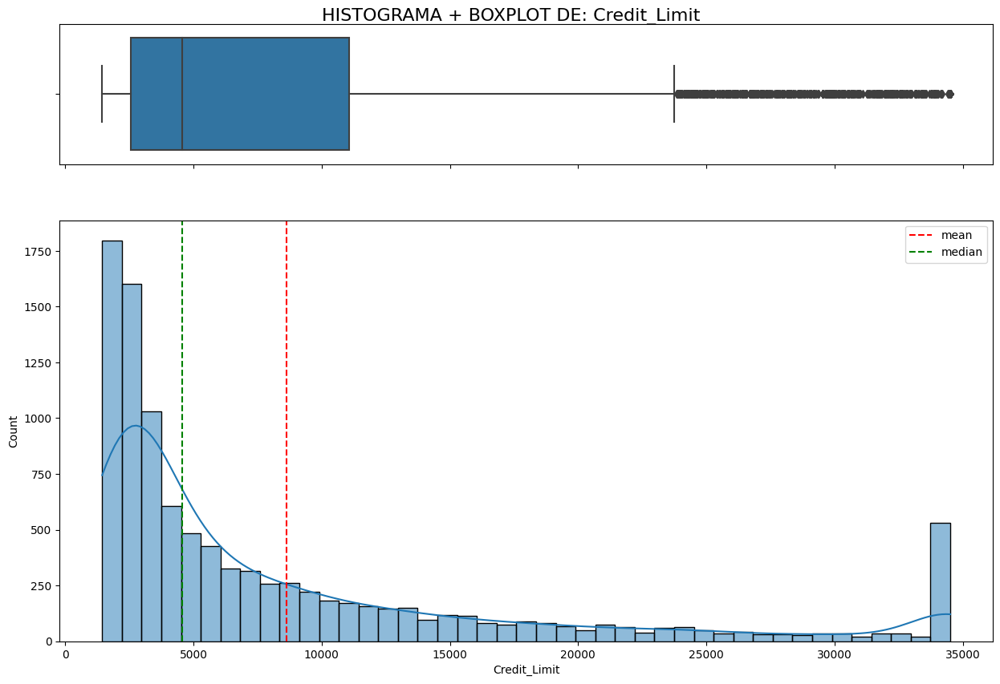

In [286]:
hist_box(var_num[6],None)

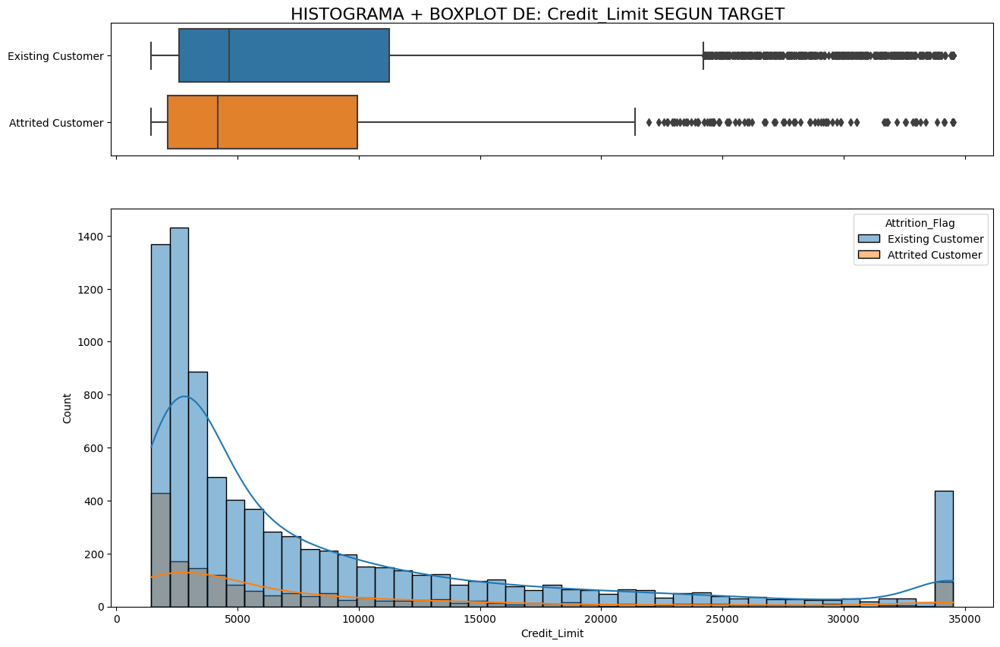

In [287]:
hist_box(var_num[6],'Attrition_Flag')

Podemos observar una distribucion muy sesgada a la derecha. Pero a su vez, podemos ver que tanto los clientes que abandonan como los que no abandonan el servicio siguen una misma distribucion.  

Tambien es notoria la cantidad de outliers que presenta la variable

In [288]:
print(f'analisis grafico de {var_num[7]}')

analisis grafico de Total_Revolving_Bal


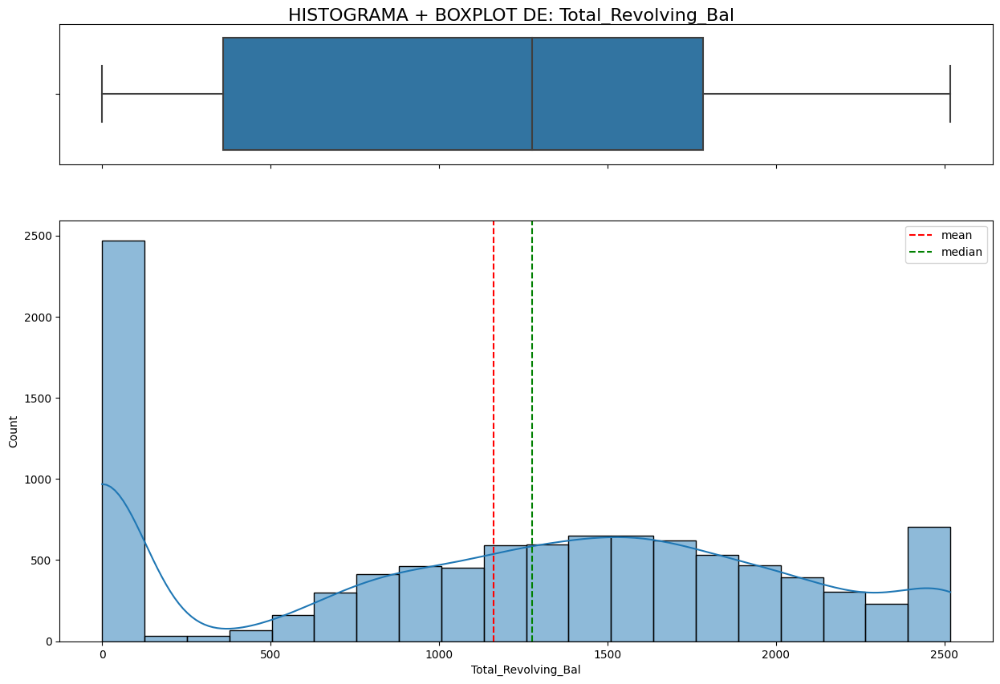

In [289]:
hist_box(var_num[7],None)

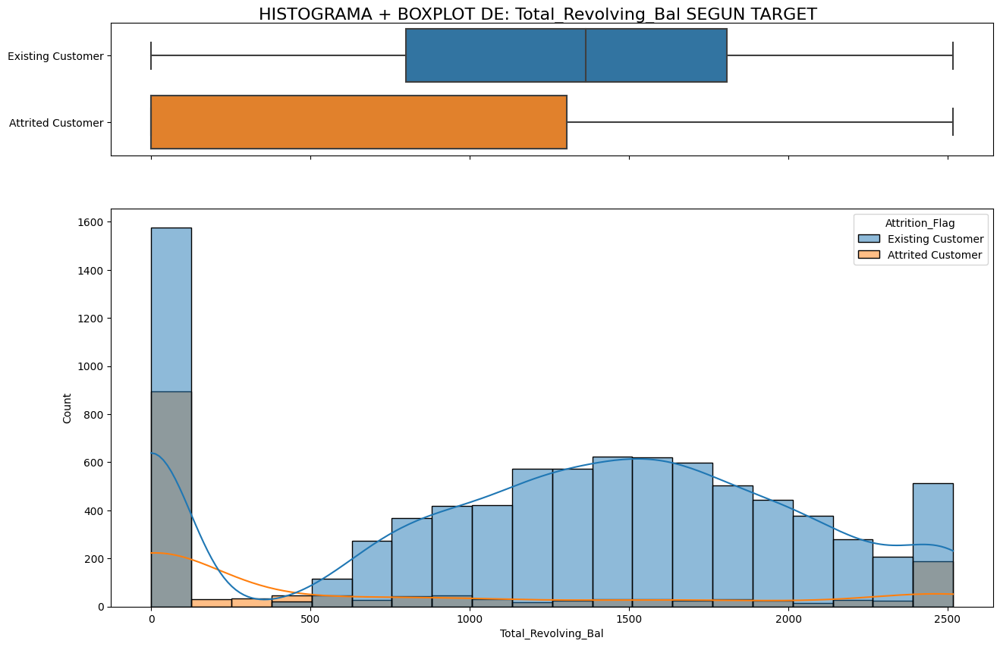

In [290]:
hist_box(var_num[7],'Attrition_Flag')

En esta variable, podemos detectar ciertos patrones. Si observamos el Boxplot, vemos que la gran mayoria(75%) de los clientes que abandonan el servicio tienen un Total_revolving_bal menor a 1300, que seria hasta el Q3 de la categoria Attrited Customer. Por otro lado, la mediana de los Existing Customers, sobrepasa este valor, siendo de aproximadamente 1400.

Tambien se puede observar para ambas cateogiras una gran concentracion de datos en el valor = 0

In [291]:
print(f'analisis grafico de {var_num[8]}')

analisis grafico de Avg_Open_To_Buy


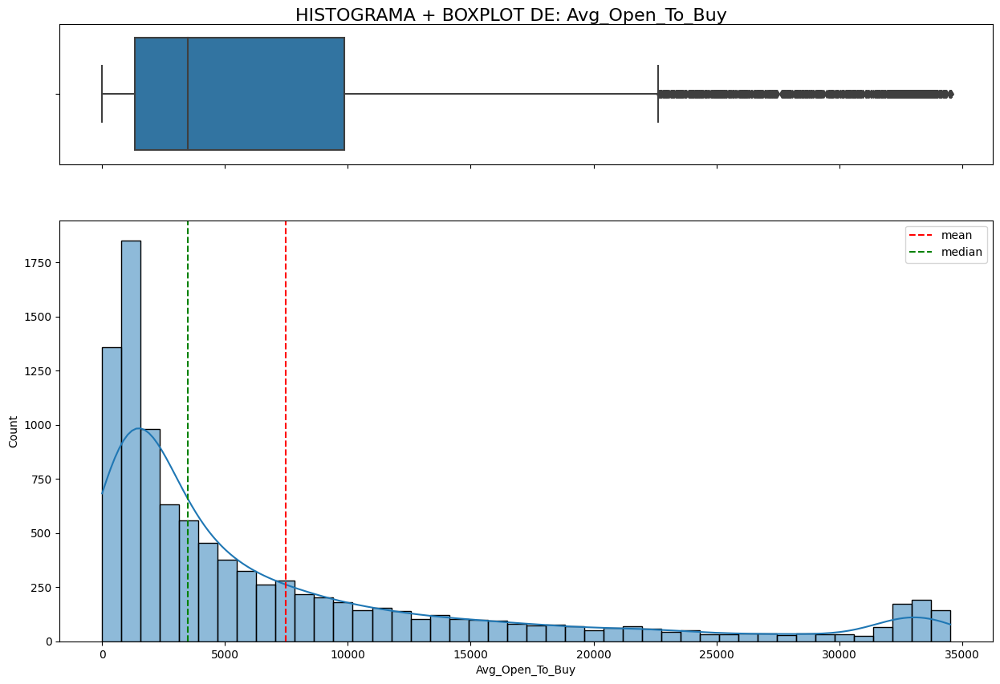

In [292]:
hist_box(var_num[8],None)

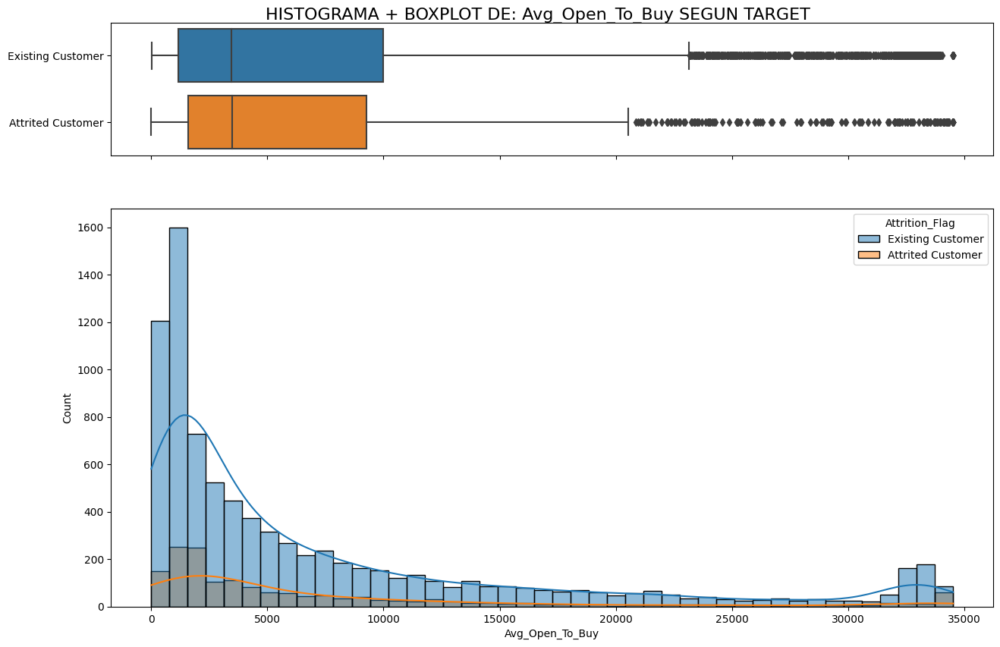

In [293]:
hist_box(var_num[8],'Attrition_Flag')

Podemos observar una distribucion muy sesgada a la derecha. Pero a su vez, podemos ver que tanto los clientes que abandonan como los que no abandonan el servicio siguen una misma distribucion.  

Tambien es notoria la cantidad de outliers que presenta la variable

DATO: La distribucion es muy similar a la de Credit_limit

In [294]:
print(f'analisis grafico de {var_num[9]}')

analisis grafico de Total_Amt_Chng_Q4_Q1


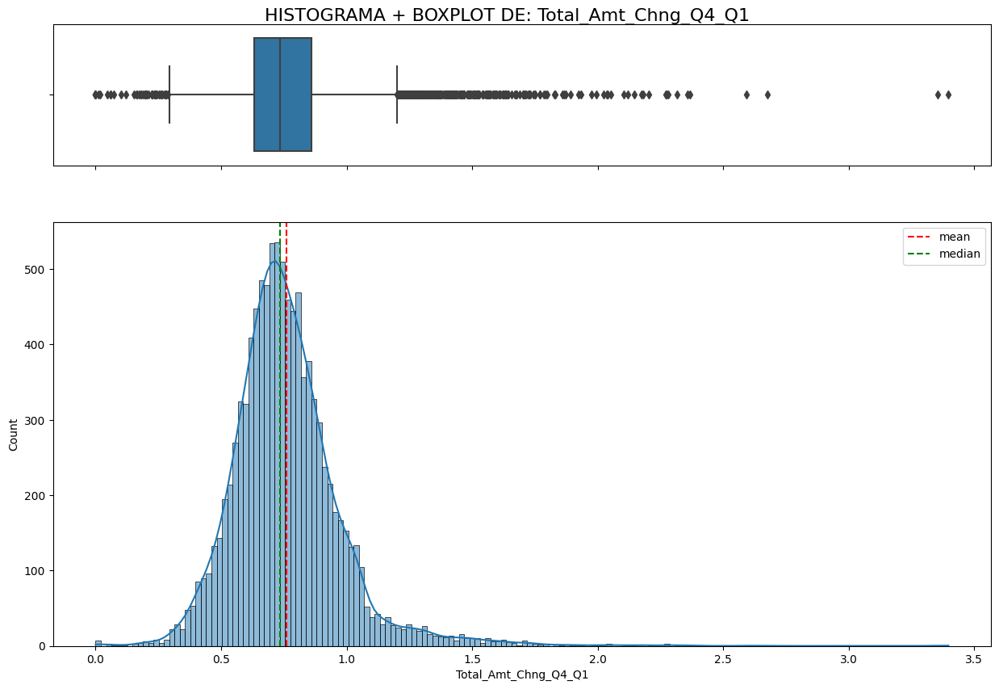

In [295]:
hist_box(var_num[9],None)

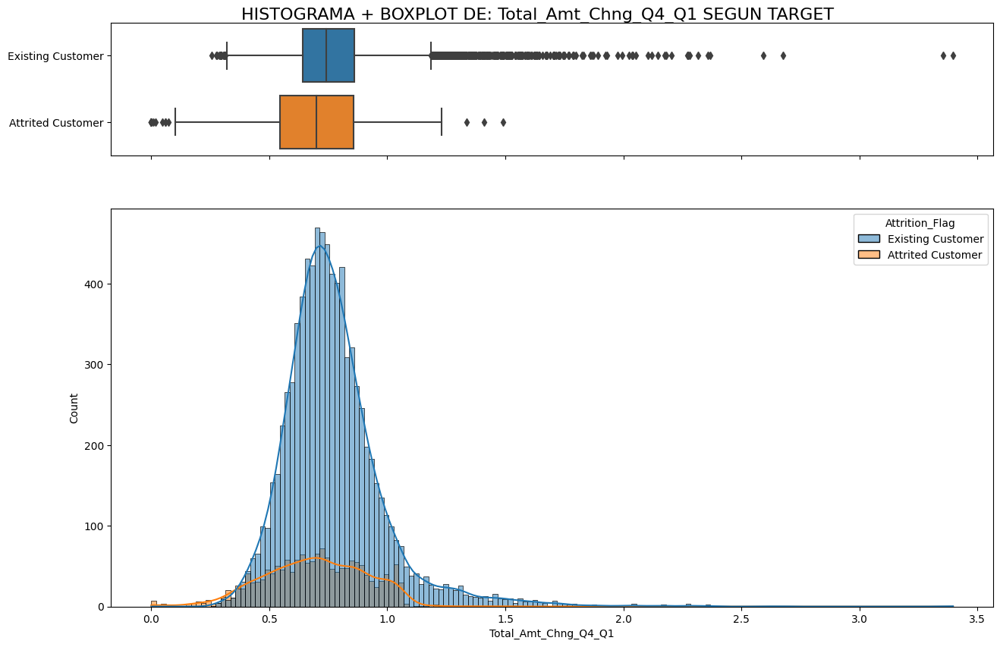

In [296]:
hist_box(var_num[9],'Attrition_Flag')

Esta variablee presenta gran cantidad de outliers. 

Por otro lado, podemos observar que para el caso de los Existing Customers, los datos estan mucho mas conceentrados, tendiendo al valor central.

Para los Attrited Customer la distribucion es mucho mas plana.

In [297]:
print(f'analisis grafico de {var_num[10]}')

analisis grafico de Total_Trans_Amt


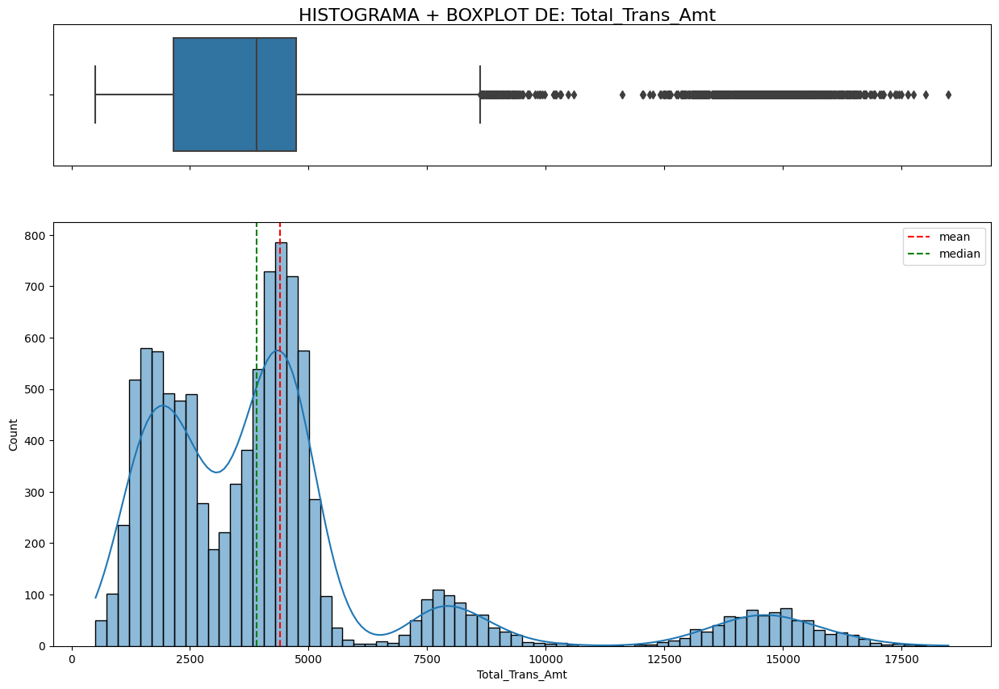

In [298]:
hist_box(var_num[10],None)

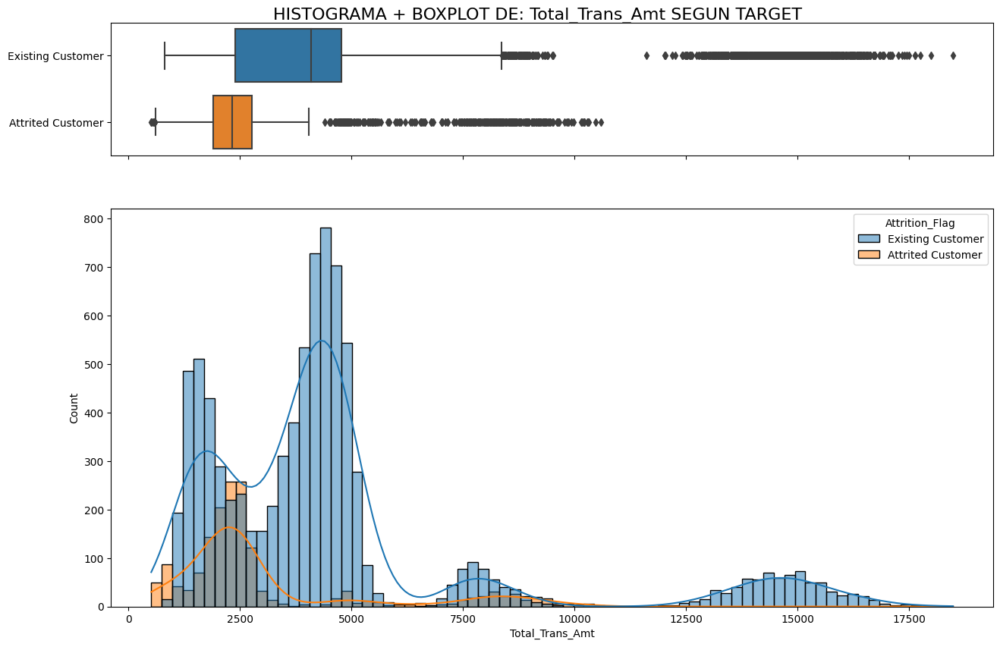

In [299]:
hist_box(var_num[10],'Attrition_Flag')

Esta variable tiene una distribucion presenta dos picos, y ademas se comporta de maneras difeerentes segun el Target.

Tambien podemos ver que la variable posee una gran cantidad de outliers

Podriamos decir que NO abandonaran el servicio las personas que tengan un total de transacciones mayor al Q3 (75%) correspondiente a la categoria Attrited Customer

In [300]:
print(f'analisis grafico de {var_num[11]}')

analisis grafico de Total_Trans_Ct


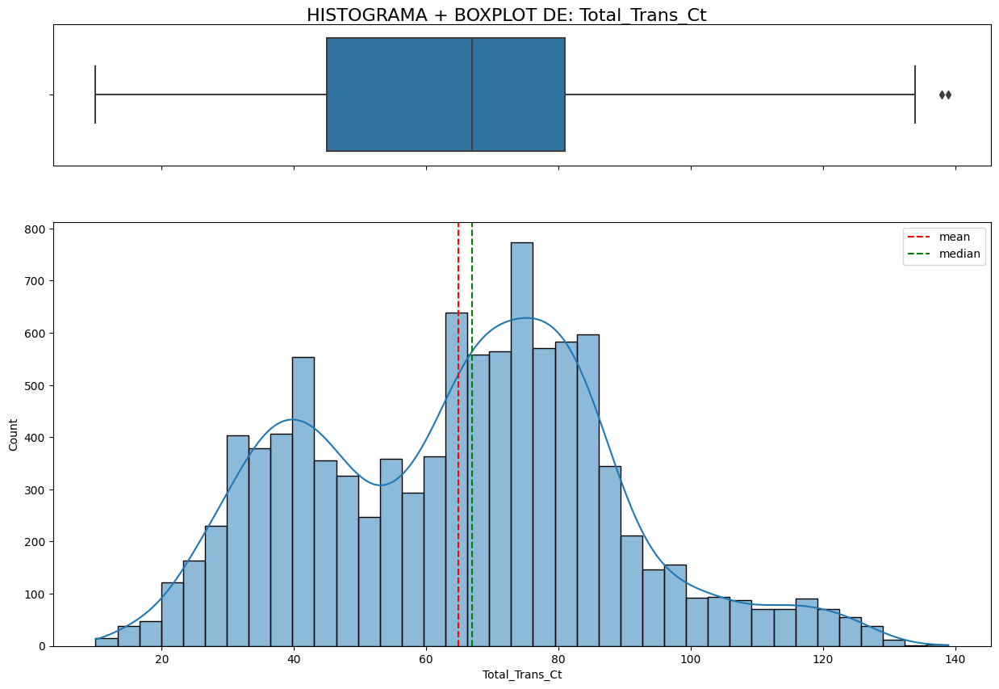

In [301]:
hist_box(var_num[11],None)

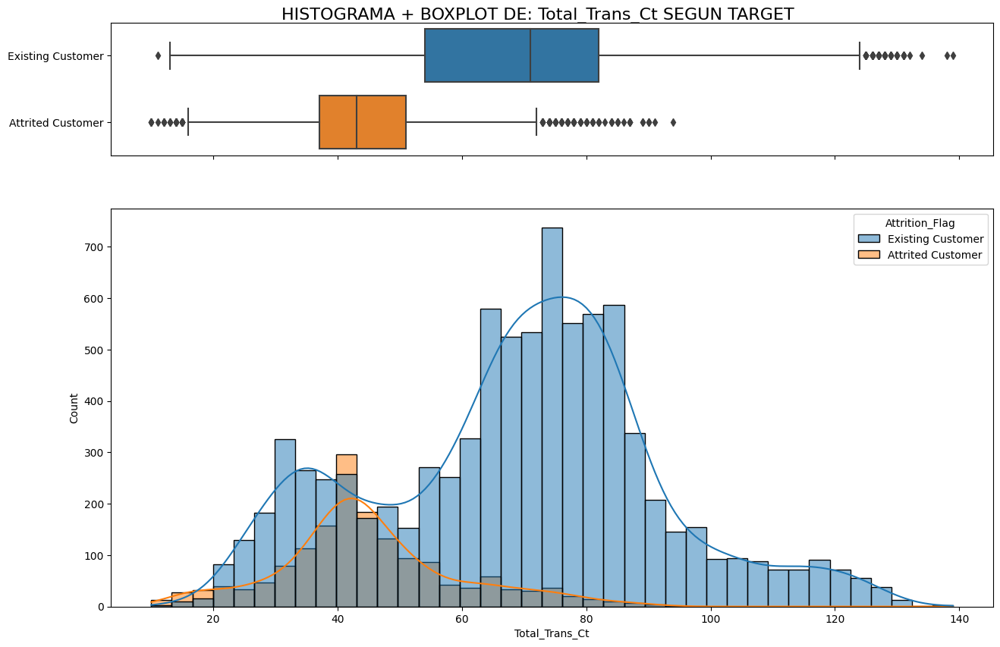

In [302]:
hist_box(var_num[11],'Attrition_Flag')

Esta otra variable tambien tiene un comprotamieento muy marcado en cuanto a las distribuciones segun los dos targets.

Podriamos decir que NO abandonaran el servicio las personas que tengan una cantidad total de transacciones mayor al Q3 (75%) correspondiente a la categoria Attrited Custome. Aprox +50 transacciones



In [303]:
print(f'analisis grafico de {var_num[12]}')

analisis grafico de Total_Ct_Chng_Q4_Q1


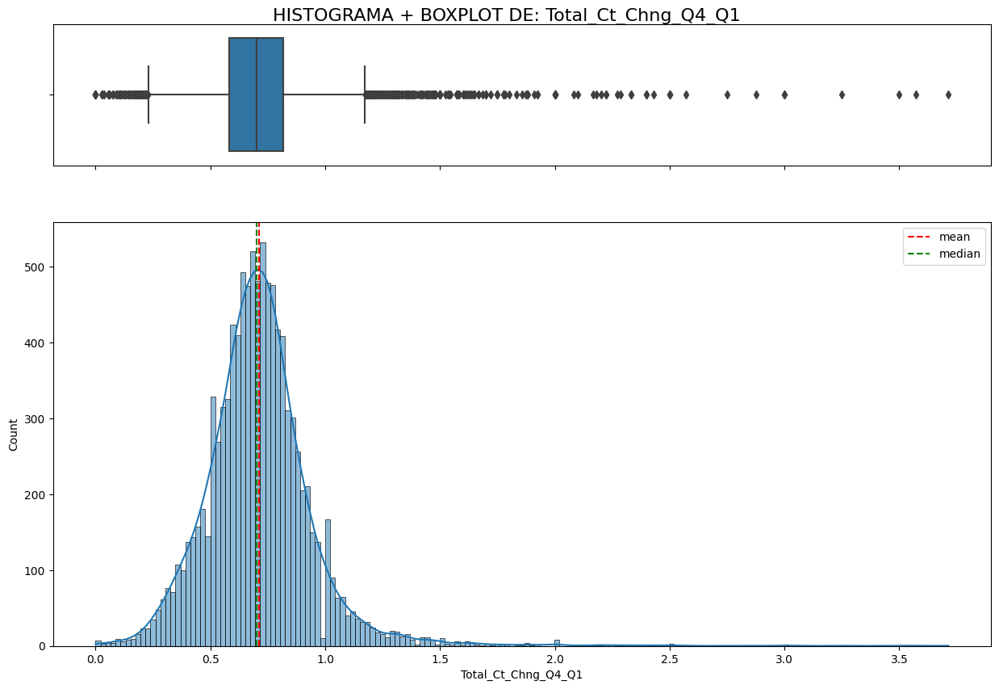

In [304]:
hist_box(var_num[12],None)

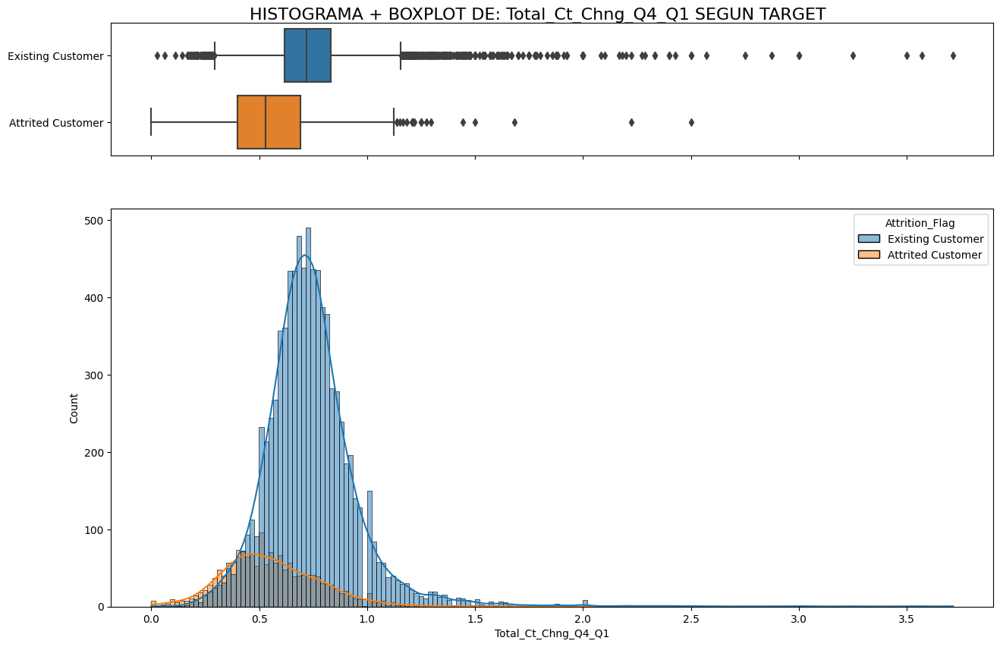

In [305]:
hist_box(var_num[12],'Attrition_Flag')

Esta variable tambien contiene gran cantidad de outliers. pero puede verse una diferencia en el comportamiento segun el target. Los clientes que abandonan tienen una tendencia a reducir en mayor medida la cantidad de transacciones que hacen a lo largo del año. Siendo 0.5 la media para estos clientes VS 0.75 aproximadamente para los clientes que no abandonan el servicio.

In [306]:
print(f'analisis grafico de {var_num[13]}')

analisis grafico de Avg_Utilization_Ratio


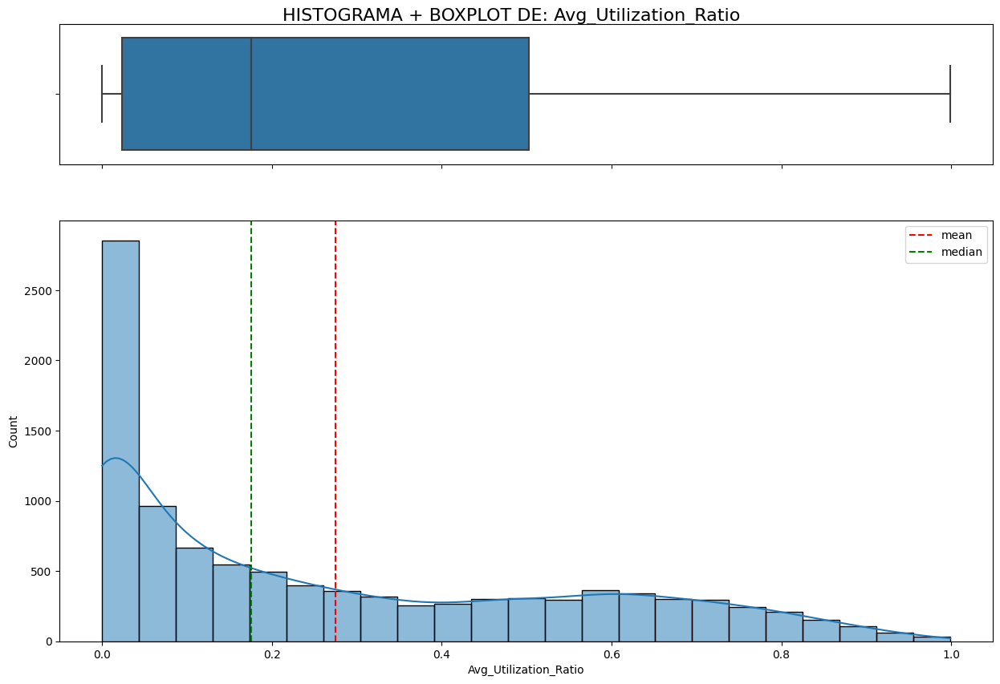

In [307]:
hist_box(var_num[13],None)

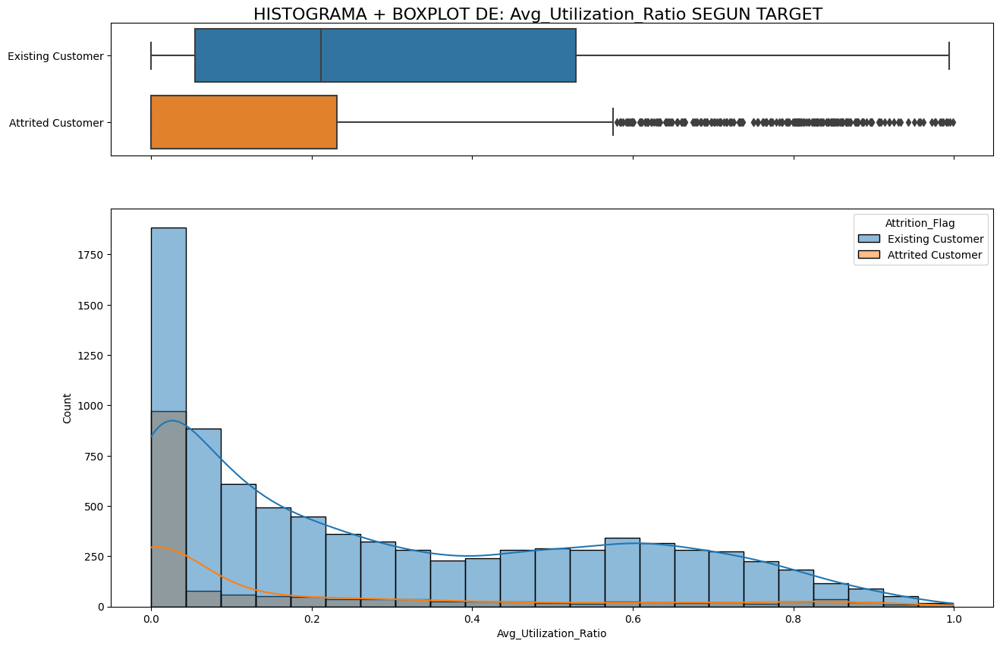

In [308]:
hist_box(var_num[13],'Attrition_Flag')

Podemos observar una distribucion muy sesgada a la derecha. 

Tambien es posible observar, que si bien existe alguna similitud entre la distribucion para las dos categorias, estas no son iguales. En el boxplot es notorio que los clientes que abandonan tienen un menor ratio de utilizacion medio de sus cueentas. 

Ademas, para la categoria correspondiente a clientes que abandonan, nos encontramos con una gran cantidad de outliers


> Analisis de variables categoricas.

En este caso, si utilizaremos el bucle para graficar y sacaremos conclusiones al final



In [309]:
var_no_num = []
for i in columns_name:
    if i not in var_num:
        var_no_num.append(i)

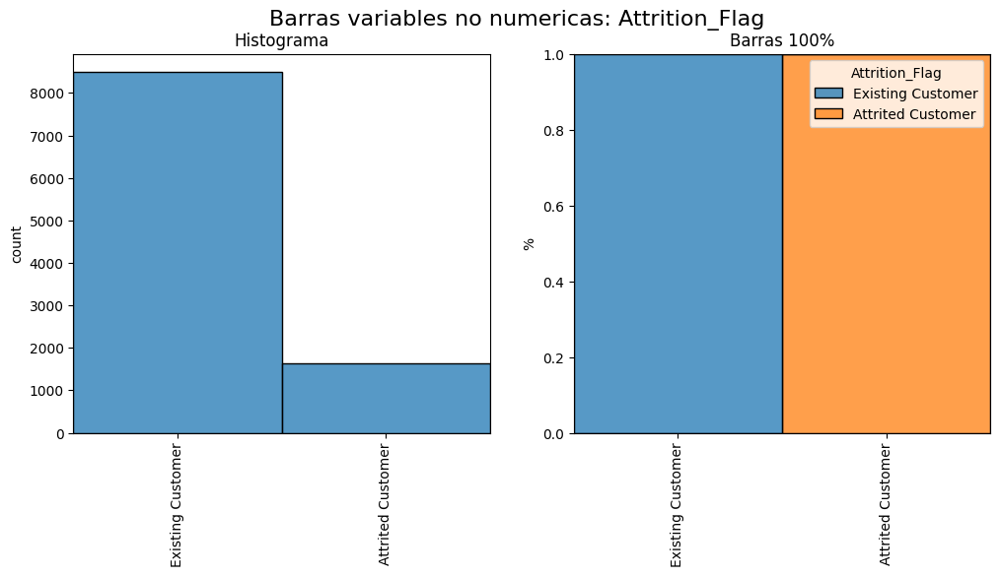

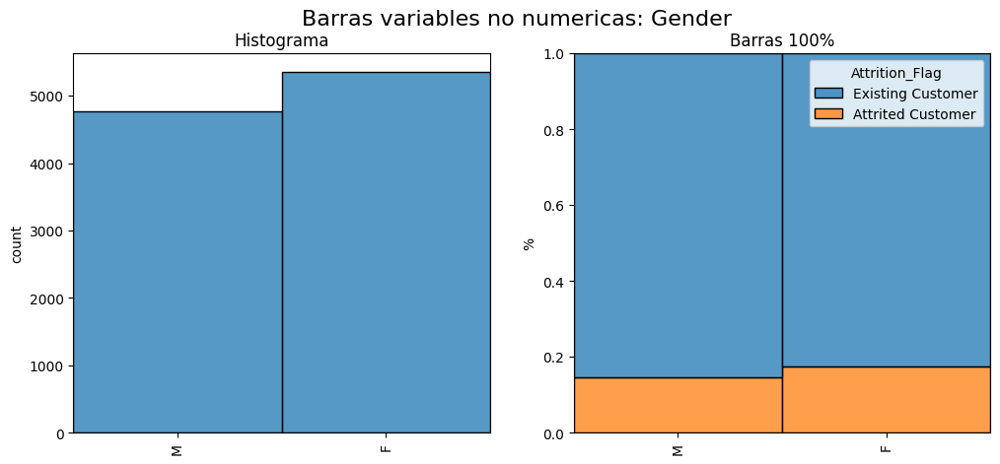

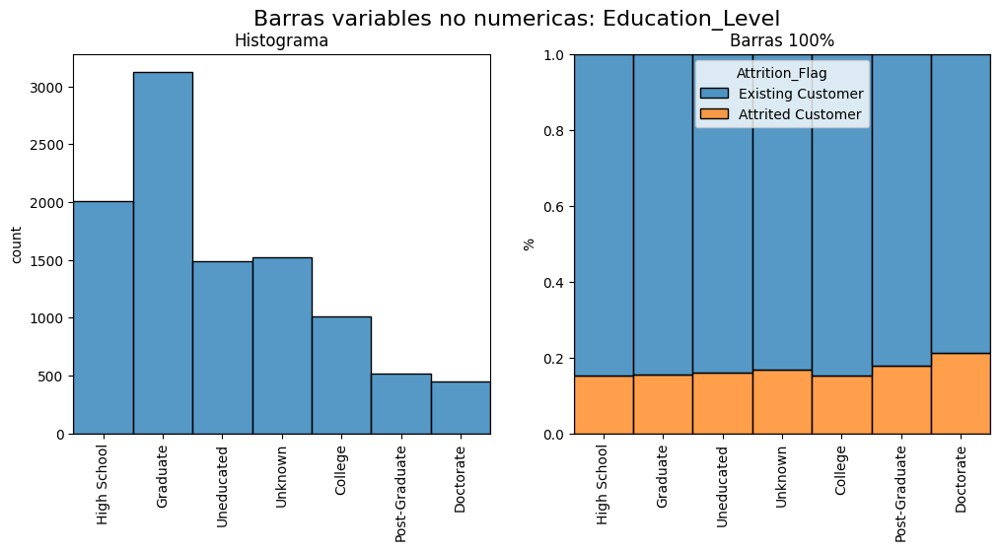

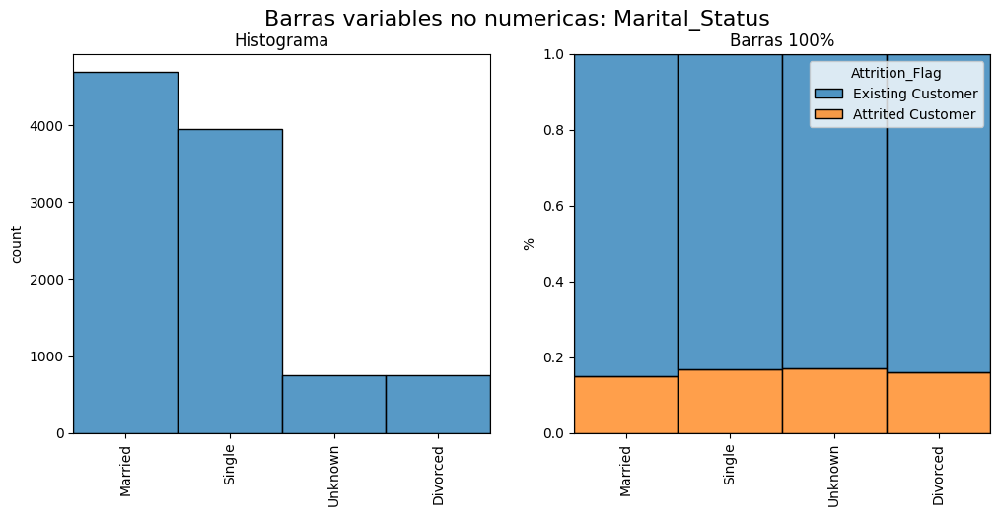

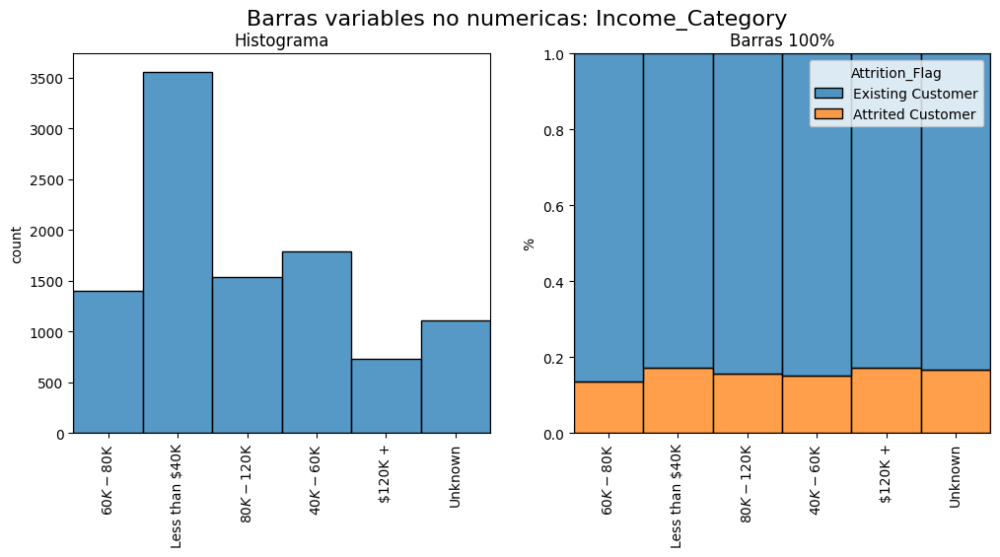

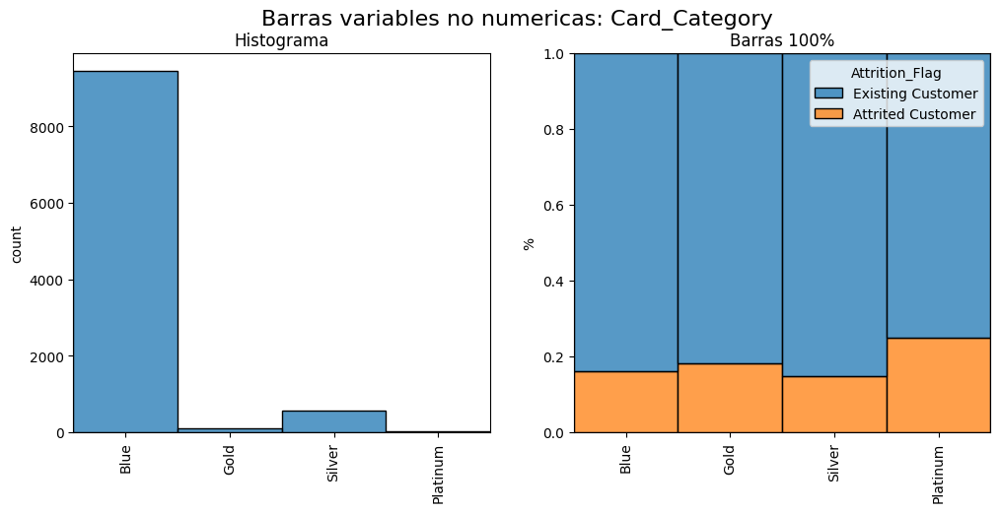

In [310]:
for i in range(len(var_no_num)):
    graf_cat(var_no_num[i])

No se observan comportamientros muy extraños en estas variables categoricas.

### Hipótesis 1


H1 = La media del monto total de transacciones (Total_Trans_Amt) es igual para clientes activos y retirados

H0 = La media del monto total de transacciones (Total_Trans_Amt) es diferente para clientes activos y retirados

In [311]:
media_tta = bank_df['Total_Trans_Amt'].groupby(bank_df['Attrition_Flag']).mean()
sum_tta = bank_df['Total_Trans_Amt'].groupby(bank_df['Attrition_Flag']).sum()
print('media del monto total de transacciones por Attrition Flag')
print(media_tta)
print('_ '*30)
print(' ')
print('suma del monto total de transacciones por Attrition Flag')
print(sum_tta)

media del monto total de transacciones por Attrition Flag
Attrition_Flag
Attrited Customer    3095.025814
Existing Customer    4654.655882
Name: Total_Trans_Amt, dtype: float64
_ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ 
 
suma del monto total de transacciones por Attrition Flag
Attrition_Flag
Attrited Customer     5035607
Existing Customer    39564575
Name: Total_Trans_Amt, dtype: int64


Se nota que los valores de las medias son diferentes. Por lo que se descarta la H1 y se validaria la H0.

En función de esto, se procede a analizar mas a detalle. Para ello se realizan 2 graficos, un histograma y un boxplot con el objetivo de determinar que tipo de distribucion siguen los datos y para determinar la existencia de outliers. En caso de que se encuentren outliers la media no es una medida muy representativa, por lo que se analizara con la mediana.

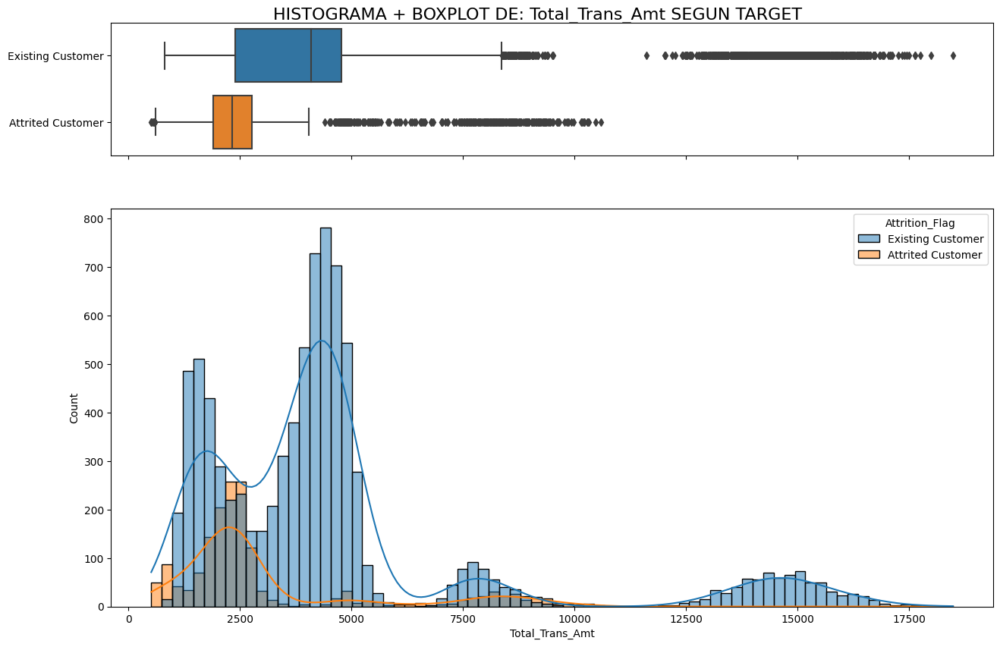

In [312]:
hist_box('Total_Trans_Amt','Attrition_Flag')

Se observa gran cantidad de outliers, por lo que se analizara la mediana.

In [313]:
mediana_tta = bank_df['Total_Trans_Amt'].groupby(bank_df['Attrition_Flag']).median()
print('mediana del monto total de transacciones por Attrition Flag')
print(mediana_tta)

mediana del monto total de transacciones por Attrition Flag
Attrition_Flag
Attrited Customer    2329.0
Existing Customer    4100.0
Name: Total_Trans_Amt, dtype: float64


Ahora se calculan los Q1 y Q3 para sacar el IQR 
Vamos a usar una A para referirnos a los clientes ACTIVOS y una R para los clientes RETIRADOS

In [314]:
Q1R = bank_df[bank_df['Attrition_Flag'] == "Attrited Customer"].Total_Trans_Amt.quantile(0.25)
Q3R = bank_df[bank_df['Attrition_Flag'] == "Attrited Customer"].Total_Trans_Amt.quantile(0.75)
print("Q1R = ",Q1R)
print("Q3R = ",Q3R)
print("IQR Retirados = ", Q3R-Q1R)

Q1A = bank_df[bank_df['Attrition_Flag'] != "Attrited Customer"].Total_Trans_Amt.quantile(0.25)
Q3A = bank_df[bank_df['Attrition_Flag'] != "Attrited Customer"].Total_Trans_Amt.quantile(0.75)
print("Q1A = ",Q1A)
print("Q3A = ",Q3A)
print("IQR Activos = ", Q3A-Q1A)

Q1R =  1903.5
Q3R =  2772.0
IQR Retirados =  868.5
Q1A =  2384.75
Q3A =  4781.25
IQR Activos =  2396.5


Podemos observar que los montos de las transferencias realizadas por clientes activos se concentran entre los 2384 y 4781 USD. Mientras que los montos de las transferencias realizadas por clientes retirados se encuentran entre los 1903 y 2772 USD

### Hipótesis 2



H2 = La media de la cantidad total de transacciones (Total_Trans_Ct) es igual para clientes activos y retirados

H0 = La media de la cantidad total de transacciones (Total_Trans_Ct) es diferente para clientes activos y retirados



In [315]:
media_ttc = bank_df['Total_Trans_Ct'].groupby(bank_df['Attrition_Flag']).mean()
sum_ttc = bank_df['Total_Trans_Ct'].groupby(bank_df['Attrition_Flag']).sum()
print('media del conteo total de transacciones por Attrition Flag')
print(media_ttc)
print('_ '*30)
print(' ')
print('suma del conteo total de transacciones por Attrition Flag')
print(sum_ttc)

media del conteo total de transacciones por Attrition Flag
Attrition_Flag
Attrited Customer    44.933620
Existing Customer    68.672588
Name: Total_Trans_Ct, dtype: float64
_ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ 
 
suma del conteo total de transacciones por Attrition Flag
Attrition_Flag
Attrited Customer     73107
Existing Customer    583717
Name: Total_Trans_Ct, dtype: int64


Se nota que los valores de las medias son diferentes. Por lo que se descarta la H2 y se validaria la H0.

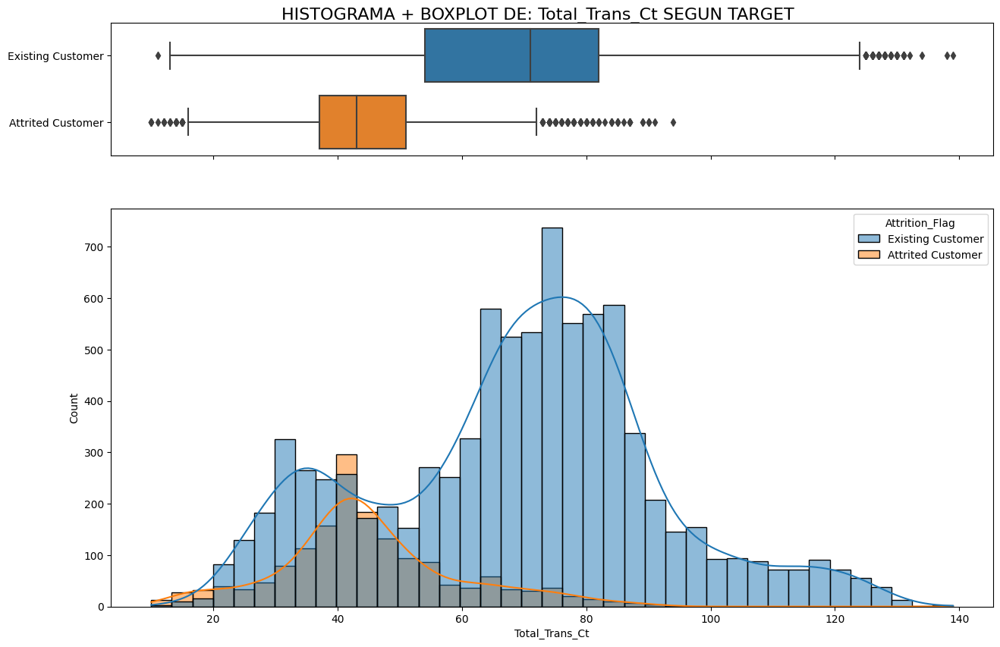

In [316]:
hist_box('Total_Trans_Ct','Attrition_Flag')

In [317]:
mediana_ttc = bank_df['Total_Trans_Ct'].groupby(bank_df['Attrition_Flag']).median()
print('Mediana del conteo total de transacciones por Attrition Flag')
print(mediana_ttc)

Mediana del conteo total de transacciones por Attrition Flag
Attrition_Flag
Attrited Customer    43.0
Existing Customer    71.0
Name: Total_Trans_Ct, dtype: float64


Ahora se calculan los Q1 y Q3 para sacar el IQR Vamos a usar una A para referirnos a los clientes ACTIVOS y una R para los clientes RETIRADOS

In [318]:
Q3R = bank_df[bank_df['Attrition_Flag'] == "Attrited Customer"].Total_Trans_Ct.quantile(0.75)
Q1R = bank_df[bank_df['Attrition_Flag'] == "Attrited Customer"].Total_Trans_Ct.quantile(0.25)
print("Q1R = ",Q1R)
print("Q3R = ",Q3R)
print("IQR Retirados = ", Q3R-Q1R)

Q1A = bank_df[bank_df['Attrition_Flag'] != "Attrited Customer"].Total_Trans_Ct.quantile(0.25)
Q3A = bank_df[bank_df['Attrition_Flag'] != "Attrited Customer"].Total_Trans_Ct.quantile(0.75)
print("Q1A = ",Q1A)
print("Q3A = ",Q3A)
print("IQR Activos = ", Q3A-Q1A)

Q1R =  37.0
Q3R =  51.0
IQR Retirados =  14.0
Q1A =  54.0
Q3A =  82.0
IQR Activos =  28.0


Podemos observar que la cantiad de transferencias realizada por clientes activos se encunentra entre 54 y 82. Mientras que la cantidad de transferencias realizadas por clientes retirados se concentra entre 37 y 51.

### Hipótesis 3


H3 = La media de la variacion en cantidad de transacciones Q4 -Q1 (1) es igual para clientes activos y retirados

H0 = La media de la variacion en cantidad de transacciones Q4 -Q1 (Total_Ct_Chng_Q4_Q1) es diferente para clientes activos y retirados

In [319]:
media_tcc_Q4Q1= bank_df['Total_Ct_Chng_Q4_Q1'].groupby(bank_df['Attrition_Flag']).mean()
sum_tcc_Q4Q1 = bank_df['Total_Ct_Chng_Q4_Q1'].groupby(bank_df['Attrition_Flag']).sum()
print('Media de cantidad de transferencias realizadas por Attrition Flag')
print(media_tcc_Q4Q1)
print('_ '*33)
print(' ')
print('Suma de cantidad de transferencias realizadas por Attrition Flag')
print(sum_tcc_Q4Q1)

Media de cantidad de transferencias realizadas por Attrition Flag
Attrition_Flag
Attrited Customer    0.554386
Existing Customer    0.742434
Name: Total_Ct_Chng_Q4_Q1, dtype: float64
_ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ 
 
Suma de cantidad de transferencias realizadas por Attrition Flag
Attrition_Flag
Attrited Customer     901.986
Existing Customer    6310.690
Name: Total_Ct_Chng_Q4_Q1, dtype: float64


Se nota que los valores de las medias son diferentes. Por lo que se descarta la H3 y se validaria la H0.

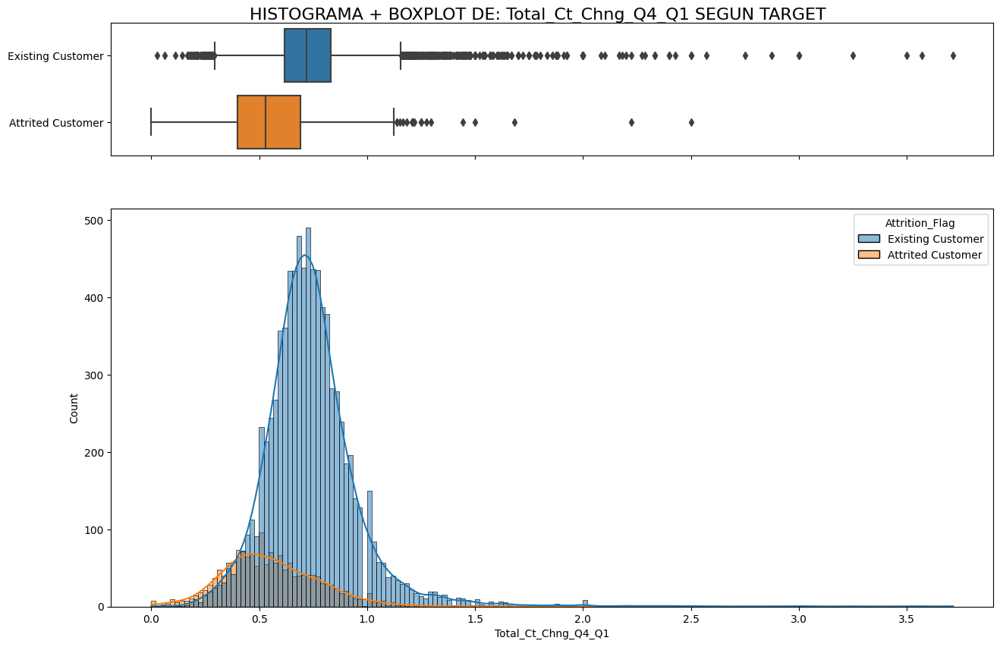

In [320]:
hist_box('Total_Ct_Chng_Q4_Q1','Attrition_Flag')

In [321]:
mediana_tcc_Q4Q1= bank_df['Total_Ct_Chng_Q4_Q1'].groupby(bank_df['Attrition_Flag']).median()
print('Mediana de cantidad de transferencias realizadas por Attrition Flag')
print(mediana_tcc_Q4Q1)

Mediana de cantidad de transferencias realizadas por Attrition Flag
Attrition_Flag
Attrited Customer    0.531
Existing Customer    0.721
Name: Total_Ct_Chng_Q4_Q1, dtype: float64


Ahora se calculan los Q1 y Q3 para sacar el IQR Vamos a usar una A para referirnos a los clientes ACTIVOS y una R para los clientes RETIRADOS

In [322]:
Q3R = bank_df[bank_df['Attrition_Flag'] == "Attrited Customer"].Total_Ct_Chng_Q4_Q1.quantile(0.75)
Q1R = bank_df[bank_df['Attrition_Flag'] == "Attrited Customer"].Total_Ct_Chng_Q4_Q1.quantile(0.25)
print("Q1R = ",Q1R)
print("Q3R = ",Q3R)
print("IQR Retirados = ", Q3R-Q1R)

Q1A = bank_df[bank_df['Attrition_Flag'] != "Attrited Customer"].Total_Ct_Chng_Q4_Q1.quantile(0.25)
Q3A = bank_df[bank_df['Attrition_Flag'] != "Attrited Customer"].Total_Ct_Chng_Q4_Q1.quantile(0.75)
print("Q1A = ",Q1A)
print("Q3A = ",Q3A)
print("IQR Activos = ", Q3A-Q1A)

Q1R =  0.4
Q3R =  0.692
IQR Retirados =  0.2919999999999999
Q1A =  0.617
Q3A =  0.833
IQR Activos =  0.21599999999999997


Podemos observar que la variación de la cantidad de transferencias realizadas por clientes activos se encuentra entre 0,61 y 0,833. Mientras que la cantidad de transferencias realizadas por clientes retirados se concentra entre 0,4 y 0,692..

### Pregunta 1 ¿Cúal es el género que más abandona la tarjeta de crédito?

In [323]:
gender_count = bank_df['Gender'].groupby(bank_df['Attrition_Flag']).value_counts()
print('Gender_count \n',gender_count)

Gender_count 
 Attrition_Flag     Gender
Attrited Customer  F          930
                   M          697
Existing Customer  F         4428
                   M         4072
Name: Gender, dtype: int64


In [324]:
gender_df = bank_df['Attrition_Flag'].groupby(bank_df['Gender']).value_counts().unstack()
gender_df['%_out'] = gender_df['Attrited Customer'] / (gender_df['Attrited Customer'] + gender_df['Existing Customer'])
gender_df.sort_values('%_out',ascending=False)

Attrition_Flag,Attrited Customer,Existing Customer,%_out
Gender,,,
F,930,4428,0.173572
M,697,4072,0.146152


Dentro del género femenino, abandonan aproximadamente un 17%

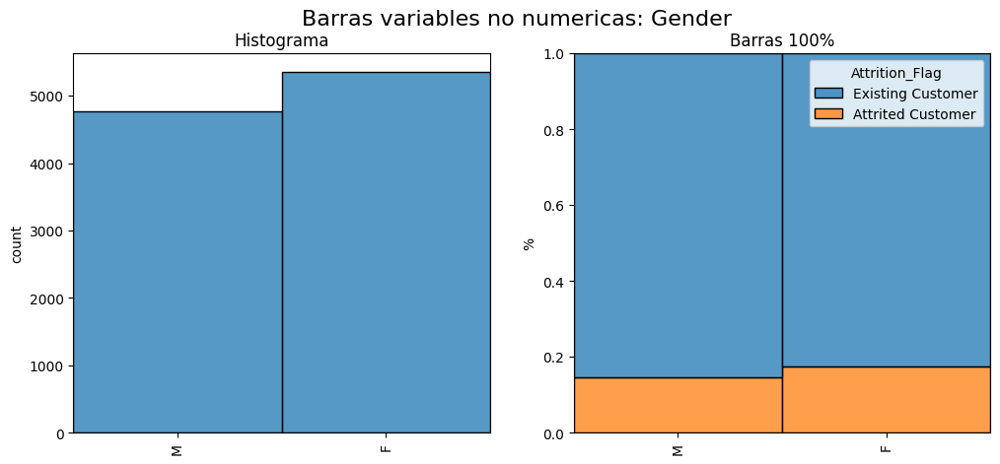

In [325]:
graf_cat('Gender')

### Pregunta 2: ¿Cúal es el estado civil de los clientes que abandonan el servicio?


In [326]:
marital_statuts_count = bank_df['Marital_Status'].groupby(bank_df['Attrition_Flag']).value_counts()
print('Marital_statuts_count \n',marital_statuts_count,)

Marital_statuts_count 
 Attrition_Flag     Marital_Status
Attrited Customer  Married            709
                   Single             668
                   Unknown            129
                   Divorced           121
Existing Customer  Married           3978
                   Single            3275
                   Divorced           627
                   Unknown            620
Name: Marital_Status, dtype: int64


In [327]:
marital_status_df = bank_df['Attrition_Flag'].groupby(bank_df['Marital_Status']).value_counts().unstack()
marital_status_df['%_out'] = marital_status_df['Attrited Customer'] / (marital_status_df['Attrited Customer'] + marital_status_df['Existing Customer'])
marital_status_df.sort_values('%_out',ascending=False)

Attrition_Flag,Attrited Customer,Existing Customer,%_out
Marital_Status,,,
Unknown,129,620,0.172230
Single,668,3275,0.169414
Divorced,121,627,0.161765
Married,709,3978,0.151269


Dentro del genero desconocido, un 17% abandona el servicio 

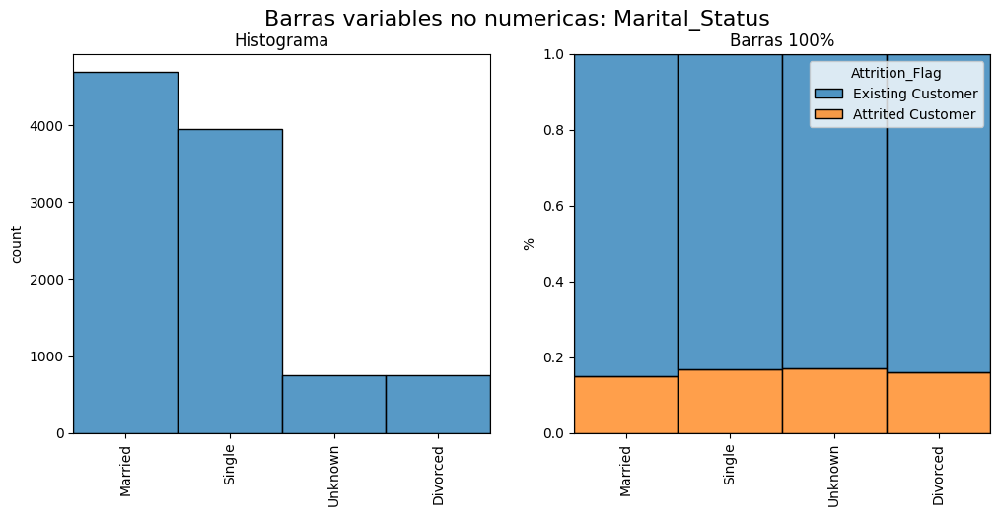

In [328]:
graf_cat('Marital_Status')

### Pregunta 3 ¿Que edades promedio tienen las personas que abandonan las tarjetas de crédito?

In [329]:
mean_years = bank_df['Customer_Age'].groupby(bank_df['Attrition_Flag']).mean()

print('mean_time Attrtied Customer\n',mean_years['Attrited Customer'])
print('mean_time Existing Customer\n',mean_years['Existing Customer'])

mean_time Attrtied Customer
 46.659496004917024
mean_time Existing Customer
 46.26211764705882


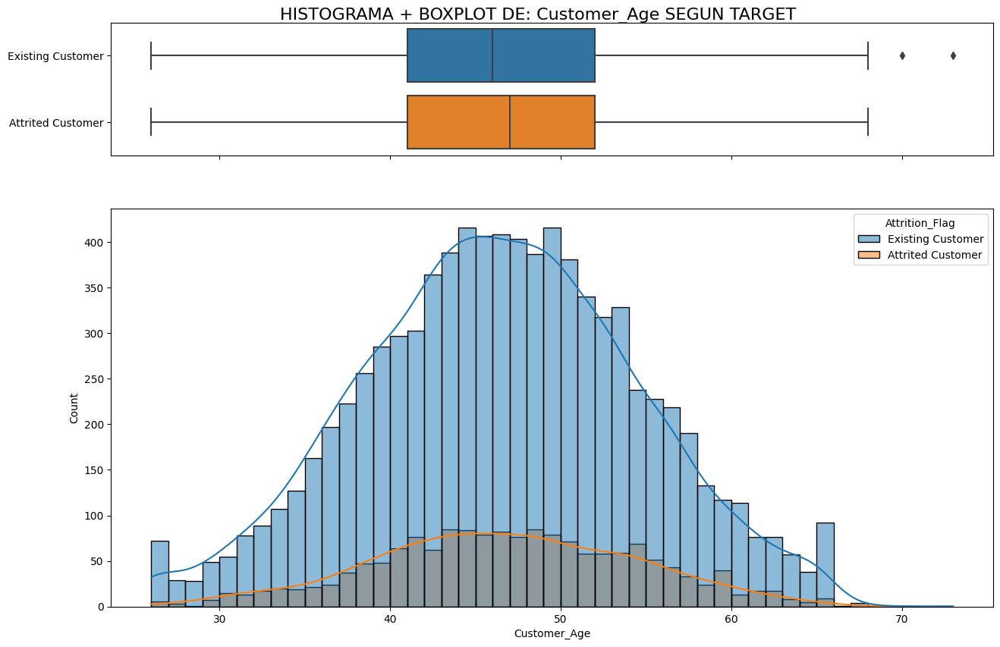

In [330]:
hist_box('Customer_Age','Attrition_Flag')

### Pregunta 4 ¿Cuanto tiempo sin utilizacion llevan las tarjetas de los clientes que abandonan?

In [331]:
mean_time = bank_df['Months_Inactive_12_mon'].groupby(bank_df['Attrition_Flag']).mean()
print('mean_time Attried Customer\n',mean_time['Attrited Customer'])
print('mean_time Existing Customer\n',mean_time['Existing Customer'])

mean_time Attried Customer
 2.693300553165335
mean_time Existing Customer
 2.273764705882353


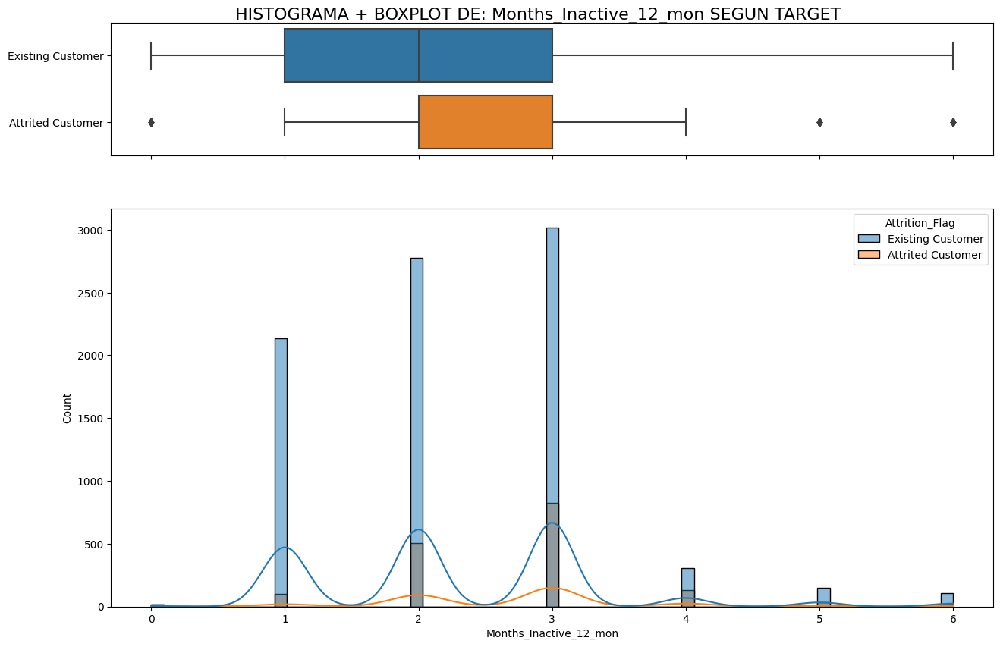

In [332]:
hist_box('Months_Inactive_12_mon','Attrition_Flag')

### Pregunta 5 ¿Que tipo de tarjeta usan los clientes que abandonan los servicios?

In [333]:
card_type = bank_df['Card_Category'].groupby(bank_df['Attrition_Flag']).value_counts()
print('card_type \n',card_type)

card_type 
 Attrition_Flag     Card_Category
Attrited Customer  Blue             1519
                   Silver             82
                   Gold               21
                   Platinum            5
Existing Customer  Blue             7917
                   Silver            473
                   Gold               95
                   Platinum           15
Name: Card_Category, dtype: int64


In [334]:
card_type_df = bank_df['Attrition_Flag'].groupby(bank_df['Card_Category']).value_counts().unstack()
card_type_df['%_out'] = card_type_df['Attrited Customer'] / (card_type_df['Attrited Customer'] + card_type_df['Existing Customer'])
card_type_df.sort_values('%_out',ascending=False)

Attrition_Flag,Attrited Customer,Existing Customer,%_out
Card_Category,,,
Platinum,5,15,0.250000
Gold,21,95,0.181034
Blue,1519,7917,0.160979
Silver,82,473,0.147748


Dentro de la categoria platinum, un 25% abandona el servicio. 

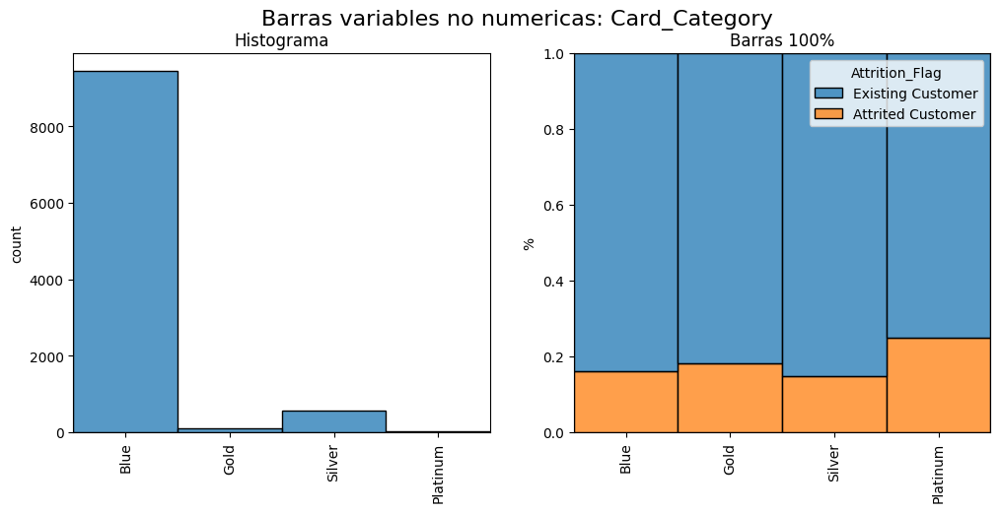

In [335]:
graf_cat('Card_Category')

### Pregunta 6 ¿Que nivel de educacion tienen los clientes que abanonan los servicios?

In [336]:
education_count = bank_df['Education_Level'].groupby(bank_df['Attrition_Flag']).value_counts()
print('education_count \n',education_count)

education_count 
 Attrition_Flag     Education_Level
Attrited Customer  Graduate            487
                   High School         306
                   Unknown             256
                   Uneducated          237
                   College             154
                   Doctorate            95
                   Post-Graduate        92
Existing Customer  Graduate           2641
                   High School        1707
                   Unknown            1263
                   Uneducated         1250
                   College             859
                   Post-Graduate       424
                   Doctorate           356
Name: Education_Level, dtype: int64


In [337]:
education_df = bank_df['Attrition_Flag'].groupby(bank_df['Education_Level']).value_counts().unstack()
education_df['%_out'] = education_df['Attrited Customer'] / (education_df['Attrited Customer'] + education_df['Existing Customer'])
education_df.sort_values('%_out',ascending=False)

Attrition_Flag,Attrited Customer,Existing Customer,%_out
Education_Level,,,
Doctorate,95,356,0.210643
Post-Graduate,92,424,0.178295
Unknown,256,1263,0.168532
Uneducated,237,1250,0.159381
Graduate,487,2641,0.155691
College,154,859,0.152024
High School,306,1707,0.152012




Dentro de el nivel de educacion Doctorado, el 21% abandona el servicio 

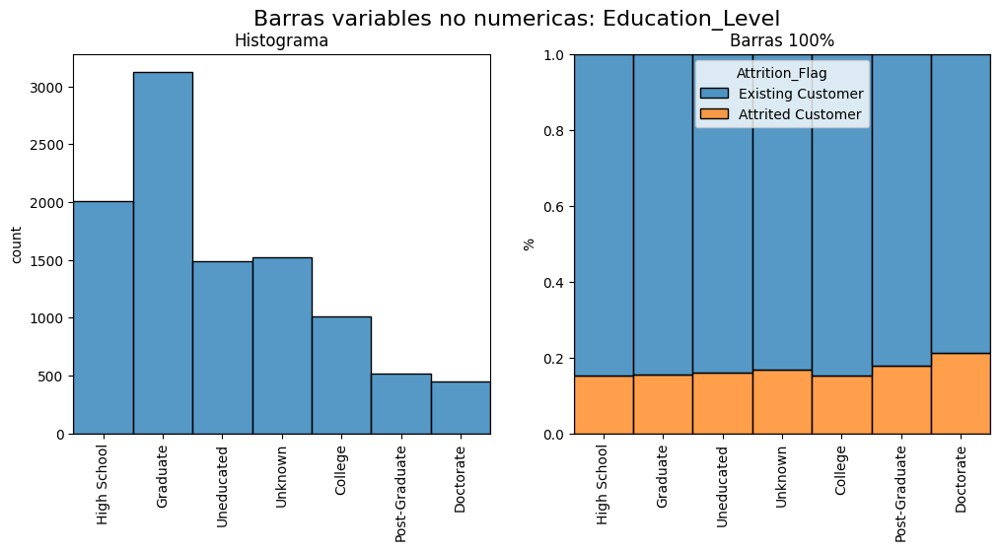

In [338]:
graf_cat('Education_Level')

### Pregunta 7 ¿Que nivel de ingresos tienen los clientes que abandonan los servicios?

In [339]:
income_level = bank_df['Income_Category'].groupby(bank_df['Attrition_Flag']).value_counts()
print('income_level \n',income_level)

income_level 
 Attrition_Flag     Income_Category
Attrited Customer  Less than $40K      612
                   $40K - $60K         271
                   $80K - $120K        242
                   $60K - $80K         189
                   Unknown             187
                   $120K +             126
Existing Customer  Less than $40K     2949
                   $40K - $60K        1519
                   $80K - $120K       1293
                   $60K - $80K        1213
                   Unknown             925
                   $120K +             601
Name: Income_Category, dtype: int64


In [340]:
income_lvl_df = bank_df['Attrition_Flag'].groupby(bank_df['Income_Category']).value_counts().unstack()
income_lvl_df['%_out'] = income_lvl_df['Attrited Customer'] / (income_lvl_df['Attrited Customer'] + income_lvl_df['Existing Customer'])
income_lvl_df.sort_values('%_out',ascending=False)

Attrition_Flag,Attrited Customer,Existing Customer,%_out
Income_Category,,,
$120K +,126,601,0.173315
Less than $40K,612,2949,0.171862
Unknown,187,925,0.168165
$80K - $120K,242,1293,0.157655
$40K - $60K,271,1519,0.151397
$60K - $80K,189,1213,0.134807


Dentro del nivel de ingresos de +120K, el 17,3% abandona el servicio.

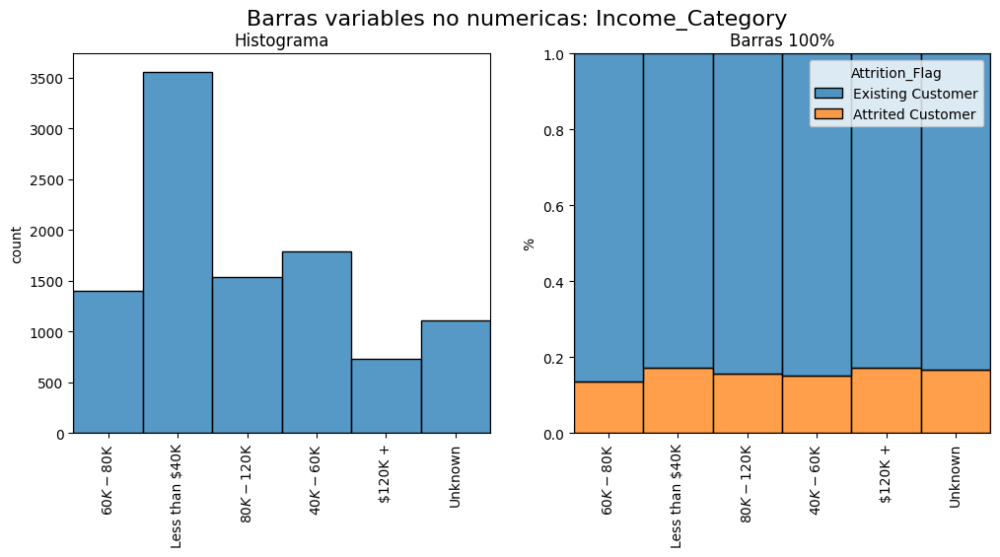

In [341]:
graf_cat('Income_Category')

## Correlación de variables

Se procede a realizar una matriz de correlación para poder determinar si existe o no una relación entre las diferentes variables

Para evitar confusion en los datos, se hace la matriz de correlacion pero con los valores absoltuos. De esta forma, todos los coeficientes seran positivos.

Podemos observar que la matriz de correlacion solo se calcula sobre valores numericos. Los valores categoricos fueron quitados de los datos de forma automatica.

**MATRIZ DE CORRELACION PEARSON**


<ipython-input-342-a2973ad20507>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data=bank_df.corr(method='pearson').abs(),


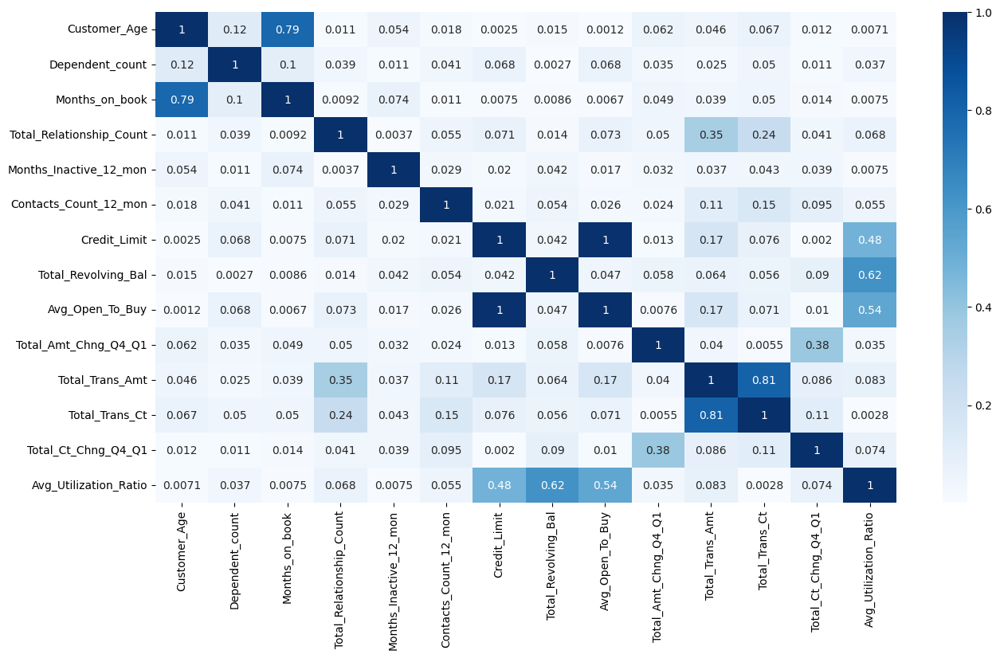

In [342]:
plt.figure(figsize=(15,8)).set_facecolor('white')
sns.heatmap(data=bank_df.corr(method='pearson').abs(),
            annot = True,
            cmap='Blues')
plt.show()

**MATRIZ DE CORRELACION KENDALL**

<ipython-input-343-64e39325e0f1>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data=bank_df.corr(method='kendall').abs(),


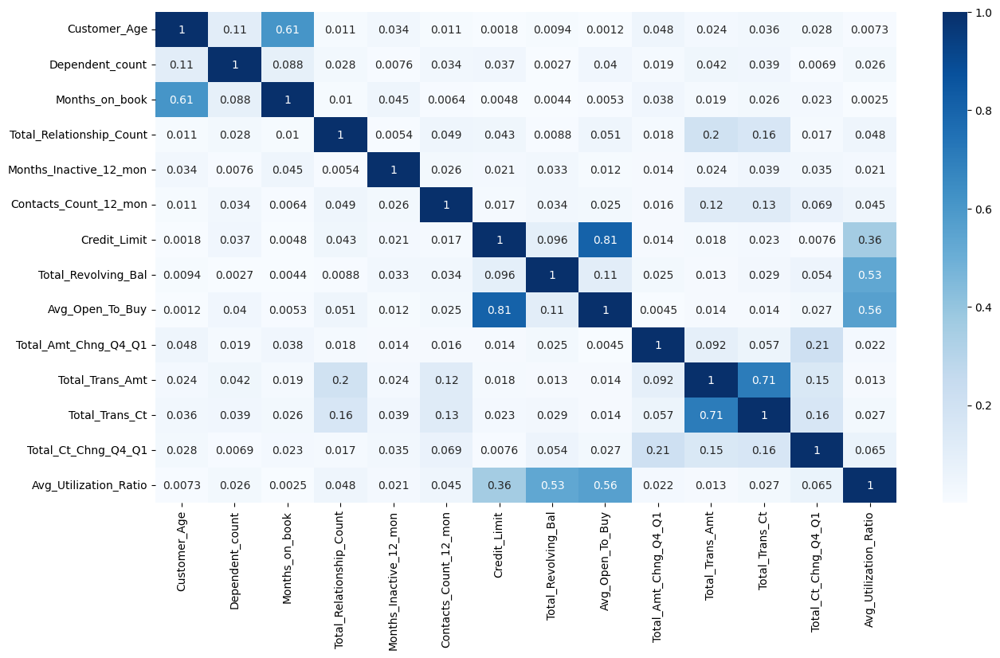

In [343]:
plt.figure(figsize=(15,8)).set_facecolor('white')
sns.heatmap(data=bank_df.corr(method='kendall').abs(),
            annot = True,
            cmap='Blues')
plt.show()

**MATRIZ DE CORRELACION SPEARMAN**

<ipython-input-344-5eda483b3d99>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data=bank_df.corr(method='spearman').abs(),


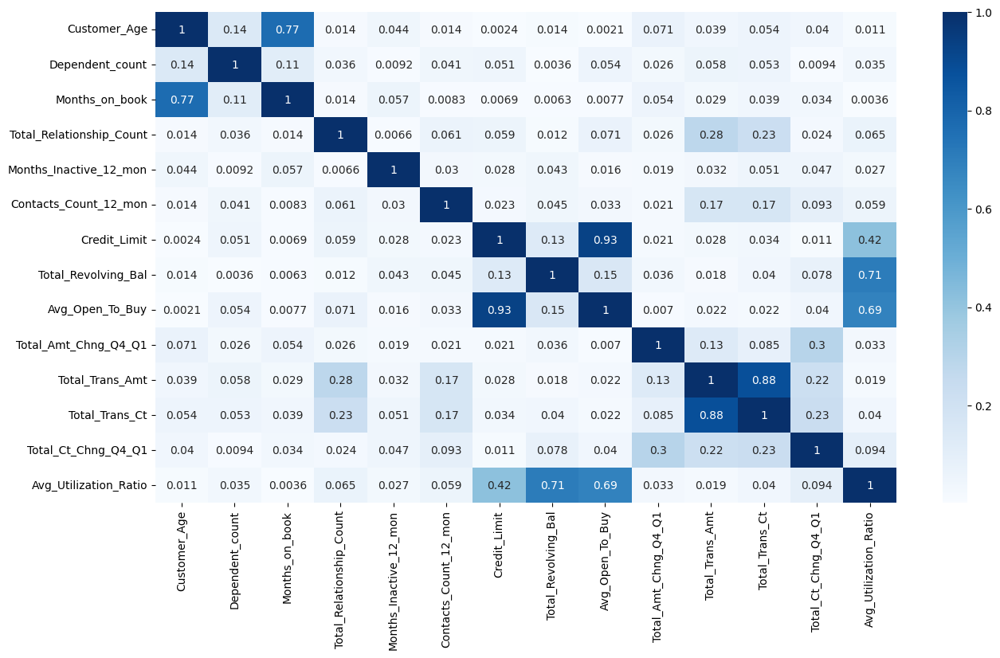

In [344]:
plt.figure(figsize=(15,8)).set_facecolor('white')
sns.heatmap(data=bank_df.corr(method='spearman').abs(),
            annot = True,
            cmap='Blues')
plt.show()

En los datos tenemos valores categoricos o del tipo "object" por lo que no podremos sacar mayores conclusiones sin antes quitarlos.

In [345]:
df = bank_df.drop(columns=['Card_Category','Marital_Status','Income_Category','Education_Level','Gender','Attrition_Flag'])   
# Aqui quitamos todas las columnas categoricas

In [346]:
df2 =correlaciones(df,10,'pearson')
df2.head()

Credit_Limit         Avg_Open_To_Buy          0.995981
Total_Trans_Amt      Total_Trans_Ct           0.807192
Customer_Age         Months_on_book           0.788912
Total_Revolving_Bal  Avg_Utilization_Ratio    0.624022
Avg_Open_To_Buy      Avg_Utilization_Ratio    0.538808
dtype: float64

In [347]:
df3 =correlaciones(df,10,'kendall')
df3.head()

Credit_Limit         Avg_Open_To_Buy          0.805012
Total_Trans_Amt      Total_Trans_Ct           0.707857
Customer_Age         Months_on_book           0.613382
Avg_Open_To_Buy      Avg_Utilization_Ratio    0.561205
Total_Revolving_Bal  Avg_Utilization_Ratio    0.533326
dtype: float64

In [348]:
df4 =correlaciones(df,10,'spearman')
df4.head()

Credit_Limit         Avg_Open_To_Buy          0.931431
Total_Trans_Amt      Total_Trans_Ct           0.879725
Customer_Age         Months_on_book           0.768901
Total_Revolving_Bal  Avg_Utilization_Ratio    0.708607
Avg_Open_To_Buy      Avg_Utilization_Ratio    0.685716
dtype: float64

Se hizo un analisis de correlacion segun los 3 tipos de coeficientes y el top5 de variables con mayor correlacion sigue siendo el mismo 

A continuacion, hacemos algunos graficos para "ver" esta correlacion entre variables. Adicionalmente, vamos a agruparlo por target

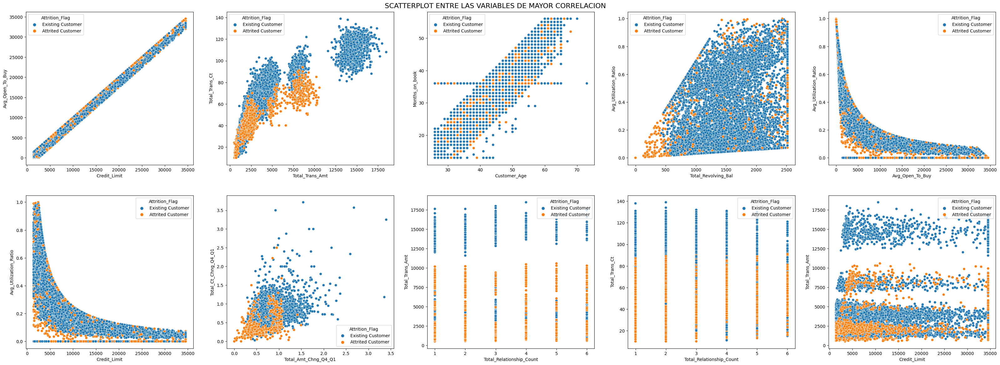

In [349]:
fig , axes = plt.subplots(2,5,figsize = (40,14))
plt.suptitle('SCATTERPLOT ENTRE LAS VARIABLES DE MAYOR CORRELACION',fontsize=16,y = 0.9)

i = 0
for fil in range(2):
  for col in range(5):
        sns.scatterplot(data=bank_df,
                      ax=axes[fil,col],
                      x=df2.index[i][0], 
                      y=df2.index[i][1],
                      hue ="Attrition_Flag"
                      )
        i = i + 1
plt.show()

<ipython-input-350-da8422e77a3c>:5: UserWarning: Ignoring `ax`; jointplot is a figure-level function.
  sns.jointplot(ax = axes,


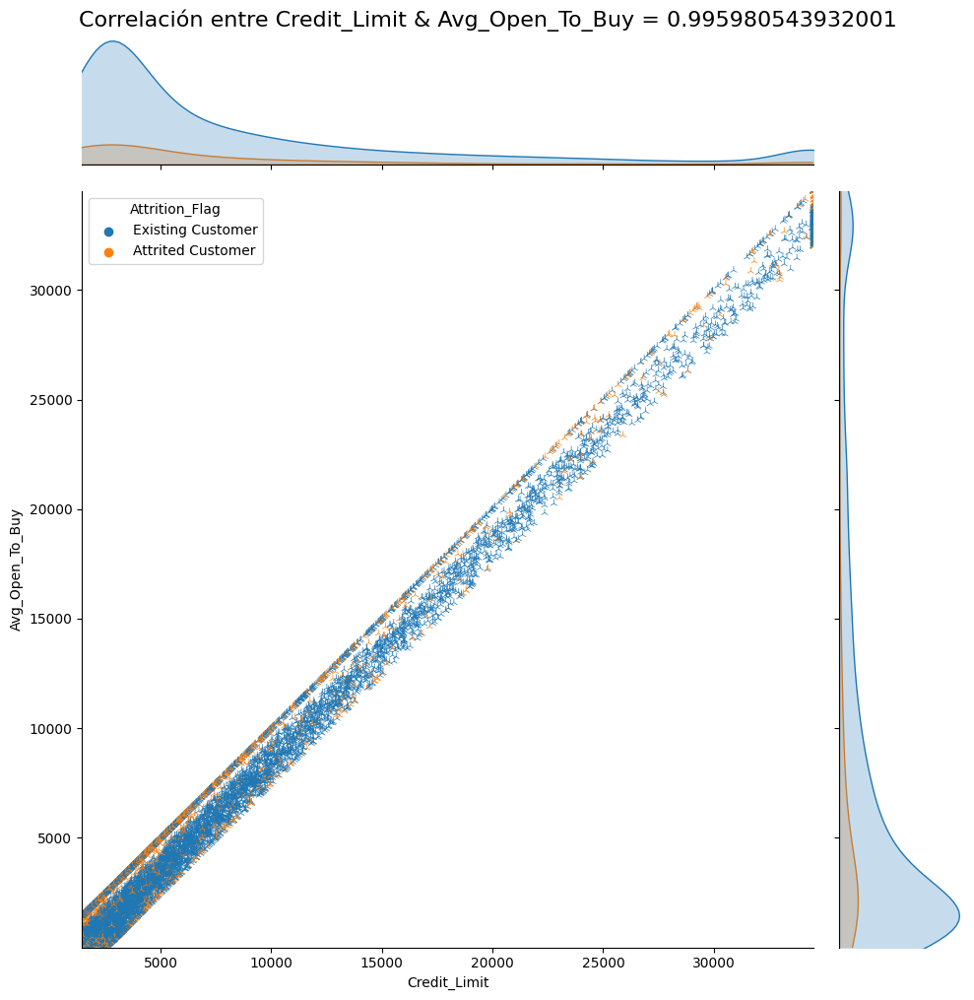

<ipython-input-350-da8422e77a3c>:5: UserWarning: Ignoring `ax`; jointplot is a figure-level function.
  sns.jointplot(ax = axes,


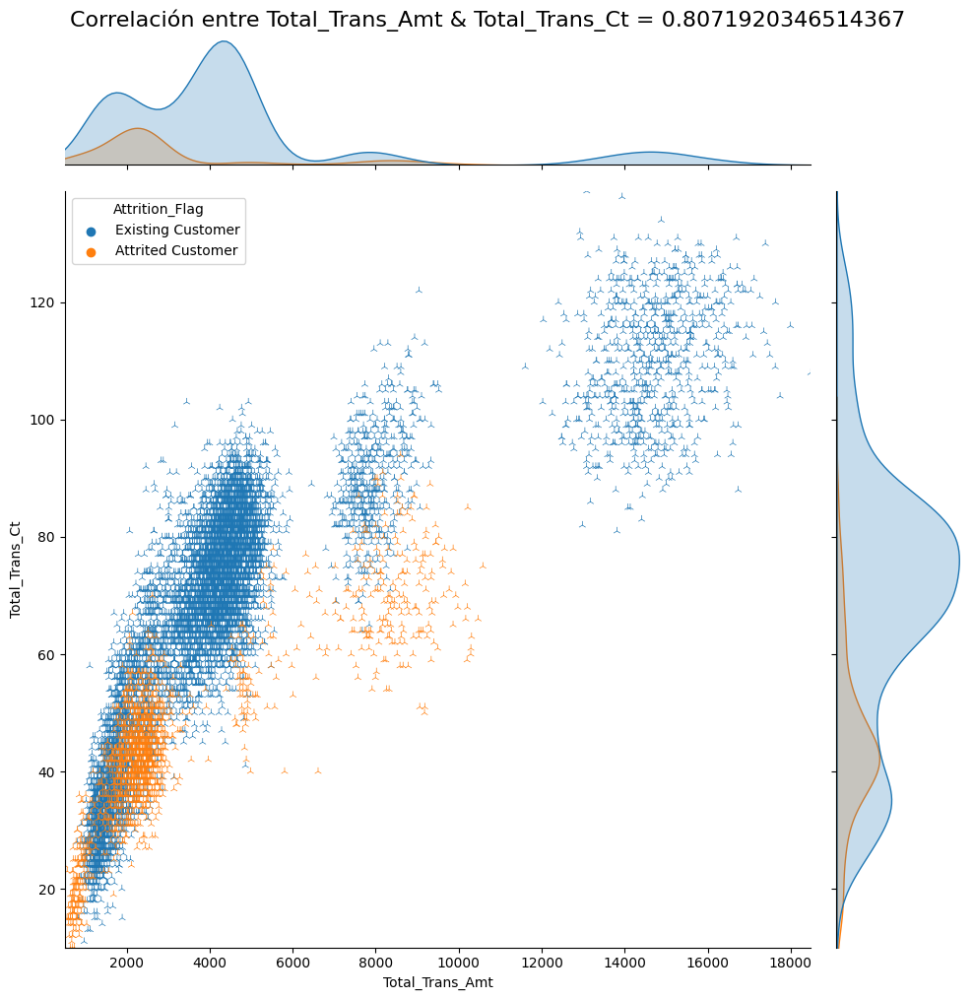

<ipython-input-350-da8422e77a3c>:5: UserWarning: Ignoring `ax`; jointplot is a figure-level function.
  sns.jointplot(ax = axes,


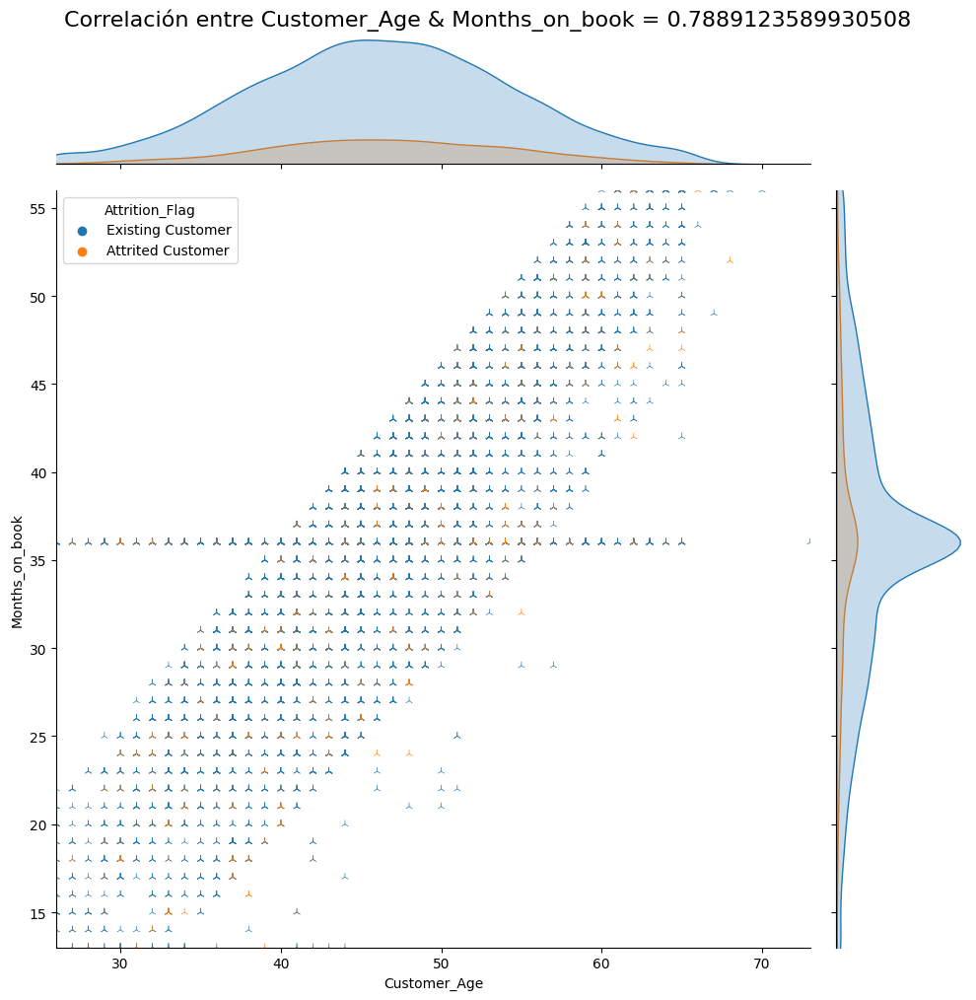

<ipython-input-350-da8422e77a3c>:5: UserWarning: Ignoring `ax`; jointplot is a figure-level function.
  sns.jointplot(ax = axes,


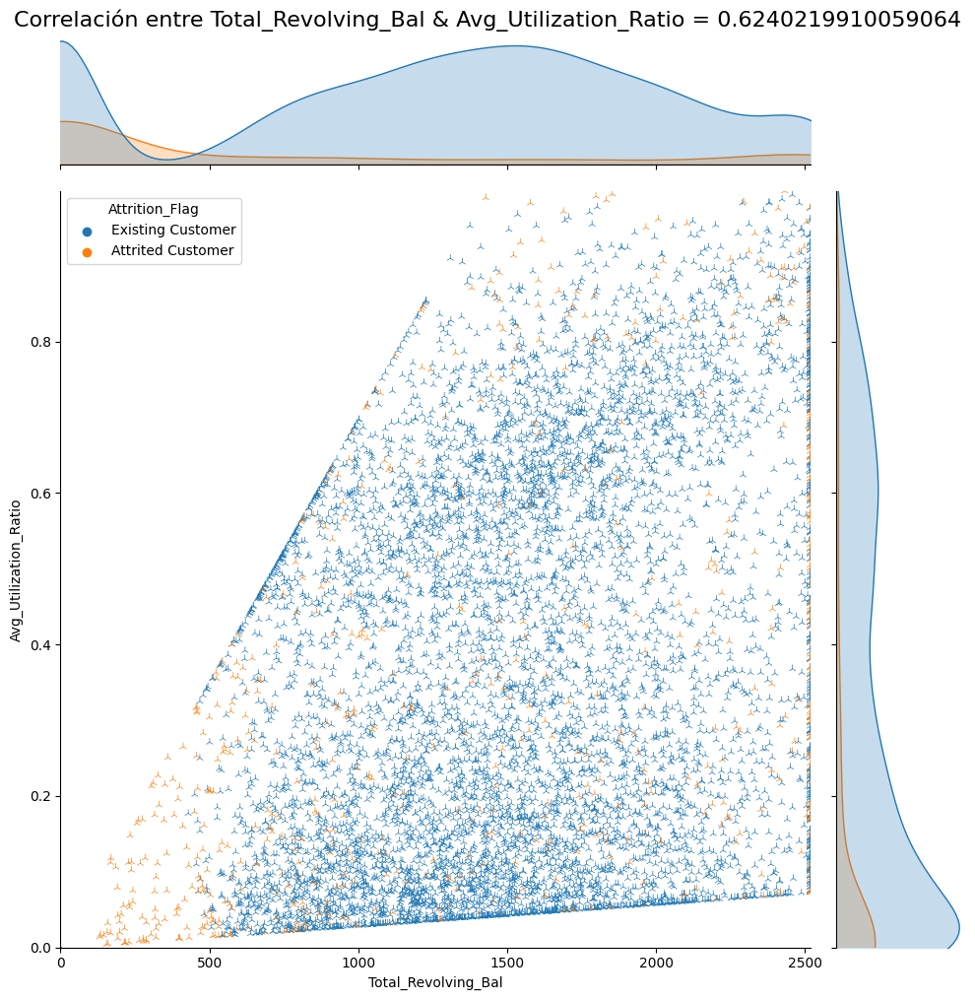

<ipython-input-350-da8422e77a3c>:5: UserWarning: Ignoring `ax`; jointplot is a figure-level function.
  sns.jointplot(ax = axes,


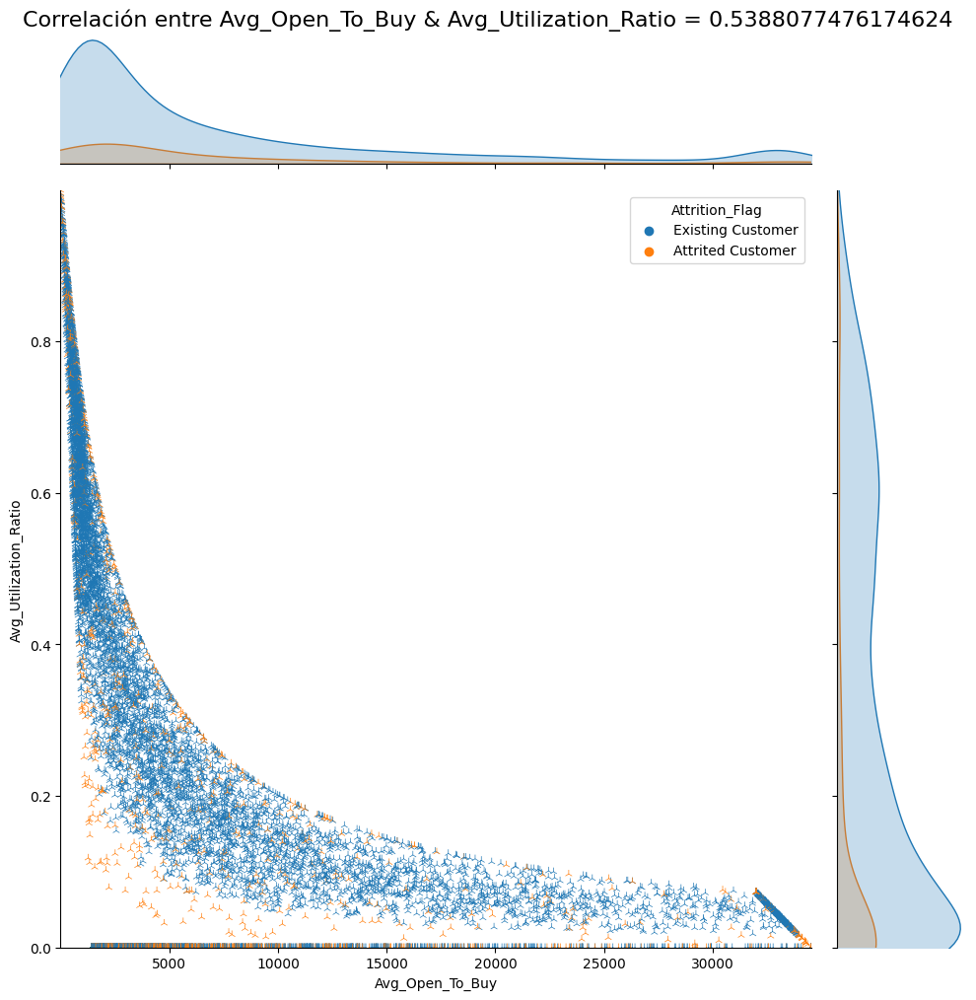

<ipython-input-350-da8422e77a3c>:5: UserWarning: Ignoring `ax`; jointplot is a figure-level function.
  sns.jointplot(ax = axes,


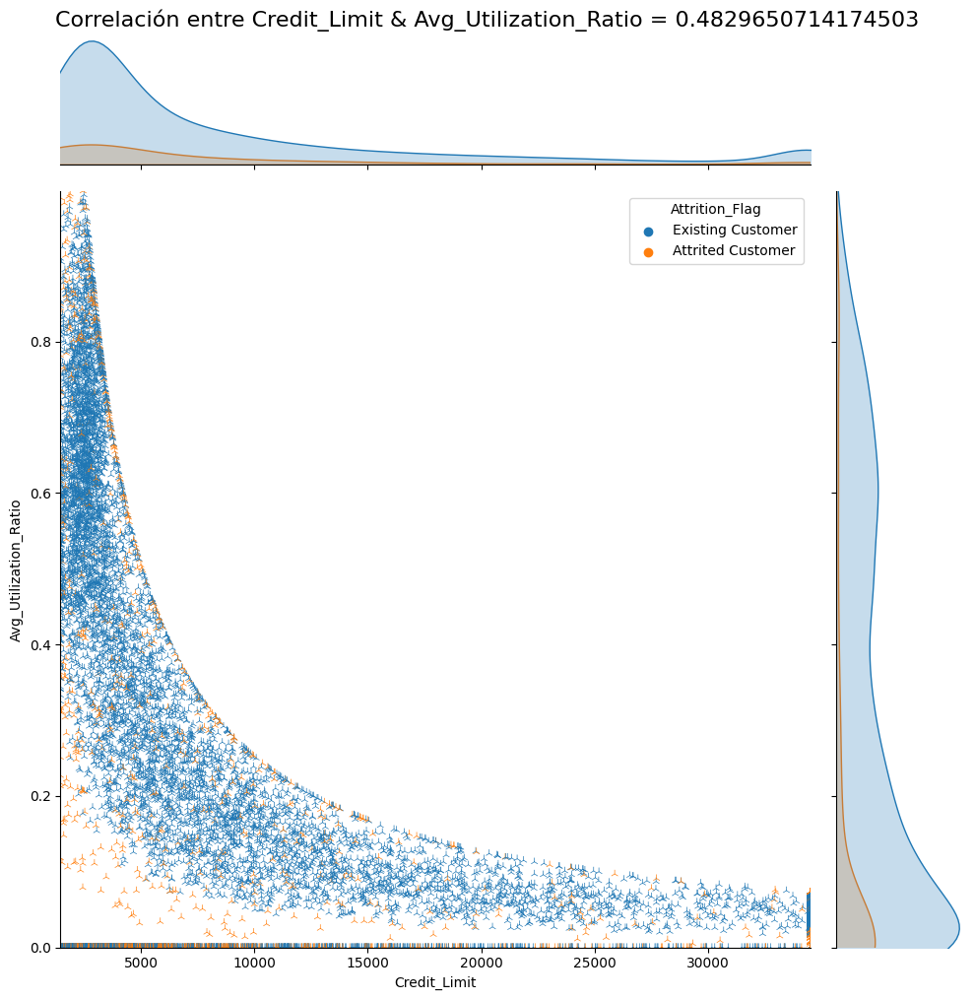

<ipython-input-350-da8422e77a3c>:5: UserWarning: Ignoring `ax`; jointplot is a figure-level function.
  sns.jointplot(ax = axes,


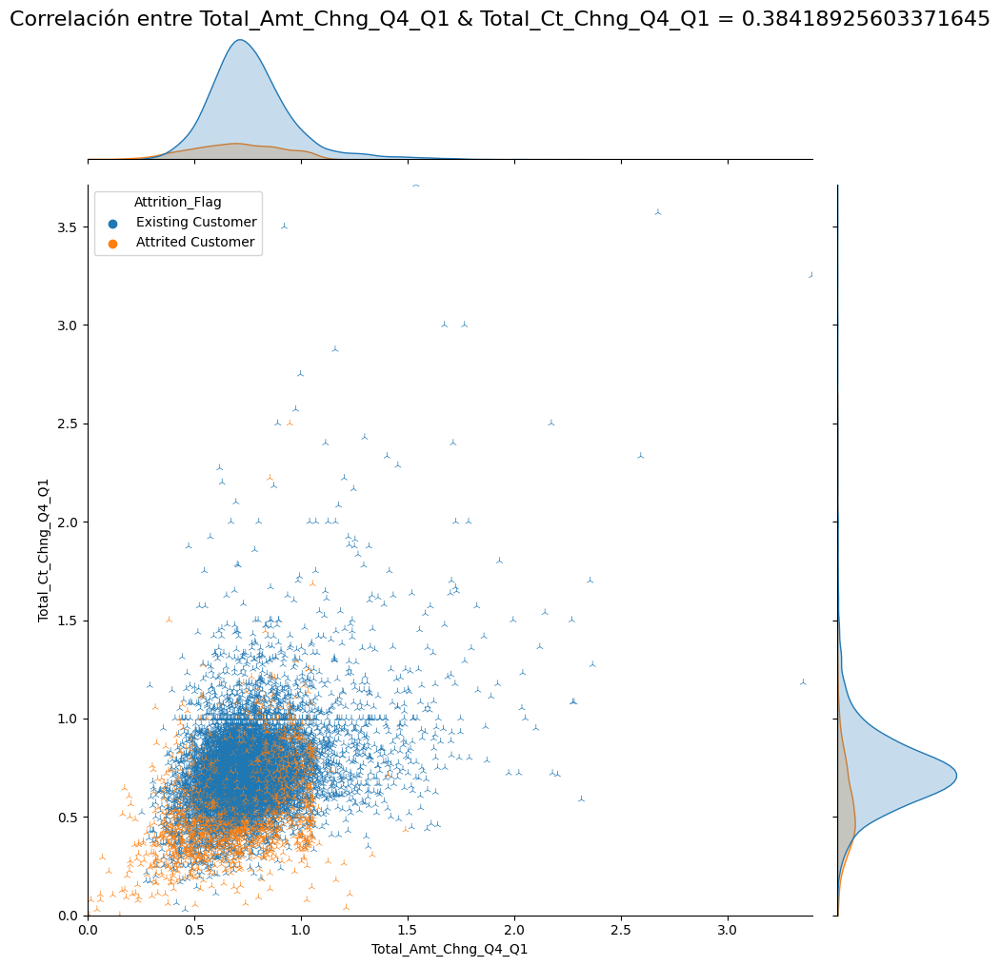

<ipython-input-350-da8422e77a3c>:5: UserWarning: Ignoring `ax`; jointplot is a figure-level function.
  sns.jointplot(ax = axes,


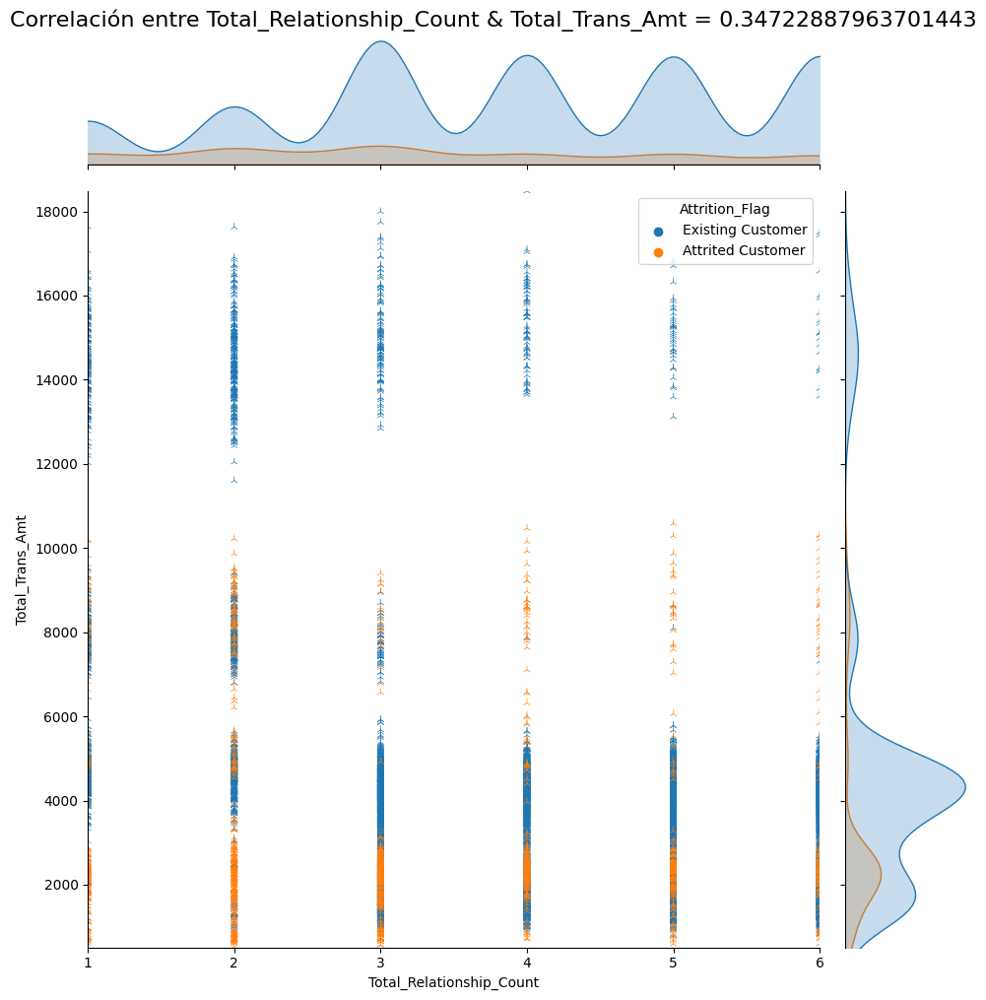

<ipython-input-350-da8422e77a3c>:5: UserWarning: Ignoring `ax`; jointplot is a figure-level function.
  sns.jointplot(ax = axes,


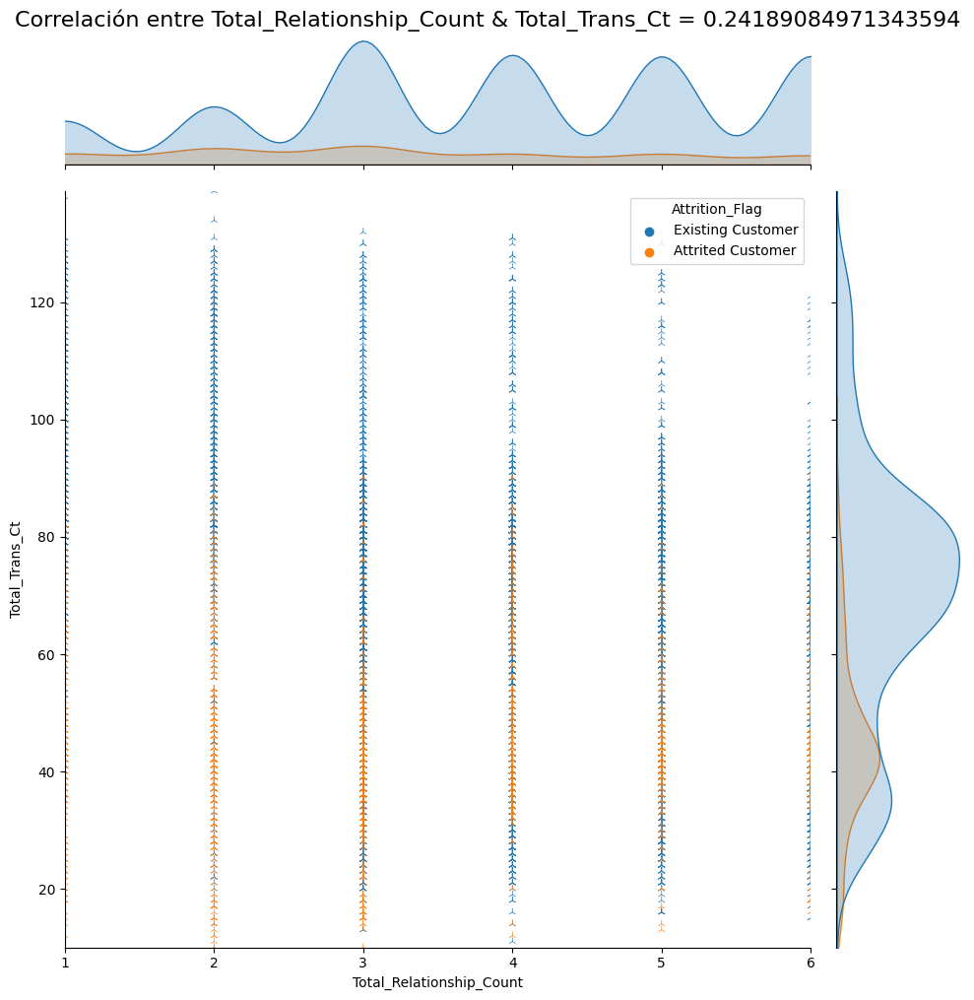

<ipython-input-350-da8422e77a3c>:5: UserWarning: Ignoring `ax`; jointplot is a figure-level function.
  sns.jointplot(ax = axes,


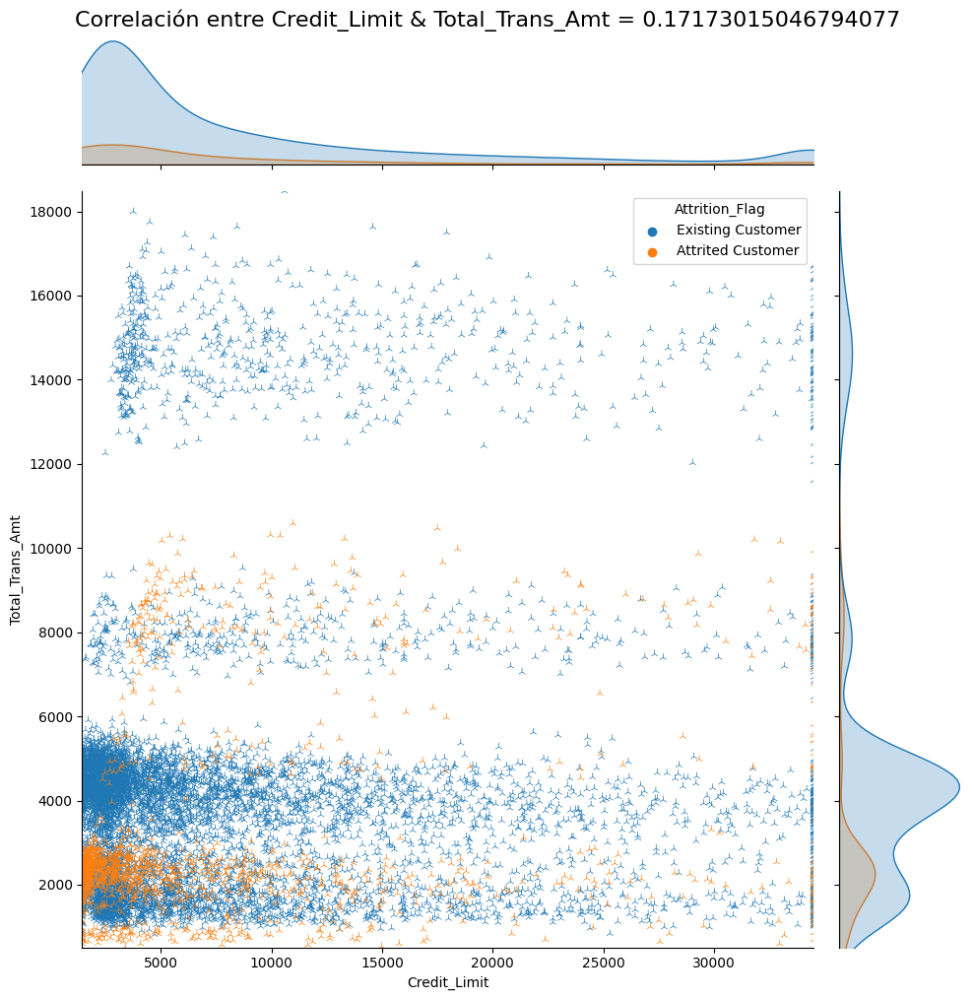

In [350]:
i = 0
for fil in range(2):
  for col in range(5):
    titulo = f"Correlación entre {df2.index[i][0]} & {df2.index[i][1]} = {df2[i]}"
    sns.jointplot(ax = axes,
                    data=bank_df,
                    x=df2.index[i][0], 
                    y=df2.index[i][1],
                    hue ="Attrition_Flag",
                    kind="scatter",
                    marker = '2',
                    alpha=1,
                    height= 10,
                    ratio = 5,
                    xlim = (bank_df[df2.index[i][0]].min(),bank_df[df2.index[i][0]].max()),
                    ylim = (bank_df[df2.index[i][1]].min(),bank_df[df2.index[i][1]].max())
                    ).figure.set_facecolor('white')
    # .figure.set_facecolor('white') con este metodo de plt.figure podemos darle fondo blanco a todo. 
    # el jointplot de seaborn es una JointGrid que tiene los mismos metodos que las figure de plt.
    
    plt.suptitle(titulo,fontsize=16,y = 1.01)
    plt.show()
    i = i + 1

Tenemos algunas relaciones lineales mas fuertes entre algunas variables como 

- Credit_Limit / Avg_Open_To_Buy = 0.995981

- Total_Trans_Amt / Total_Trans_Ct = 0.807192

- Customer_Age / Months_on_book = 0.788912

- Total_Revolving_Bal / Avg_Utilization_Ratio = 0.624022

Por otro lado, tenemos otras variables que tienen la siguiente relacion lineal:

- Avg_Open_To_Buy / Avg_Utilization_Ratio = 0.538807

- Credit_Limit / Avg_Utilization_Ratio = 0.482965

La misma NO es muy elevada. Pero observando los graficos anteriores, podemos notar un comportamiento logaritmico. 

En funcion de la alta correlacion que tenemos entre credit_limit y avg_open_to_buy, podriamos quitar una de las variables para no pasar el mismo dato 2 veces al modelo y analizar como se modifica el rendimiento de este.

# 6-Modelos

Antes de comenzar a probar diferentes modelos, vamos a realizar algunas transfomraciones en los datos. 


## Transformacion de datos

In [351]:
cat_columns = bank_df.drop('Attrition_Flag',axis=1).select_dtypes(include='object').columns
numeric_columns = bank_df.select_dtypes(include=np.number).columns

In [352]:
cat_columns

Index(['Gender', 'Education_Level', 'Marital_Status', 'Income_Category',
       'Card_Category'],
      dtype='object')

In [353]:
numeric_columns

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [354]:
lista = []
for col in cat_columns:
  info = (col, bank_df[col].nunique(), bank_df[col].unique() )
  lista.append(info)
pd.DataFrame(lista, columns=['feature', 'cantidad', 'valores'])

,feature,cantidad,valores
0,Gender,2,"[M, F]"
1,Education_Level,7,"[High School, Graduate, Uneducated, Unknown, C..."
2,Marital_Status,4,"[Married, Single, Unknown, Divorced]"
3,Income_Category,6,"[$60K - $80K, Less than $40K, $80K - $120K, $4..."
4,Card_Category,4,"[Blue, Gold, Silver, Platinum]"


En funcion de esto y de la naturaleza de las mismas, decidimos codificarlas de la siguiente forma. El nivel de educacion, nivel de ingresos y categoria de tarjeta de credito, lo codificamos con un label encoder ya que pueden ordenarse. Y las otras dos variables, que son genero y estado civil los clasificamos con un OHE ya que no tiene un ordenamiento. 

In [355]:
bank_df.Attrition_Flag.value_counts(normalize=True)

Existing Customer    0.83934
Attrited Customer    0.16066
Name: Attrition_Flag, dtype: float64

Tambien observamos que los clientes que dejan el servicio son un porcentaje muy bajo del total, por lo que va a ser necesario dividir los conjuntos de manera estratificada. 

In [356]:
X = bank_df.drop('Attrition_Flag',axis=1)
y = bank_df['Attrition_Flag']

In [357]:
X_train , X_test , y_train , y_test = train_test_split(X,y,test_size = 0.2 , random_state =7 ,stratify = y)

In [358]:
X_train['Education_Level'].unique()

array(['College', 'Graduate', 'Unknown', 'High School', 'Post-Graduate',
       'Doctorate', 'Uneducated'], dtype=object)

In [359]:
X_train['Income_Category'].unique()

array(['Less than $40K', '$40K - $60K', '$60K - $80K', '$80K - $120K',
       '$120K +', 'Unknown'], dtype=object)

Este sera el ordenamiento que le vamos a dar a las variables cateogricas en el OrdinalEncoder

In [360]:
orden_educacion = ['Unknown','Uneducated','Graduate','Post-Graduate','High School','College','Doctorate']
orden_income_cat = ['Unknown','Less than $40K','$40K - $60K','$60K - $80K','$80K - $120K','$120K +']
orden_card_cat = ['Blue','Silver','Gold','Platinum']

In [361]:
enc_ordenado = OrdinalEncoder(categories=[orden_educacion,orden_income_cat,orden_card_cat])

In [362]:
enc_ordenado.fit(X_train[['Education_Level','Income_Category','Card_Category']])

OrdinalEncoder(categories=[['Unknown', 'Uneducated', 'Graduate',
                            'Post-Graduate', 'High School', 'College',
                            'Doctorate'],
                           ['Unknown', 'Less than $40K', '$40K - $60K',
                            '$60K - $80K', '$80K - $120K', '$120K +'],
                           ['Blue', 'Silver', 'Gold', 'Platinum']])

In [363]:
X_train_t1 = X_train.copy()

In [364]:
X_train_t1[['Education_Level','Income_Category','Card_Category']] = enc_ordenado.transform(X_train[['Education_Level','Income_Category','Card_Category']])

Y estas seran las variables que quedan que no son numericas. Las mismas seran codificadas mediante un OHE

In [365]:
X_train_t1.select_dtypes(include='object').columns

Index(['Gender', 'Marital_Status'], dtype='object')

In [366]:
ohe = OneHotEncoder(drop='first')

In [367]:
ohe.fit(X_train_t1[['Gender','Marital_Status']])

OneHotEncoder(drop='first')

Estas que vemos a continuacion son las columnas de salida

In [368]:
ohe.get_feature_names_out(['Gender','Marital_Status'])

array(['Gender_M', 'Marital_Status_Married', 'Marital_Status_Single',
       'Marital_Status_Unknown'], dtype=object)

Creamos un DataFrame con las nuevas columnas codificadas

In [369]:
enc_data = pd.DataFrame(ohe.fit_transform(X_train_t1[['Gender','Marital_Status']]).toarray(),
                        columns=ohe.get_feature_names_out(['Gender','Marital_Status']),
                        index=X_train.index)

Luego creamos un nuevo DataFrame de training, uniendo el DataFrame anterior, con el generado por el OHE. Junto con esto, dropeamos las columas que ahora se encuentran codificadas ('Gender','Marital_Status')

In [370]:
X_train_t2 = X_train_t1.join(enc_data).drop(columns=['Gender','Marital_Status'])

Hacemos lo mismo con los datos de test

In [371]:
X_test_t1 = X_test.copy()
X_test_t1[['Education_Level','Income_Category','Card_Category']] = enc_ordenado.transform(X_test[['Education_Level','Income_Category','Card_Category']])

In [372]:
enc_data_2 = pd.DataFrame(ohe.fit_transform(X_test_t1[['Gender','Marital_Status']]).toarray(),
                          columns=ohe.get_feature_names_out(['Gender','Marital_Status'])
                          ,index=X_test.index)
X_test_t2 = X_test_t1.join(enc_data_2).drop(columns=['Gender','Marital_Status'])

### Pipelines

- - -
Pipeline con OHE + Ordinalencoder(con MinMaxScaler) | (enc)
- - -

Se van a hacer todas las transformaciones anteriores pero con pipelines. En el titulo se puede ver un (enc) ya que con estee prefijo se veran estos datos mas adelante.

In [373]:
orden_educacion = ['Unknown','Uneducated','Graduate','Post-Graduate','High School','College','Doctorate']
orden_income_cat = ['Unknown','Less than $40K','$40K - $60K','$60K - $80K','$80K - $120K','$120K +']
orden_card_cat = ['Blue','Silver','Gold','Platinum']
categorias = [orden_educacion,orden_income_cat,orden_card_cat]
col_ordinal_enc = ['Education_Level','Income_Category','Card_Category']
col_ohe_enc = ['Gender', 'Marital_Status']

Le vamos a agregar un MinMaxScaler para que las variables categoricas ordinales vayan de 0 a 1.

In [374]:
ordinal_pipe = Pipeline(
    steps=[('ord_enc',OrdinalEncoder(categories=categorias)),
           ('min_max_scaler',MinMaxScaler())]

)
# ordinal_pipe = Pipeline(
#     steps=[('ord_enc',OrdinalEncoder(categories=categorias))]

# )

In [375]:
ohe_pipe = Pipeline(
    steps=[('ohe_enc',OneHotEncoder(drop='first'))]
)

In [376]:
preprocess = ColumnTransformer(
    transformers=[
        ('Cat_ordinales',ordinal_pipe,col_ordinal_enc),
        ('Cat_no_ordinales',ohe_pipe,col_ohe_enc)],
        remainder='passthrough'   # Usando este parametro, las columnas que no transformamos quedan como estaban. Sino se borran y hay que agregarlas despues
)

In [377]:
preprocess.fit(X_train)

ColumnTransformer(remainder='passthrough',
                  transformers=[('Cat_ordinales',
                                 Pipeline(steps=[('ord_enc',
                                                  OrdinalEncoder(categories=[['Unknown',
                                                                              'Uneducated',
                                                                              'Graduate',
                                                                              'Post-Graduate',
                                                                              'High '
                                                                              'School',
                                                                              'College',
                                                                              'Doctorate'],
                                                                             ['Unknown',
                                                                              'Less '
                                                                              'than '
                                                                              '$40K',
                                                                              '$40K '
                                                                              '- '
                                                                              '$60K',
                                                                              '$60K '
                                                                              '- '
                                                                              '$80K',
                                                                              '$80K '
                                                                              '- '
                                                                              '$120K',
                                                                              '$120K '
                                                                              '+'],
                                                                             ['Blue',
                                                                              'Silver',
                                                                              'Gold',
                                                                              'Platinum']])),
                                                 ('min_max_scaler',
                                                  MinMaxScaler())]),
                                 ['Education_Level', 'Income_Category',
                                  'Card_Category']),
                                ('Cat_no_ordinales',
                                 Pipeline(steps=[('ohe_enc',
                                                  OneHotEncoder(drop='first'))]),
                                 ['Gender', 'Marital_Status'])])

In [378]:
colum_ord = preprocess.named_transformers_['Cat_ordinales'].named_steps['ord_enc'].get_feature_names_out(col_ordinal_enc)
colum_ohe = preprocess.named_transformers_['Cat_no_ordinales'].named_steps['ohe_enc'].get_feature_names_out(col_ohe_enc)
col_no_transf = [col for col in X_train.columns if col not in col_ordinal_enc + col_ohe_enc ]

In [379]:
X_train_enc = pd.DataFrame(preprocess.fit_transform(X_train),columns = (list(colum_ord)+list(colum_ohe)+list(col_no_transf)),index = X_train.index)
X_test_enc = pd.DataFrame(preprocess.fit_transform(X_test),columns = (list(colum_ord)+list(colum_ohe)+list(col_no_transf)),index = X_test.index)



---

Pipeline con OHE | (enc1)


---



In [380]:
var_no_num.remove('Attrition_Flag')

In [381]:
cat_ordinal_enc = Pipeline(
    steps=[('ohe',OneHotEncoder(handle_unknown='ignore', 
                                sparse=False,
                                drop = 'first'))]
)

Investigando en internet, enconrte que quiza no sea necesario hacer el drop = 'first' en todos los casos.

Se debe hacer un analisis de la salida de los datos y ver si estan o no correlacinados entre si. Mas adelante se hace otra serie de transofrmaciones en donde, mediante una matriz de correlacion se detecta si existe o no una alta correlacion entre las variables una vez aplicado el OHE sin usar el drop='first'

In [382]:
# Estoy 95% seguro que no tengo que usar un columnTransformer si solo voy a hacer una transformacion
# Estas lineas de codigo eran para agregar una lista de transofrmaciones ordenadas que 
# Se irian ejecutando en orden.

preprocess1 = ColumnTransformer(
    transformers=[
        ('cat_nom',cat_ordinal_enc,var_no_num)
    ]
)

In [383]:
preprocess1.fit(X_train)

/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


ColumnTransformer(transformers=[('cat_nom',
                                 Pipeline(steps=[('ohe',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore',
                                                                sparse=False))]),
                                 ['Gender', 'Education_Level', 'Marital_Status',
                                  'Income_Category', 'Card_Category'])])

In [384]:
colum = preprocess1.named_transformers_['cat_nom']['ohe'].get_feature_names_out(var_no_num)

In [385]:
pipe_out = pd.DataFrame(preprocess1.transform(X_train),columns = (list(colum)), index = X_train.index ) 

In [386]:
X_train_enc1 = pd.concat([X_train[var_num],pipe_out],axis=1)

In [387]:
pd.set_option('display.max_columns', None)

Ahora transformamos los datos de test

In [388]:
pipe_out2 = pd.DataFrame(preprocess1.transform(X_test),columns = (list(colum)), index = X_test.index )
X_test_enc1 = pd.concat([X_test[var_num],pipe_out2],axis=1)



---

Pipeline con OHE, OrdinalEncoder y resto numerico MinMaXScaler | (enc2)

---



Lo vamos a plantear de otra forma y le vamos a hacer un MinMaxScaler a algunas columnas numericas

In [389]:
X_train.describe().T

,count,mean,std,min,25%,50%,75%,max
Customer_Age,8101.0,46.404765,8.055776,26.0,41.000,46.000,52.000,73.000
Dependent_count,8101.0,2.343044,1.302878,0.0,1.000,2.000,3.000,5.000
Months_on_book,8101.0,36.004567,8.010185,13.0,32.000,36.000,40.000,56.000
Total_Relationship_Count,8101.0,3.811134,1.557579,1.0,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,8101.0,2.342550,1.015462,0.0,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,8101.0,2.456487,1.112328,0.0,2.000,2.000,3.000,6.000
Credit_Limit,8101.0,8664.862597,9128.858792,1438.3,2568.000,4561.000,11042.000,34516.000
Total_Revolving_Bal,8101.0,1159.599309,817.157671,0.0,278.000,1272.000,1784.000,2517.000
Avg_Open_To_Buy,8101.0,7505.263288,9128.841948,3.0,1338.000,3498.000,9851.000,34516.000
Total_Amt_Chng_Q4_Q1,8101.0,0.758921,0.220471,0.0,0.629,0.736,0.860,3.397


Vamos a hacer un MinMaxScaler en todas las nuemricas, sin tener en cuenta la variablee Avg_Utilization_Ratio 

In [390]:
minmax_col = var_num.drop('Avg_Utilization_Ratio')

In [391]:
min_max = Pipeline([
    ('minmax', MinMaxScaler())]
)

In [392]:
preprocess2 = ColumnTransformer(
    transformers=[
        ('cat_nom',cat_ordinal_enc,var_no_num),
        ('min_max_scaler',min_max,minmax_col)],
        remainder='passthrough'   # Usando este parametro, las columnas que no transformamos quedan como estaban. Sino se borran y hay que agregarlas despues
)

In [393]:
X_train_enc2 = pd.DataFrame(preprocess2.fit_transform(X_train),columns = (list(colum)+list(var_num)),index = X_train.index)

/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [394]:
X_test_enc2 = pd.DataFrame(preprocess2.fit_transform(X_test),columns = (list(colum)+list(var_num)),index = X_test.index)

/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(




---

Pipeline OHE sin drop = 'first' pero quitando columnas correlacionadas | (enc3)

---

In [395]:
cat_ordinal_enc2 = Pipeline(
    steps=[('ohe',OneHotEncoder(handle_unknown='ignore', 
                                sparse=False,))]
)

In [396]:
preprocess3 = ColumnTransformer(
    transformers=[
        ('cat_nom',cat_ordinal_enc2,var_no_num)],
        remainder='passthrough'   # Usando este parametro, las columnas que no transformamos quedan como estaban. Sino se borran y hay que agregarlas despues
)

In [397]:
preprocess3.fit(X_train)

/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


ColumnTransformer(remainder='passthrough',
                  transformers=[('cat_nom',
                                 Pipeline(steps=[('ohe',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False))]),
                                 ['Gender', 'Education_Level', 'Marital_Status',
                                  'Income_Category', 'Card_Category'])])

In [398]:
colum2 = preprocess3.named_transformers_['cat_nom']['ohe'].get_feature_names_out(var_no_num)

In [399]:
X_train_enc3 = pd.DataFrame(preprocess3.fit_transform(X_train),columns = (list(colum2)+list(var_num)),index = X_train.index)
X_test_enc3 = pd.DataFrame(preprocess3.fit_transform(X_test),columns = (list(colum2)+list(var_num)),index = X_test.index)

/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


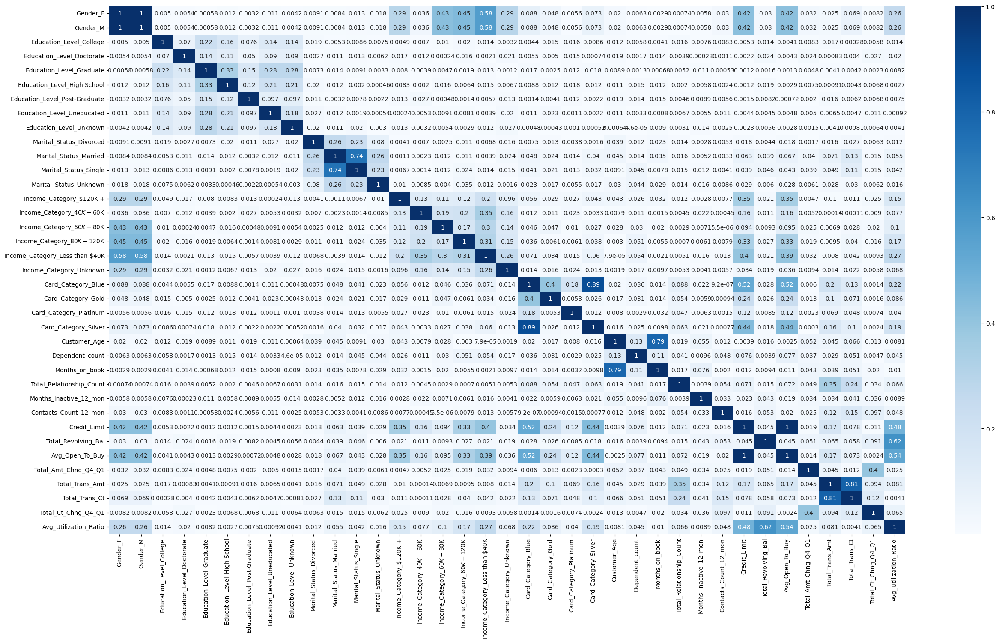

In [400]:
plt.figure(figsize=(30,16)).set_facecolor('white')
sns.heatmap(data=X_train_enc3.corr(method='pearson').abs(),
            annot = True,
            cmap='Blues')
plt.show()

Vamos a eliminar las columnas que tengan un valor de correlacion mayor a 0.8. Pero como podemos ver, el OHE no genero multicolinealidad. O en caso de hacerlo, seria mejor seleccionar que variable borrar y no solo descargar la primera con drop='first'

En funcion de esto, vamos a quitar las siguientes columnas


* Gender_F (creada por OHE) | corr = 1.0
* Card_Category_Silver (creada por OHE) | corr = 0.89 
* Avg_Open_To_Buy (detectada antes de OHE) | corr 1.0 con Credit_Limit
* Total_Trans_Ct (detectada antes de OHE) | corr 0.81 con Total_Trans_Amt




In [401]:
# Quitamos las var
X_train_enc3 = X_train_enc3.drop(columns=['Gender_F','Card_Category_Silver','Avg_Open_To_Buy','Total_Trans_Ct'])
X_test_enc3 = X_test_enc3.drop(columns=['Gender_F','Card_Category_Silver','Avg_Open_To_Buy','Total_Trans_Ct'])



---

FIN PIPE

---



Codificamos tambien nuestro conjunto "Y". Dandole valor de "1" a la categoria que nos interesa predecir, en este caso nos interesa detectar los Attrited Customer

In [402]:
y_train = y_train.replace({'Attrited Customer':1,'Existing Customer':0})
y_test = y_test.replace({'Attrited Customer':1,'Existing Customer':0})

In [403]:
y_train.value_counts()

0    6799
1    1302
Name: Attrition_Flag, dtype: int64

In [404]:
y_test.value_counts()

0    1701
1     325
Name: Attrition_Flag, dtype: int64

## MODELOS BASE

Vamos a usar 3 tipos de modelos de clasificacion y un dummyClassifier. Y van a ser evaluados a traves de varias metricas en conjunto. Se considero utilizar como metrica de decisión el ROC_AUC, pero igualmente se vera el resultado de el reporte de clasificacion y una matriz de confusion. 

In [405]:
set_train = [X_train_enc,X_train_enc1,X_train_enc2,X_train_enc3] 
set_test = [X_test_enc,X_test_enc1,X_test_enc2,X_test_enc3]
nombre_datos = ['OHE + OrdinalEncoder(MinMaxScaler) | enc',
                'Only OHE | enc1',
                'OHE + Ordinal + resto(MinMaxScaler) | enc2',
                'OHE(sin drop=first) | enc3']

### DummyClassifier

In [406]:
dumclas = DummyClassifier(strategy = 'most_frequent')
res_dumclas = pd.DataFrame(columns=['Datos usados','ROC_AUC'])

for i,j,k in zip(set_train,set_test,nombre_datos):
  dumclas.fit(i,y_train)
  y_pred_dum = dumclas.predict(j)
  res_dumclas.loc[len(res_dumclas)] = [k,roc_auc_score(y_test,y_pred_dum)]

res_dumclas.sort_values('ROC_AUC',ascending=False)

,Datos usados,ROC_AUC
0,OHE + OrdinalEncoder(MinMaxScaler) | enc,0.5
1,Only OHE | enc1,0.5
2,OHE + Ordinal + resto(MinMaxScaler) | enc2,0.5
3,OHE(sin drop=first) | enc3,0.5


> Mejor resultado DummyClassifier

In [407]:
dumclas.fit(X_train_enc,y_train)
y_pred_dum = dumclas.predict(X_test_enc)

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.84      1.00      0.91      1701
           1       0.00      0.00      0.00       325

    accuracy                           0.84      2026
   macro avg       0.42      0.50      0.46      2026
weighted avg       0.70      0.84      0.77      2026



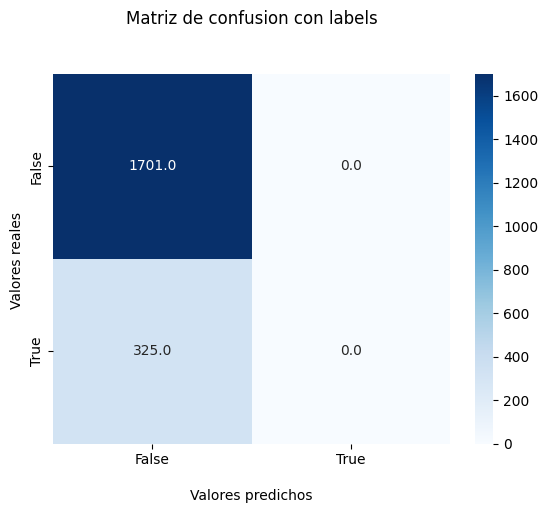

None
Metrica seleccionada para evaular ROC_AUC: 0.5


In [408]:
print(classification_report(y_test, y_pred_dum))
print(mat_conf(y_test,y_pred_dum))
print(f'Metrica seleccionada para evaular ROC_AUC: {roc_auc_score(y_test,y_pred_dum)}')

### LogisticRegression

In [409]:
log_reg = LogisticRegression(n_jobs=-1)
res_log_reg = pd.DataFrame(columns=['Datos usados','ROC_AUC'])

for i,j,k in zip(set_train,set_test,nombre_datos):
  log_reg.fit(i,y_train)
  y_pred_LR = log_reg.predict(j)
  res_log_reg.loc[len(res_log_reg)] = [k,roc_auc_score(y_test,y_pred_LR)]

res_log_reg.sort_values('ROC_AUC',ascending=False)

,Datos usados,ROC_AUC
2,OHE + Ordinal + resto(MinMaxScaler) | enc2,0.706047
0,OHE + OrdinalEncoder(MinMaxScaler) | enc,0.704333
1,Only OHE | enc1,0.681775
3,OHE(sin drop=first) | enc3,0.654190




> Mejor resultado LogisticRegression


In [410]:
log_reg.fit(X_train_enc2,y_train)
y_pred_LR = log_reg.predict(X_test_enc2)

              precision    recall  f1-score   support

           0       0.90      0.98      0.94      1701
           1       0.79      0.43      0.56       325

    accuracy                           0.89      2026
   macro avg       0.85      0.71      0.75      2026
weighted avg       0.88      0.89      0.88      2026



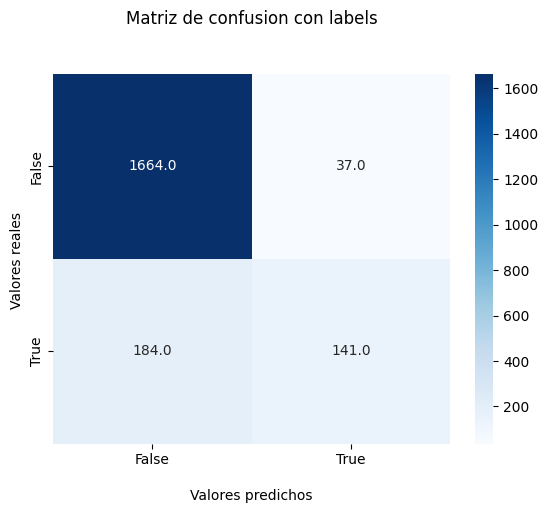

None
Metrica seleccionada para evaular ROC_AUC: 0.7060471216026771


In [411]:
print(classification_report(y_test, y_pred_LR))
print(mat_conf(y_test,y_pred_LR))
print(f'Metrica seleccionada para evaular ROC_AUC: {roc_auc_score(y_test,y_pred_LR)}')

### KNeighborsClassifier

In [412]:
knn = KNeighborsClassifier()
res_knn = pd.DataFrame(columns=['Datos usados','ROC_AUC'])

for i,j,k in zip(set_train,set_test,nombre_datos):
  knn.fit(i,y_train)
  y_pred_knn = knn.predict(j)
  res_knn.loc[len(res_knn)] = [k,roc_auc_score(y_test,y_pred_knn)]

res_knn.sort_values('ROC_AUC',ascending=False)

,Datos usados,ROC_AUC
3,OHE(sin drop=first) | enc3,0.768949
0,OHE + OrdinalEncoder(MinMaxScaler) | enc,0.768292
1,Only OHE | enc1,0.768292
2,OHE + Ordinal + resto(MinMaxScaler) | enc2,0.608173


> Mejor resultado KNN

In [413]:
knn.fit(X_train_enc3, y_train)
predicciones_knn = knn.predict(X_test_enc3)

              precision    recall  f1-score   support

           0       0.92      0.96      0.94      1701
           1       0.73      0.58      0.65       325

    accuracy                           0.90      2026
   macro avg       0.83      0.77      0.79      2026
weighted avg       0.89      0.90      0.89      2026



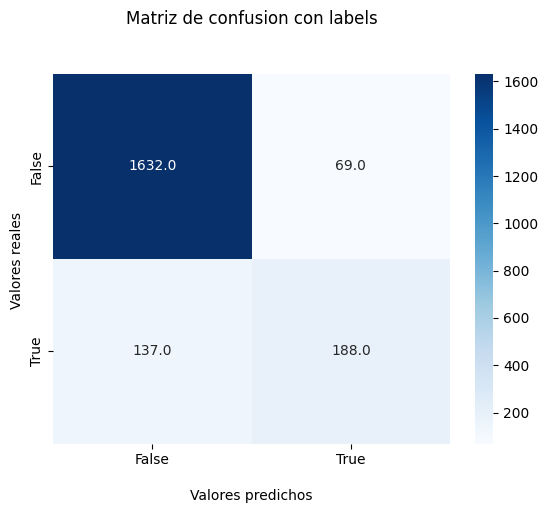

None
Metrica seleccionada para evaular ROC_AUC: 0.7689485822819155


In [414]:
print(classification_report(y_test, predicciones_knn))
print(mat_conf(y_test,predicciones_knn))
print(f'Metrica seleccionada para evaular ROC_AUC: {roc_auc_score(y_test,predicciones_knn)}')

### RandomForestClassifier

In [415]:
clf = RandomForestClassifier(random_state = 0)

res_clf = pd.DataFrame(columns=['Datos usados','ROC_AUC'])

for i,j,k in zip(set_train,set_test,nombre_datos):
  clf.fit(i,y_train)
  y_pred_clf = clf.predict(j)
  res_clf.loc[len(res_clf)] = [k,roc_auc_score(y_test,y_pred_clf)]

res_clf.sort_values('ROC_AUC',ascending=False)

,Datos usados,ROC_AUC
0,OHE + OrdinalEncoder(MinMaxScaler) | enc,0.902401
1,Only OHE | enc1,0.878374
2,OHE + Ordinal + resto(MinMaxScaler) | enc2,0.863871
3,OHE(sin drop=first) | enc3,0.828192


> Mejor resultado RandomForestClassifier

In [416]:
clf.fit(X_train_enc, y_train)
y_pred_RFC = clf.predict(X_test_enc)

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.94      0.82      0.87       325

    accuracy                           0.96      2026
   macro avg       0.95      0.90      0.92      2026
weighted avg       0.96      0.96      0.96      2026



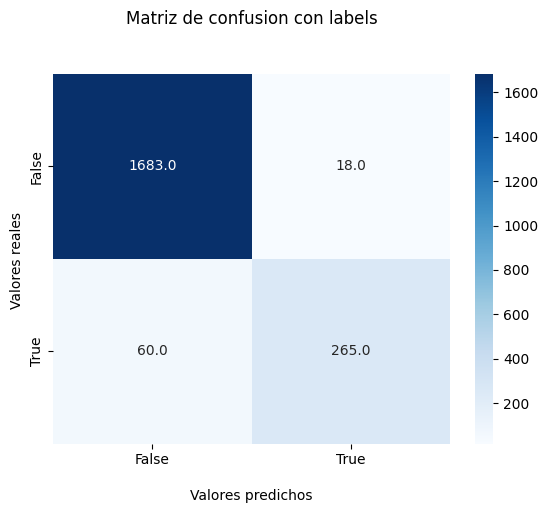

None
Metrica seleccionada para evaular ROC_AUC: 0.9024013024013023


In [417]:
print(classification_report(y_test, y_pred_RFC))
print(mat_conf(y_test,y_pred_RFC))
print(f'Metrica seleccionada para evaular ROC_AUC: {roc_auc_score(y_test,y_pred_RFC)}')

### Conclusiones modelos base

Se usaron tres tipos de modelos para clasificacion. De los cuales obtuvimos diferentes resultados solo cambiando el conjunto de train. Es decir que no se modifciaron los hiperparametros y sieempre se trabajo con el mismo modelo base

> El mejor resultado, en funcion de la metrica seleccionada para evaluarlos, fue el caso de un RandomForestClassifier usando el set de datos de train modificado con un OHE para algunas variables categoricas sumado a un Ordinal Encoder aplicado sobre aquellas variables a las que se les pudo dar una jerarquia. 


## Estandarizacion de datos


Para algunos modelos como Logistic Regression, puede ser util tener los datos estandarizados. Para ello, vamos a intentar hacer algunos test de hipotesis para definir si las variables tengan una distribucion normal, vamos a estandarizarlos mediante un StandarScaler y en caso de que no tengan una distribucion normal, los vamos a estandarizar mediante un RobusScaler

In [418]:
X_train_enc.head()

,Education_Level,Income_Category,Card_Category,Gender_M,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
6207,0.833333,0.2,0.0,0.0,1.0,0.0,0.0,37.0,3.0,27.0,4.0,2.0,0.0,1438.3,687.0,751.3,0.778,4621.0,73.0,1.147,0.478
9099,0.333333,0.4,0.0,1.0,0.0,1.0,0.0,43.0,3.0,35.0,5.0,3.0,2.0,6080.0,787.0,5293.0,0.975,4866.0,56.0,0.647,0.129
1957,0.000000,0.2,0.0,1.0,1.0,0.0,0.0,32.0,1.0,36.0,5.0,3.0,3.0,6100.0,1520.0,4580.0,0.853,1668.0,32.0,0.882,0.249
3383,0.000000,0.6,0.0,1.0,1.0,0.0,0.0,46.0,4.0,29.0,6.0,3.0,2.0,5735.0,2410.0,3325.0,0.616,3908.0,75.0,0.630,0.420
2206,0.666667,0.2,0.0,0.0,1.0,0.0,0.0,35.0,2.0,22.0,4.0,3.0,3.0,2544.0,1848.0,696.0,0.804,2289.0,49.0,0.441,0.726


In [419]:
col_a_estandarizar = set(X_train_enc.columns)-set(['Gender_M','Marital_Status_Married','Marital_Status_Single',])  # Quito las columnas que tendran el OHE

In [420]:
#seleccion de columnas normalizadas
normal_cols = []

#loop en todas las columnas del x_train
for col in col_a_estandarizar:

  #calculo de D'Agostino's K-squared test
  k2, p_value = stats.normaltest(X_train_enc[col])
  #chequeo de si p-value es mayor a 0.05 es distribucion normal
  if p_value > 0.05:
    normal_cols.append(col)
  
  #print de todas las variables con su valor
  print(f"columna {col} ---- Estadístico = {k2}, p-value = {p_value}")

#seleccion de las variables que no estan en normal,  nos daran el resto de columnas no seleccionadas
#conjunto  de todas las columnas menos conjunto de las columnas normalizadas = resto de columnas a estudiar
not_stander = list(set(X_train_enc.columns) - set(normal_cols))

columna Card_Category ---- Estadístico = 7474.790893016028, p-value = 0.0
columna Avg_Open_To_Buy ---- Estadístico = 2242.852904635994, p-value = 0.0
columna Total_Trans_Ct ---- Estadístico = 105.64917615018402, p-value = 1.144386932831578e-23
columna Income_Category ---- Estadístico = 1342.0380995995956, p-value = 3.8030270984392955e-292
columna Total_Relationship_Count ---- Estadístico = 2026.998644004482, p-value = 0.0
columna Total_Amt_Chng_Q4_Q1 ---- Estadístico = 3587.25473866226, p-value = 0.0
columna Avg_Utilization_Ratio ---- Estadístico = 1219.2779056241732, p-value = 1.7265010246566906e-265
columna Total_Ct_Chng_Q4_Q1 ---- Estadístico = 4088.851314672391, p-value = 0.0
columna Contacts_Count_12_mon ---- Estadístico = 0.8040002954715753, p-value = 0.6689806468579567
columna Customer_Age ---- Estadístico = 38.41160546539957, p-value = 4.560640637082243e-09
columna Total_Trans_Amt ---- Estadístico = 3198.434742503083, p-value = 0.0
columna Marital_Status_Unknown ---- Estadístic

In [421]:
normal_cols

['Contacts_Count_12_mon']

In [422]:
not_stander

['Card_Category',
 'Avg_Open_To_Buy',
 'Total_Trans_Ct',
 'Income_Category',
 'Total_Relationship_Count',
 'Total_Amt_Chng_Q4_Q1',
 'Avg_Utilization_Ratio',
 'Marital_Status_Single',
 'Total_Ct_Chng_Q4_Q1',
 'Customer_Age',
 'Total_Trans_Amt',
 'Marital_Status_Unknown',
 'Months_on_book',
 'Marital_Status_Married',
 'Gender_M',
 'Education_Level',
 'Months_Inactive_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Dependent_count']

In [423]:
X_train_t3 = X_train_enc.copy()
X_test_t3 = X_test_enc.copy()

In [424]:
#proceso de transformacion en X_train

#standarizacion es el z-score utilizado para variables ya con distribucion normal
sc = StandardScaler()
X_train_t3[normal_cols] = sc.fit_transform(X_train_t3[normal_cols])

#utilizacion para cambiar el valor con una distribucion mas desconocida
rs = RobustScaler()
X_train_t3[not_stander] = rs.fit_transform(X_train_t3[not_stander])



In [425]:
#proceso de transformacion en X_test

#standarizacion es el z-score utilizado para variables ya con distribucion normal
sc = StandardScaler()
X_test_t3[normal_cols] = sc.fit_transform(X_test_t3[normal_cols])

#utilizacion para cambiar el valor con una distribucion mas desconocida
rs = RobustScaler()
X_test_t3[not_stander] = rs.fit_transform(X_test_t3[not_stander])

In [426]:
X_train_t3

,Education_Level,Income_Category,Card_Category,Gender_M,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
6207,1.000000,-0.5,0.0,0.0,1.0,0.0,0.0,-0.818182,0.5,-1.125,0.0,0.0,-2.208556,-0.368504,-0.388446,-0.322648,0.181818,0.284559,0.166667,1.886076,0.631250
9099,0.000000,0.0,0.0,1.0,0.0,1.0,0.0,-0.272727,0.5,-0.125,0.5,1.0,-0.410414,0.179254,-0.322045,0.210854,1.034632,0.378899,-0.305556,-0.223629,-0.095833
1957,-0.666667,-0.5,0.0,1.0,1.0,0.0,0.0,-1.272727,-0.5,0.000,0.5,1.0,0.488657,0.181614,0.164675,0.127100,0.506494,-0.852522,-0.972222,0.767932,0.154167
3383,-0.666667,0.5,0.0,1.0,1.0,0.0,0.0,0.000000,1.0,-0.875,1.0,1.0,-0.410414,0.138541,0.755644,-0.020322,-0.519481,0.010012,0.222222,-0.295359,0.510417
2206,0.666667,-0.5,0.0,0.0,1.0,0.0,0.0,-1.000000,0.0,-1.750,0.0,1.0,0.488657,-0.238022,0.382470,-0.329144,0.294372,-0.613400,-0.500000,-1.092827,1.147917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6829,0.666667,-0.5,0.0,0.0,0.0,1.0,0.0,0.363636,-1.0,0.875,1.0,2.0,-0.410414,-0.223153,0.446215,-0.325620,-0.467532,0.234501,-0.055556,-0.139241,1.152083
268,0.666667,0.0,0.0,0.0,1.0,0.0,0.0,1.636364,-1.0,2.125,-1.5,1.0,0.488657,-0.142554,-0.844622,-0.017033,1.233766,-1.125144,-1.361111,-1.329114,-0.364583
5191,0.666667,-1.0,0.0,0.0,0.0,0.0,0.0,0.636364,0.5,0.000,0.0,1.0,3.185870,0.398631,-0.844622,0.521673,-0.800866,-0.621101,-0.694444,-1.637131,-0.364583
3380,0.000000,-0.5,0.0,0.0,1.0,0.0,0.0,-0.636364,-0.5,0.000,-0.5,1.0,-1.309485,-0.244395,0.005976,-0.268883,-0.800866,-0.762418,-0.916667,-0.341772,0.706250


In [427]:
X_train_t3.describe().T

,count,mean,std,min,25%,50%,75%,max
Education_Level,8101.0,1.552483e-01,0.573342,-0.666667,-0.333333,0.000000,0.666667,1.333333
Income_Category,8101.0,3.715591e-02,0.733991,-1.000000,-0.500000,0.000000,0.500000,1.500000
Card_Category,8101.0,2.859729e-02,0.113395,0.000000,0.000000,0.000000,0.000000,1.000000
Gender_M,8101.0,4.688310e-01,0.499058,0.000000,0.000000,0.000000,1.000000,1.000000
Marital_Status_Married,8101.0,4.592026e-01,0.498364,0.000000,0.000000,0.000000,1.000000,1.000000
Marital_Status_Single,8101.0,3.926676e-01,0.488374,0.000000,0.000000,0.000000,1.000000,1.000000
Marital_Status_Unknown,8101.0,7.529935e-02,0.263890,0.000000,0.000000,0.000000,0.000000,1.000000
Customer_Age,8101.0,3.679680e-02,0.732343,-1.818182,-0.454545,0.000000,0.545455,2.454545
Dependent_count,8101.0,1.715220e-01,0.651439,-1.000000,-0.500000,0.000000,0.500000,1.500000
Months_on_book,8101.0,5.709172e-04,1.001273,-2.875000,-0.500000,0.000000,0.500000,2.500000


### LogisticRegression c/datos estandarizados

In [428]:
log_reg_std = LogisticRegression(n_jobs=-1)
log_reg_std.fit(X_train_t3,y_train)
y_pred_LRstd = log_reg_std.predict(X_test_t3)

In [429]:
print('Resultados LogisticRegression c/variables estandarizadas')
print(classification_report(y_test, y_pred_LRstd))
print(f'roc_auc: {roc_auc_score(y_test,y_pred_LRstd)}')
print('Resultados LogisticRegression c/variables sin estandarizar')
print(classification_report(y_test, y_pred_LR))
print(f'roc_auc: {roc_auc_score(y_test,y_pred_LR)}')

Resultados LogisticRegression c/variables estandarizadas
              precision    recall  f1-score   support

           0       0.92      0.96      0.94      1701
           1       0.73      0.58      0.65       325

    accuracy                           0.90      2026
   macro avg       0.83      0.77      0.79      2026
weighted avg       0.89      0.90      0.89      2026

roc_auc: 0.7692425270203048
Resultados LogisticRegression c/variables sin estandarizar
              precision    recall  f1-score   support

           0       0.90      0.98      0.94      1701
           1       0.79      0.43      0.56       325

    accuracy                           0.89      2026
   macro avg       0.85      0.71      0.75      2026
weighted avg       0.88      0.89      0.88      2026

roc_auc: 0.7060471216026771


Como vemos la estandarizacion de las variables mejoro el resultado de la metrica de comparacion en mas de un 6%.

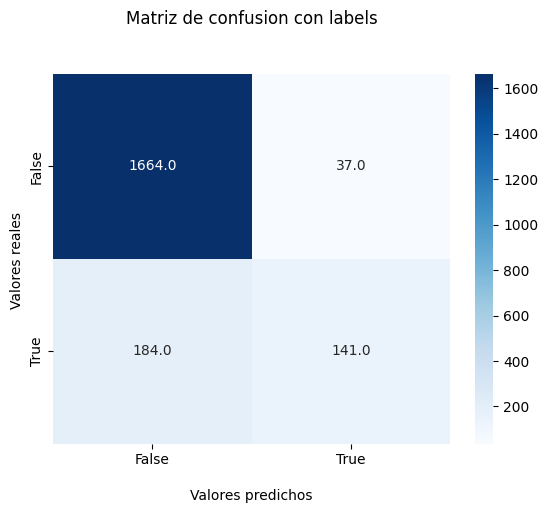

In [430]:
mat_conf(y_test,y_pred_LR)

### KNeighborsClassifier c/datos estandarizados

In [431]:
knn_std = KNeighborsClassifier() # Instanciamos el clasificador k veces es decir k vecinos cercanos
knn_std.fit(X_train_t3, y_train)
predicciones_knn_std = knn_std.predict(X_test_t3)

In [432]:
print('Resultados KNeighborsClassifier c/variables estandarizadas')
print(classification_report(y_test, predicciones_knn_std,zero_division=0))
print(f'roc_auc: {roc_auc_score(y_test,predicciones_knn_std)}')
print('Resultados KNeighborsClassifier c/variables sin estandarizar')
print(classification_report(y_test, predicciones_knn,zero_division=0))
print(f'roc_auc: {roc_auc_score(y_test,predicciones_knn)}')

Resultados KNeighborsClassifier c/variables estandarizadas
              precision    recall  f1-score   support

           0       0.93      0.98      0.95      1701
           1       0.85      0.60      0.70       325

    accuracy                           0.92      2026
   macro avg       0.89      0.79      0.83      2026
weighted avg       0.92      0.92      0.91      2026

roc_auc: 0.7900058788947678
Resultados KNeighborsClassifier c/variables sin estandarizar
              precision    recall  f1-score   support

           0       0.92      0.96      0.94      1701
           1       0.73      0.58      0.65       325

    accuracy                           0.90      2026
   macro avg       0.83      0.77      0.79      2026
weighted avg       0.89      0.90      0.89      2026

roc_auc: 0.7689485822819155


El resultado mejora un poco mas de un 2% en la metrica de evaluacion.


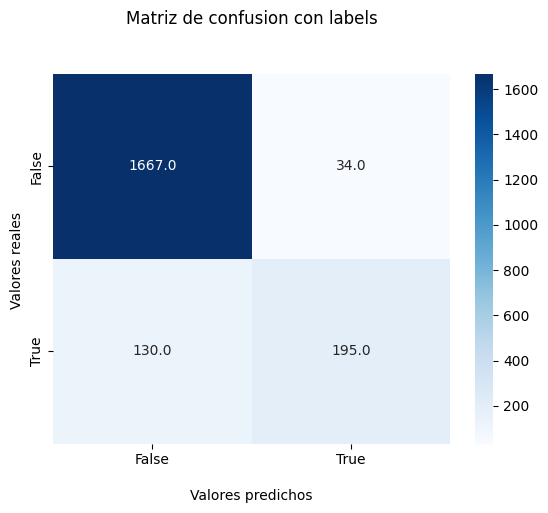

In [433]:
mat_conf(y_test,predicciones_knn_std)

### RandomForestClassifier c/datos estandarizados

In [434]:
clf_std = RandomForestClassifier(random_state = 0)
clf_std.fit(X_train_t3, y_train)
y_pred_RFCstd = clf_std.predict(X_test_t3)

In [435]:
print('Resultados KNeighborsClassifier c/variables estandarizadas')
print(classification_report(y_test, y_pred_RFCstd,zero_division=0))
print(f'roc_auc: {roc_auc_score(y_test,y_pred_RFCstd)}')
print('Resultados KNeighborsClassifier c/variables sin estandarizar')
print(classification_report(y_test, y_pred_RFC,zero_division=0))
print(f'roc_auc: {roc_auc_score(y_test,y_pred_RFC)}')

Resultados KNeighborsClassifier c/variables estandarizadas
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1701
           1       0.89      0.83      0.86       325

    accuracy                           0.96      2026
   macro avg       0.93      0.91      0.92      2026
weighted avg       0.96      0.96      0.96      2026

roc_auc: 0.9072229005562339
Resultados KNeighborsClassifier c/variables sin estandarizar
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.94      0.82      0.87       325

    accuracy                           0.96      2026
   macro avg       0.95      0.90      0.92      2026
weighted avg       0.96      0.96      0.96      2026

roc_auc: 0.9024013024013023


El resultado de la metrica de evaluacion mejora aproximadamente un 1%. Siendo el modelo menos favorecido por esta estandarizacion pero el que logra un mejor resultado. 

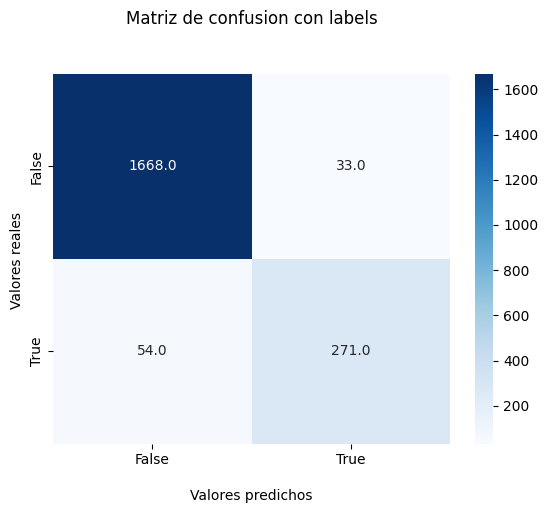

In [436]:
mat_conf(y_test,y_pred_RFCstd)

## PCA

In [437]:
#Importamos la libreria
from sklearn.decomposition import PCA

#Generamos el objeto
model_pca = PCA(n_components = 10)

#Aplicamos pca
X_pca_test=model_pca.fit_transform(X_test_enc)
X_pca_train=model_pca.fit_transform(X_train_enc)

In [438]:
#Variaanza explicada de las componentes
var_explicada_pca = model_pca.explained_variance_ratio_
var_explicada_pca

array([9.31713696e-01, 6.27122718e-02, 5.57220953e-03, 1.06602289e-06,
       6.41085797e-07, 7.58713979e-08, 1.19276294e-08, 9.23104206e-09,
       6.71308968e-09, 5.68145741e-09])

### LogisticRegression

Como al cambiar la cantidad de variables que queremos en el PCA nos da diferentes resultados, vamos a hacer un bucle que pruebe con muchos valores y nos arroje los resultados de c/u

In [439]:
resultados = pd.DataFrame(columns=['cant-variables','accuracy_score','precision_score','recall_score','f1_score','roc_auc_score'])

In [440]:
log_reg_pca = LogisticRegression(n_jobs=-1)
for i in range(1,15):
  pca = PCA(n_components = i)
  pca.fit(X_train_enc)
  xTest = pca.fit_transform(X_test_enc)
  xTrain = pca.fit_transform(X_train_enc)
  log_reg_pca.fit(xTrain,y_train)
  y_pred_LRpca = log_reg_pca.predict(xTest)
  fila =  pd.DataFrame({'cant-variables':i,
                        'accuracy_score':[accuracy_score(y_test,y_pred_LRpca)],
                        'precision_score':[precision_score(y_test, y_pred_LRpca)],
                        'recall_score':[recall_score(y_test, y_pred_LRpca)],
                        'f1_score':[ f1_score(y_test, y_pred_LRpca)],
                        'roc_auc_score':[ roc_auc_score(y_test,y_pred_LRpca)]})
  resultados = pd.concat([resultados,fila])

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [441]:
resultados = resultados.set_index('cant-variables')

In [442]:
resultados.sort_values(by='roc_auc_score',ascending=False).head()

,accuracy_score,precision_score,recall_score,f1_score,roc_auc_score
cant-variables,,,,,
3,0.840573,1.000000,0.006154,0.012232,0.503077
1,0.839585,0.000000,0.000000,0.000000,0.500000
2,0.839585,0.000000,0.000000,0.000000,0.500000
12,0.757157,0.132159,0.092308,0.108696,0.488247
7,0.756170,0.110599,0.073846,0.088561,0.480192


En funcion de esto, vamos a definir que el resultado para un mejor PCA lo ofrece un n_components = 10

In [443]:
log_reg_pca = LogisticRegression(n_jobs=-1)
pca = PCA(n_components = 10)
pca.fit(X_train_enc)
xTest = pca.transform(X_test_enc)
xTrain = pca.transform(X_train_enc)
log_reg_pca.fit(xTrain,y_train)
y_pred_LRpca = log_reg_pca.predict(xTest)

In [444]:
print('Resultados LogisticRegression c/PCA + mod')
print(classification_report(y_test, y_pred_LRpca))
print(f'roc_auc : {roc_auc_score(y_test, y_pred_LRpca)}')
print('- '*27)
print('Resultados LogisticRegression sin modificar')
print(classification_report(y_test, y_pred_LR))
print(f'roc_auc : {roc_auc_score(y_test, y_pred_LR)}')

Resultados LogisticRegression c/PCA + mod
              precision    recall  f1-score   support

           0       0.91      0.95      0.93      1701
           1       0.68      0.54      0.60       325

    accuracy                           0.88      2026
   macro avg       0.80      0.74      0.77      2026
weighted avg       0.88      0.88      0.88      2026

roc_auc : 0.7432948944060055
- - - - - - - - - - - - - - - - - - - - - - - - - - - 
Resultados LogisticRegression sin modificar
              precision    recall  f1-score   support

           0       0.90      0.98      0.94      1701
           1       0.79      0.43      0.56       325

    accuracy                           0.89      2026
   macro avg       0.85      0.71      0.75      2026
weighted avg       0.88      0.89      0.88      2026

roc_auc : 0.7060471216026771


El resultado mejora un 1% con respecto al modelo base sin modificar. 

### KNeighborsClassifier

Aca se hizo un bucle parecido al anterior, pero le agregamos la variacion en el hiperparametro n_neighbors

In [445]:
resultados_KNC = pd.DataFrame(columns=['cant-variables','VecinosCercanos','accuracy_score','precision_score','recall_score','f1_score','roc_auc_score'])

In [446]:
for i in range(1,15):
  pca = PCA(n_components = i)
  xTest = pca.fit_transform(X_test_enc)
  xTrain = pca.fit_transform(X_train_enc)
  for k in range(1,15):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(xTrain,y_train)
    y_pred_knn = knn.predict(xTest)
    fila =  pd.DataFrame({'cant-variables':i,
                          'VecinosCercanos':k,
                          'accuracy_score':[accuracy_score(y_test,y_pred_knn)],
                          'precision_score':[precision_score(y_test, y_pred_knn)],
                          'recall_score':[recall_score(y_test, y_pred_knn)],
                          'f1_score':[ f1_score(y_test, y_pred_knn)],
                          'roc_auc_score':[ roc_auc_score(y_test,y_pred_knn)]})
    resultados_KNC = pd.concat([resultados_KNC,fila],ignore_index=True)

In [447]:
resultados_KNC.sort_values(by='roc_auc_score',ascending=False).head(20)

,cant-variables,VecinosCercanos,accuracy_score,precision_score,recall_score,f1_score,roc_auc_score
78,6,9,0.902764,0.775862,0.553846,0.646320,0.761638
106,8,9,0.902764,0.775862,0.553846,0.646320,0.761638
148,11,9,0.902764,0.775862,0.553846,0.646320,0.761638
64,5,9,0.902764,0.775862,0.553846,0.646320,0.761638
92,7,9,0.902764,0.775862,0.553846,0.646320,0.761638
50,4,9,0.902764,0.775862,0.553846,0.646320,0.761638
134,10,9,0.902764,0.775862,0.553846,0.646320,0.761638
176,13,9,0.902764,0.775862,0.553846,0.646320,0.761638
190,14,9,0.902764,0.775862,0.553846,0.646320,0.761638
162,12,9,0.902764,0.775862,0.553846,0.646320,0.761638


En funcion de esto podemos determinar que la mejor opcion podrian ser varias en funcion del ROC_AUC. Para el parametro de n_neighbors, vamos a tener que usar 9. Pero para el PCA podemos usar diferente cantidad de variables y todas ofrecen un resultado parecido.

In [448]:
knn_mod = KNeighborsClassifier(n_neighbors=9)
pca = PCA(n_components = 6)
xTest = pca.fit_transform(X_test_enc)
xTrain = pca.fit_transform(X_train_enc)
knn_mod.fit(xTrain, y_train)
predicciones_knn_mod = knn_mod.predict(xTest)

In [449]:
print('Resultados KNeighborsClassifier c/PCA + mod')
print(classification_report(y_test, predicciones_knn_mod,zero_division=0))
print(f'roc_auc : {roc_auc_score(y_test, predicciones_knn_mod)}')
print('- '*27)
print('Resultados KNeighborsClassifier sin modificaciones')
print(classification_report(y_test, predicciones_knn,zero_division=0))
print(f'roc_auc : {roc_auc_score(y_test, predicciones_knn)}')

Resultados KNeighborsClassifier c/PCA + mod
              precision    recall  f1-score   support

           0       0.92      0.97      0.94      1701
           1       0.78      0.55      0.65       325

    accuracy                           0.90      2026
   macro avg       0.85      0.76      0.79      2026
weighted avg       0.90      0.90      0.90      2026

roc_auc : 0.7616379505268395
- - - - - - - - - - - - - - - - - - - - - - - - - - - 
Resultados KNeighborsClassifier sin modificaciones
              precision    recall  f1-score   support

           0       0.92      0.96      0.94      1701
           1       0.73      0.58      0.65       325

    accuracy                           0.90      2026
   macro avg       0.83      0.77      0.79      2026
weighted avg       0.89      0.90      0.89      2026

roc_auc : 0.7689485822819155


El resultado no mejora. Pero puede ser util reducir la dimensionalidad

### RandomForestClassifier

In [450]:
resultados_rfc = pd.DataFrame(columns=['cant-variables','accuracy_score','precision_score','recall_score','f1_score','roc_auc_score'])

In [451]:
RFC_pca = RandomForestClassifier(random_state = 0)
for i in range(1,15):
  pca = PCA(n_components = i)
  pca.fit(X_train_enc)
  xTest = pca.fit_transform(X_test_enc)
  xTrain = pca.fit_transform(X_train_enc)
  RFC_pca.fit(xTrain,y_train)
  y_pred_RFCpca = RFC_pca.predict(xTest)
  fila =  pd.DataFrame({'cant-variables':i,
                        'accuracy_score':[accuracy_score(y_test,y_pred_RFCpca)],
                        'precision_score':[precision_score(y_test, y_pred_RFCpca)],
                        'recall_score':[recall_score(y_test, y_pred_RFCpca)],
                        'f1_score':[ f1_score(y_test, y_pred_RFCpca)],
                        'roc_auc_score':[ roc_auc_score(y_test,y_pred_RFCpca)]})
  resultados_rfc = pd.concat([resultados_rfc,fila])

In [452]:
resultados_rfc = resultados_rfc.set_index('cant-variables')

In [453]:
resultados_rfc.sort_values(by='roc_auc_score',ascending=False).head()

,accuracy_score,precision_score,recall_score,f1_score,roc_auc_score
cant-variables,,,,,
3,0.881540,0.715736,0.433846,0.540230,0.700462
2,0.863277,0.597561,0.452308,0.514886,0.697053
1,0.741856,0.176471,0.166154,0.171157,0.509003
12,0.754195,0.138075,0.101538,0.117021,0.490217
13,0.763080,0.125604,0.080000,0.097744,0.486796


El mejor resultados es usando el PCA con un n_components = 3.

In [454]:
RFC_pca = RandomForestClassifier()
pca = PCA(n_components = 3)
pca.fit(X_train_enc)
xTest = pca.transform(X_test_enc)
xTrain = pca.transform(X_train_enc)
RFC_pca.fit(xTrain,y_train)
y_pred_RFCpca = RFC_pca.predict(xTest)

In [455]:
print('Resultados RandomForestClassifier c/PCA')
print(classification_report(y_test, y_pred_RFCpca))
print(f'roc_auc : {roc_auc_score(y_test, y_pred_RFCpca)}')
print('- '*27)
print('Resultados RandomForestClassifier sin modificar')
print(classification_report(y_test, y_pred_RFC))
print(f'roc_auc : {roc_auc_score(y_test, y_pred_RFC)}')

Resultados RandomForestClassifier c/PCA
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      1701
           1       0.77      0.62      0.69       325

    accuracy                           0.91      2026
   macro avg       0.85      0.79      0.82      2026
weighted avg       0.90      0.91      0.91      2026

roc_auc : 0.7918880296658074
- - - - - - - - - - - - - - - - - - - - - - - - - - - 
Resultados RandomForestClassifier sin modificar
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.94      0.82      0.87       325

    accuracy                           0.96      2026
   macro avg       0.95      0.90      0.92      2026
weighted avg       0.96      0.96      0.96      2026

roc_auc : 0.9024013024013023


No mejora el resultado

## Analisis de outliers

In [456]:
from sklearn.ensemble import IsolationForest

In [457]:
# identificar outliers en el dataset de train
iso = IsolationForest(contamination=0.1, random_state=42) # contamination = proporcion de outliers esperada
yhat = iso.fit_predict(X_train_enc)

# seleccionar todas las filas que no son outliers
mask = yhat != -1 # filtro


/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


In [458]:
X_prueba , y_prueba = X_train_enc[mask],y_train[mask]

In [459]:
X_prueba.shape

(7291, 21)

In [460]:
knn_out = KNeighborsClassifier(n_neighbors=9)
knn_out.fit(X_prueba,y_prueba)
knn_out_pred = knn_out.predict(X_test_enc)
print(f'ROC_AUC para modelo con tratamiento de outliers: {roc_auc_score(y_test,knn_out_pred)}')

ROC_AUC para modelo con tratamiento de outliers: 0.7386985031429476


En el modelo original, el roc_auc fue 0.75, por lo tanto el modelo no mejoro. Solo empeoro. Quiza deberia hacerse un tratamiento puntual de outliers solo en algunas variables. Pero esto deberia ser investigado mas a fondo.

## Feature Selection con VarianceThreshold


Voy a probar utilizar diferentes metodos de seleeccion de caracteristicas para ver si podemos mantener la precision del modelo eliminando variables que no aporten nada al entrenamiento. 


In [461]:
from sklearn.feature_selection import VarianceThreshold

In [462]:
# Selección de características utilizando VarianceThreshold seleccionando un umbral de 0.9
vt = VarianceThreshold(threshold=0.9)
X_tr_vt = vt.fit_transform(X_train_enc)
X_ts_vt = vt.transform(X_test_enc)

In [463]:
X_train_enc.shape

(8101, 21)

In [464]:
pd.DataFrame(X_tr_vt).shape

(8101, 11)

### LogisticRegression c/FeatureSelection por VarianceThreshold

In [465]:
log_reg_vt = LogisticRegression(n_jobs=-1)
log_reg_vt.fit(X_tr_vt,y_train)
y_pred_LRvt = log_reg_vt.predict(X_ts_vt)

In [466]:
print('Resultados LogisticRegression c/variables reducidas')
print(classification_report(y_test, y_pred_LRvt))
print(f'roc_auc : {roc_auc_score(y_test,y_pred_LRvt)}')
print('- '*27)
print('Resultados LogisticRegression modelo base')
print(classification_report(y_test, y_pred_LR))
print(f'roc_auc : {roc_auc_score(y_test,y_pred_LR)}')

Resultados LogisticRegression c/variables reducidas
              precision    recall  f1-score   support

           0       0.89      0.97      0.93      1701
           1       0.68      0.38      0.49       325

    accuracy                           0.87      2026
   macro avg       0.79      0.67      0.71      2026
weighted avg       0.86      0.87      0.86      2026

roc_auc : 0.6724759191425858
- - - - - - - - - - - - - - - - - - - - - - - - - - - 
Resultados LogisticRegression modelo base
              precision    recall  f1-score   support

           0       0.90      0.98      0.94      1701
           1       0.79      0.43      0.56       325

    accuracy                           0.89      2026
   macro avg       0.85      0.71      0.75      2026
weighted avg       0.88      0.89      0.88      2026

roc_auc : 0.7060471216026771


Podemos ver que utilizando un umbral de 0.9 las metricas no mejoran, pero reducimos la dimencionalidad de 21 a 11.

### KNeighborsClassifier c/FeatureSelection por VarianceThreshold

In [467]:
knn_vt = KNeighborsClassifier()
knn_vt.fit(X_tr_vt, y_train)
predicciones_knn_vt = knn_vt.predict(X_ts_vt)

In [468]:
print('Resultados KNeighborsClassifier c/variables reducidas')
print(classification_report(y_test, predicciones_knn_vt,zero_division=0))
print(f'roc_auc : {roc_auc_score(y_test,predicciones_knn_vt)}')
print('- '*27)
print('Resultados KNeighborsClassifier modelo base')
print(classification_report(y_test, predicciones_knn,zero_division=0))
print(f'roc_auc : {roc_auc_score(y_test,predicciones_knn)}')

Resultados KNeighborsClassifier c/variables reducidas
              precision    recall  f1-score   support

           0       0.92      0.96      0.94      1701
           1       0.74      0.58      0.65       325

    accuracy                           0.90      2026
   macro avg       0.83      0.77      0.79      2026
weighted avg       0.89      0.90      0.89      2026

roc_auc : 0.7682919549586216
- - - - - - - - - - - - - - - - - - - - - - - - - - - 
Resultados KNeighborsClassifier modelo base
              precision    recall  f1-score   support

           0       0.92      0.96      0.94      1701
           1       0.73      0.58      0.65       325

    accuracy                           0.90      2026
   macro avg       0.83      0.77      0.79      2026
weighted avg       0.89      0.90      0.89      2026

roc_auc : 0.7689485822819155


La reduccion de dimensiones no mejora el resultado del modelo en el caso de un KNeighoborsClassifier pero quitamos 10 variables

### RandomForestClassifier c/FeatureSelection por VarianceThreshold

In [469]:
clf_vt = RandomForestClassifier(random_state = 0)
clf_vt.fit(X_tr_vt, y_train)
y_pred_RFCvt = clf_vt.predict(X_ts_vt)

In [470]:
print('Resultados RandomForestClassifier c/variables reducidas')
print(classification_report(y_test, y_pred_RFCvt,zero_division=0))
print(f'roc_auc : {roc_auc_score(y_test,y_pred_RFCvt)}')
print('- '*27)
print('Resultados RandomForestClassifier modelo base')
print(classification_report(y_test, y_pred_RFC,zero_division=0))
print(f'roc_auc : {roc_auc_score(y_test,y_pred_RFC)}')

Resultados RandomForestClassifier c/variables reducidas
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1701
           1       0.90      0.80      0.85       325

    accuracy                           0.95      2026
   macro avg       0.93      0.89      0.91      2026
weighted avg       0.95      0.95      0.95      2026

roc_auc : 0.8902310857866412
- - - - - - - - - - - - - - - - - - - - - - - - - - - 
Resultados RandomForestClassifier modelo base
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.94      0.82      0.87       325

    accuracy                           0.96      2026
   macro avg       0.95      0.90      0.92      2026
weighted avg       0.96      0.96      0.96      2026

roc_auc : 0.9024013024013023


Vemos que todas las meetricas disminuyeen sus valores muy poco, pero reduce la dimensionalidad.

## Feature Selection con SelectKBest

In [471]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

In [472]:
selector = SelectKBest(score_func=f_classif, k=7)  # Vamos a selecionar los 7 mejores
X_tr_sKB = selector.fit_transform(X_train_enc, y_train)
X_ts_sKB = selector.transform(X_test_enc)

In [473]:
X_train_enc.shape

(8101, 21)

In [474]:
pd.DataFrame(X_tr_sKB).shape

(8101, 7)

Podemos ver que selecciono las mejores 7 variables

### LogisticRegression c/FeatureSelection por SelectKBest

In [475]:
log_reg_sKB = LogisticRegression(n_jobs=-1)
log_reg_sKB.fit(X_tr_sKB,y_train)
y_pred_LRsKB = log_reg_sKB.predict(X_ts_sKB)

In [476]:
print('Resultados LogisticRegression c/variables reducidas')
print(classification_report(y_test, y_pred_LRsKB))
print(f'roc_auc : {roc_auc_score(y_test,y_pred_LRsKB)}')
print('- '*27)
print('Resultados LogisticRegression modelo base')
print(classification_report(y_test, y_pred_LR))
print(f'roc_auc : {roc_auc_score(y_test,y_pred_LR)}')

Resultados LogisticRegression c/variables reducidas
              precision    recall  f1-score   support

           0       0.90      0.97      0.93      1701
           1       0.70      0.42      0.53       325

    accuracy                           0.88      2026
   macro avg       0.80      0.70      0.73      2026
weighted avg       0.87      0.88      0.87      2026

roc_auc : 0.6952588974811197
- - - - - - - - - - - - - - - - - - - - - - - - - - - 
Resultados LogisticRegression modelo base
              precision    recall  f1-score   support

           0       0.90      0.98      0.94      1701
           1       0.79      0.43      0.56       325

    accuracy                           0.89      2026
   macro avg       0.85      0.71      0.75      2026
weighted avg       0.88      0.89      0.88      2026

roc_auc : 0.7060471216026771


Podemos ver que reduciendo la dimensionalidad en un 66% (ya que quitamos 2/3 de las variables) el rendimiento del modelo en funcion de la roc_auc practicamente no disminuye (menos de un 1%)

### KNeighborsClassifier c/FeatureSelection por SelectKBest

In [477]:
knn_sKB = KNeighborsClassifier() # Instanciamos el clasificador k veces es decir k vecinos cercanos
knn_sKB.fit(X_tr_sKB, y_train)
predicciones_knn_sKB = knn_sKB.predict(X_ts_sKB)

In [478]:
print('Resultados KNeighborsClassifier c/variables reducidas')
print(classification_report(y_test, predicciones_knn_sKB,zero_division=0))
print(f'roc_auc : {roc_auc_score(y_test,predicciones_knn_sKB)}')
print('- '*27)
print('Resultados KNeighborsClassifier modelo base')
print(classification_report(y_test, predicciones_knn,zero_division=0))
print(f'roc_auc : {roc_auc_score(y_test,predicciones_knn)}')

Resultados KNeighborsClassifier c/variables reducidas
              precision    recall  f1-score   support

           0       0.93      0.96      0.95      1701
           1       0.77      0.64      0.70       325

    accuracy                           0.91      2026
   macro avg       0.85      0.80      0.82      2026
weighted avg       0.91      0.91      0.91      2026

roc_auc : 0.8033138877583322
- - - - - - - - - - - - - - - - - - - - - - - - - - - 
Resultados KNeighborsClassifier modelo base
              precision    recall  f1-score   support

           0       0.92      0.96      0.94      1701
           1       0.73      0.58      0.65       325

    accuracy                           0.90      2026
   macro avg       0.83      0.77      0.79      2026
weighted avg       0.89      0.90      0.89      2026

roc_auc : 0.7689485822819155


La reduccion de dimensiones mediante SelectKBest MEJORA el resultado del modelo en el caso de un KNeighoborsClassifier. 
Ademas de reducir en un 66% la cantidad de variables, aumentan las metricas de evaluacion del modelo.

### RandomForestClassifier c/FeatureSelection por SelectKBest

In [479]:
clf_sKB = RandomForestClassifier(random_state = 0)
clf_sKB.fit(X_tr_sKB, y_train)
y_pred_RFCsKB = clf_sKB.predict(X_ts_sKB)

In [480]:
print('Resultados RandomForestClassifier c/variables reducidas')
print(classification_report(y_test, y_pred_RFCsKB,zero_division=0))
print(f'roc_auc : {roc_auc_score(y_test,y_pred_RFCsKB)}')
print('- '*27)
print('Resultados RandomForestClassifier modelo base')
print(classification_report(y_test, y_pred_RFC,zero_division=0))
print(f'roc_auc : {roc_auc_score(y_test,y_pred_RFC)}')

Resultados RandomForestClassifier c/variables reducidas
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1701
           1       0.89      0.78      0.83       325

    accuracy                           0.95      2026
   macro avg       0.92      0.88      0.90      2026
weighted avg       0.95      0.95      0.95      2026

roc_auc : 0.8829014606792385
- - - - - - - - - - - - - - - - - - - - - - - - - - - 
Resultados RandomForestClassifier modelo base
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.94      0.82      0.87       325

    accuracy                           0.96      2026
   macro avg       0.95      0.90      0.92      2026
weighted avg       0.96      0.96      0.96      2026

roc_auc : 0.9024013024013023


Vemos que las metricas disminuyen, pero el modelo sigue conservando su buen desempeño considerando que quitamos el 66% de los datos. la metrica de evaluacion aumenta un poco

> NOTA: Podemos ver que el modelo de KNC mejoro notablemente el rendimiento en cuanto al auc_roc, llegando a un 0.8.

## Cross Validation


Para hacer cross validation vamos a usar los modelos bases que podemos encontrar en la seccion MODELOS BASE

In [481]:
cv_log_reg = cross_val_score(log_reg,X_train_enc,y_train,cv=10)

In [482]:
cv_log_reg

array([0.86559803, 0.88024691, 0.87037037, 0.89012346, 0.86790123,
       0.88641975, 0.8691358 , 0.86419753, 0.86790123, 0.88765432])

En lugar de usar ese metodo, busque uno que habiamos usado con el primer profesor, que nos enseño a hacer el stratiedKFold, y como ir uniendo todo con el cross_validate.

A continuacion esta el resultado.

In [483]:
skf = StratifiedKFold(n_splits=10,
                      shuffle=True, 
                      random_state=4)

In [484]:
skf2 = StratifiedKFold(n_splits=10)

### Cross Validation con LogisticRegression

In [485]:
skf_log_reg = cross_validate(log_reg,
                             X_train_enc,
                             y_train,
                             scoring = ['accuracy','roc_auc','precision','recall','f1'],
                             return_train_score=True,
                             cv = skf)

In [486]:
# funcion propioa para obtener el train_score en un dataframe. Muestra mucha
# informacion de cada uno de los Fold pero se puede filtrar solo para ver
# los de train o los de test
resultados_train_scores_cv(skf_log_reg)

                     0      1      2      3      4      5      6      7  \
fit_time         1.099  1.119  1.116  1.121  1.122  1.112  1.111  1.121   
score_time       0.015  0.015  0.016  0.017  0.016  0.017  0.015  0.034   
test_accuracy    0.893  0.889  0.853  0.900  0.883  0.881  0.867  0.863   
train_accuracy   0.874  0.890  0.876  0.890  0.874  0.881  0.874  0.875   
test_roc_auc     0.899  0.901  0.856  0.906  0.894  0.888  0.860  0.884   
train_roc_auc    0.885  0.903  0.884  0.905  0.883  0.899  0.885  0.883   
test_precision   0.729  0.738  0.566  0.782  0.733  0.698  0.612  0.651   
train_precision  0.678  0.742  0.683  0.742  0.678  0.676  0.682  0.685   
test_recall      0.534  0.477  0.362  0.523  0.423  0.462  0.462  0.315   
train_recall     0.412  0.480  0.422  0.480  0.413  0.492  0.408  0.414   
test_f1          0.617  0.579  0.441  0.627  0.537  0.556  0.526  0.425   
train_f1         0.513  0.583  0.522  0.583  0.513  0.570  0.510  0.516   

                     8  

In [487]:
resultados_train_scores_cv(skf_log_reg,'test')

,0,1,2,3,4,5,6,7,8,9,mean,max,min,std
test_accuracy,0.893,0.889,0.853,0.900,0.883,0.881,0.867,0.863,0.883,0.906,0.882,0.906,0.853,0.017
test_roc_auc,0.899,0.901,0.856,0.906,0.894,0.888,0.860,0.884,0.896,0.920,0.891,0.920,0.856,0.021
test_precision,0.729,0.738,0.566,0.782,0.733,0.698,0.612,0.651,0.727,0.824,0.706,0.824,0.566,0.082
test_recall,0.534,0.477,0.362,0.523,0.423,0.462,0.462,0.315,0.431,0.534,0.452,0.534,0.315,0.075
test_f1,0.617,0.579,0.441,0.627,0.537,0.556,0.526,0.425,0.541,0.648,0.550,0.648,0.425,0.076


In [488]:
print(classification_report(y_test, y_pred_LR))
print(f'roc_auc: {roc_auc_score(y_test, y_pred_LR)}')

              precision    recall  f1-score   support

           0       0.90      0.98      0.94      1701
           1       0.79      0.43      0.56       325

    accuracy                           0.89      2026
   macro avg       0.85      0.71      0.75      2026
weighted avg       0.88      0.89      0.88      2026

roc_auc: 0.7060471216026771


Analisis de los resultados

*   La media del accuracy es igual a la del modelo sin CV
*   la media de la precision de la variable objetivo es mayor en el CV 0.79 a 0.71 
*   la media del recall de la variable objetivo es mayor en el CV (0.45 vs 0.43)
*   la media del f1-score de la variable objetivo es mayor en el CV (0.55 vs 0.56)

Teniendo en cuenta, que el CV se hace sobre los datos de train podemos decir que el modelo tiende a tener un pequeño overfiting en para algunas metricas. Ya que el resultado es mejor para el train que para el test


Tambien se probo hacer el stratifieKFold con el Shufle en FALSE y el resultado es bastante parecido, por lo que se opto por dejarlo en TRUE

In [489]:
skf_log_reg2 = cross_validate(log_reg,
                             X_train_enc,
                             y_train,
                             scoring = ['accuracy','roc_auc','precision','recall'],
                             return_train_score=True,
                             cv = skf2)

In [490]:
resultados_train_scores_cv(skf_log_reg,'train')

,0,1,2,3,4,5,6,7,8,9,mean,max,min,std
train_accuracy,0.874,0.890,0.876,0.890,0.874,0.881,0.874,0.875,0.885,0.889,0.881,0.890,0.874,0.007
train_roc_auc,0.885,0.903,0.884,0.905,0.883,0.899,0.885,0.883,0.892,0.903,0.892,0.905,0.883,0.009
train_precision,0.678,0.742,0.683,0.742,0.678,0.676,0.682,0.685,0.732,0.731,0.703,0.742,0.676,0.028
train_recall,0.412,0.480,0.422,0.480,0.413,0.492,0.408,0.414,0.448,0.489,0.446,0.492,0.408,0.034
train_f1,0.513,0.583,0.522,0.583,0.513,0.570,0.510,0.516,0.556,0.586,0.545,0.586,0.510,0.031


### Cross Validation con KNeighborsClassifier

In [491]:
skf_knn = cross_validate(knn,
                             X_train_enc,
                             y_train,
                             scoring = ['accuracy','roc_auc','precision','recall','f1'],
                             return_train_score=True,
                             cv = skf)

In [492]:
resultados_train_scores_cv(skf_knn,'test')

,0,1,2,3,4,5,6,7,8,9,mean,max,min,std
test_accuracy,0.901,0.878,0.879,0.895,0.886,0.898,0.890,0.894,0.901,0.891,0.891,0.901,0.878,0.008
test_roc_auc,0.909,0.901,0.883,0.902,0.901,0.919,0.877,0.908,0.914,0.932,0.904,0.932,0.877,0.017
test_precision,0.831,0.648,0.695,0.747,0.726,0.797,0.711,0.768,0.798,0.726,0.745,0.831,0.648,0.058
test_recall,0.489,0.523,0.438,0.523,0.469,0.485,0.531,0.485,0.515,0.527,0.498,0.531,0.438,0.031
test_f1,0.615,0.579,0.538,0.615,0.570,0.603,0.608,0.594,0.626,0.611,0.596,0.626,0.538,0.029


In [493]:
print(classification_report(y_test, predicciones_knn))
print(f'roc_auc: {roc_auc_score(y_test, predicciones_knn)}')

              precision    recall  f1-score   support

           0       0.92      0.96      0.94      1701
           1       0.73      0.58      0.65       325

    accuracy                           0.90      2026
   macro avg       0.83      0.77      0.79      2026
weighted avg       0.89      0.90      0.89      2026

roc_auc: 0.7689485822819155


Analisis de resultados.

Recordar que el cross_validate siempre es sobre el conjunto de TRAIN. Por mas que el resultado diga test en el nombre, esta haciendo referencia a la metrica del conjunto de validacion del train.

Yo divido los datos en Train y Test en un principio. Cuando hago CV, uso los datos de train y este metodo divide esos datos de train en una cantidad "x" de folds.  Selecciona una de ellas para ser usada como validacion (eso es lo que devuelve como test) y las otras las usa para entrenar el CV. 

Por lo tanto, las metricas de train del CV hacen referencia a que tanto aprendio los datos de los folds que uso para entrenar. Y la metrica de test hace referencia a que tan acertado estuvo cuando comparo los datos del conjunto de validacion con las "y" del conjunto de validacion.



### Cross Validation con RandomForestClassifier

In [494]:
skf_clf = cross_validate(clf,
                             X_train_enc,
                             y_train,
                             scoring = ['accuracy','roc_auc','precision','recall','f1'],
                             return_train_score=True,
                             cv = skf)

In [495]:
resultados_train_scores_cv(skf_clf,'test')

,0,1,2,3,4,5,6,7,8,9,mean,max,min,std
test_accuracy,0.965,0.959,0.956,0.954,0.963,0.952,0.952,0.953,0.965,0.963,0.958,0.965,0.952,0.005
test_roc_auc,0.993,0.983,0.979,0.976,0.988,0.988,0.986,0.989,0.995,0.990,0.987,0.995,0.976,0.006
test_precision,0.964,0.922,0.927,0.919,0.924,0.950,0.910,0.918,0.947,0.932,0.931,0.964,0.910,0.018
test_recall,0.817,0.815,0.785,0.785,0.838,0.738,0.777,0.777,0.831,0.832,0.800,0.838,0.738,0.033
test_f1,0.884,0.865,0.850,0.846,0.879,0.831,0.838,0.842,0.885,0.879,0.860,0.885,0.831,0.020


In [496]:
print(classification_report(y_test, y_pred_RFC))
print(f'roc_auc: {roc_auc_score(y_test, y_pred_RFC)}')

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.94      0.82      0.87       325

    accuracy                           0.96      2026
   macro avg       0.95      0.90      0.92      2026
weighted avg       0.96      0.96      0.96      2026

roc_auc: 0.9024013024013023


Sucede lo mismos que en los otros modelos, las meticas de la validacion cruzada sobre los datos de entrenamiento es mas alta que la que arroja el modelo en funcionamiento con sus datos de test. Por ello, podemos decir que tiene un poco de overfiting

## Cross Validation con tuneo de hiperparametros para RandomForestClassifier

In [497]:
rfc = RandomForestClassifier(random_state=0,
                             criterion = 'gini')

In [498]:
num_estimators = np.linspace(100, 700, num = 10, endpoint = True).astype(int)
max_depth = random.sample(range(1, 30), 20)

grid_params = {'n_estimators':num_estimators,
               'max_depth':max_depth}

LA SIGUIENTE LINEA DEMORA 5 MINUTOS EN EJECUTARSE

In [499]:
skf3 = StratifiedKFold(n_splits=5,
                      shuffle=True, 
                      random_state=4)

rfc_rscv = RandomizedSearchCV(rfc, grid_params, cv=skf3, n_jobs=-1, refit=True, return_train_score=True, n_iter=20, random_state=7,verbose=1)
rfc_rscv.fit(X_train_enc,y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
                   estimator=RandomForestClassifier(random_state=0), n_iter=20,
                   n_jobs=-1,
                   param_distributions={'max_depth': [10, 14, 6, 23, 2, 17, 5,
                                                      20, 7, 28, 4, 8, 26, 3,
                                                      27, 25, 18, 1, 12, 13],
                                        'n_estimators': array([100, 166, 233, 300, 366, 433, 500, 566, 633, 700])},
                   random_state=7, return_train_score=True, verbose=1)

In [500]:
best_model = rfc_rscv.best_estimator_

In [501]:
rfc_rscv.best_score_

0.9600048742964639

In [502]:
rfc_rscv.best_params_

{'n_estimators': 700, 'max_depth': 28}

In [503]:
rfc_rscv.scorer_

<function sklearn.metrics._scorer._passthrough_scorer(estimator, *args, **kwargs)>

In [504]:
best_model

RandomForestClassifier(max_depth=28, n_estimators=700, random_state=0)

In [566]:
rfc_optimizado = RandomForestClassifier(random_state = 0,
                                        criterion='gini',
                                        max_depth=28,
                                        n_estimators=700)

In [567]:
rfc_optimizado.fit(X_train_enc, y_train)
y_pred_RFC_o = rfc_optimizado.predict(X_test_enc)

Comparacion de metricas del modelo base y el modelo optimizado

In [568]:
print('Resultados RandomForestClassifier optimizado')
print(classification_report(y_test, y_pred_RFC_o,zero_division=0))
print(f'roc_auc : {roc_auc_score(y_test,y_pred_RFC_o)}')
print('- '*27)
print('Resultados RandomForestClassifier modelo base')
print(classification_report(y_test, y_pred_RFC,zero_division=0))
print(f'roc_auc : {roc_auc_score(y_test,y_pred_RFC)}')

Resultados RandomForestClassifier optimizado
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.95      0.82      0.88       325

    accuracy                           0.96      2026
   macro avg       0.96      0.91      0.93      2026
weighted avg       0.96      0.96      0.96      2026

roc_auc : 0.9078985212318545
- - - - - - - - - - - - - - - - - - - - - - - - - - - 
Resultados RandomForestClassifier modelo base
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.94      0.82      0.87       325

    accuracy                           0.96      2026
   macro avg       0.95      0.90      0.92      2026
weighted avg       0.96      0.96      0.96      2026

roc_auc : 0.9024013024013023


Matriz de confusion modelo optimizado

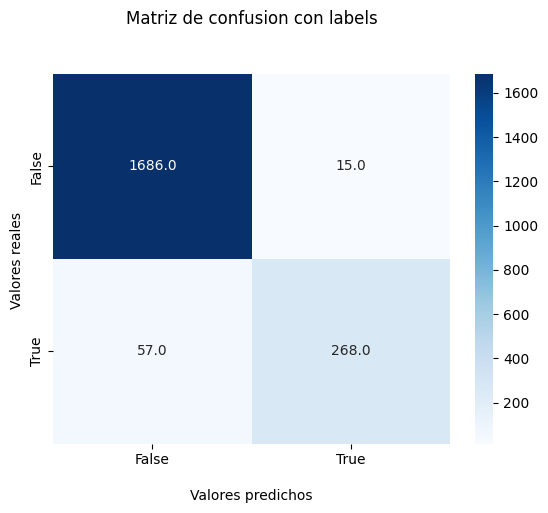

In [569]:
mat_conf(y_test,y_pred_RFC_o)

Matriz de confusion modelo base

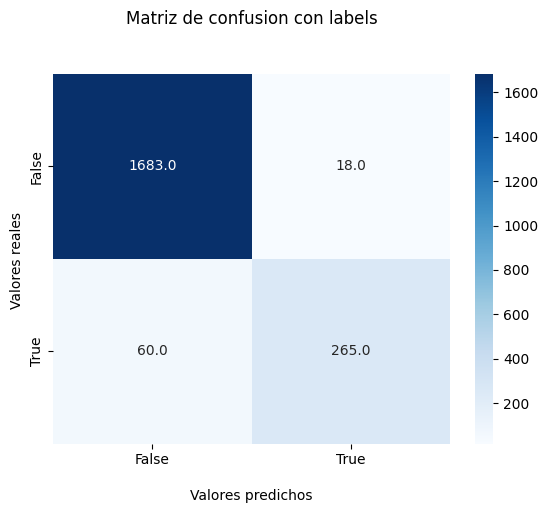

In [509]:
mat_conf(y_test,y_pred_RFC)

Como podemos ver, todas las metricas mejoran considerablemente, y mas aun si prestamos atencion a las predicciones de nuestro target, es decir el 1. 

Mejoran en gran medida todas las metricas.

## Cross Validation con tuneo de hiperparametros para RandomForestClassifier y conjunto estandarizado

Como pudimos ver, el resultado que obtuvo el modelo cuando le pasamos nuestro conjunto de datos estandarizado mejoro en comparacion con el modelo base. Por lo que ahora haremos una busqueda de hiperparametros partiendo de estos datos estandarizados para ver si el rendimiento mejora aun mas. Usando exactamente el mismo metodo de busqueda que para el caso anterior.

LA SIGUIENTE LINEA DEMORA 5 MINUTOS EN EJECUTARSE

In [510]:
skf3 = StratifiedKFold(n_splits=5,
                      shuffle=True, 
                      random_state=4)

rfc_rscv2 = RandomizedSearchCV(rfc, grid_params, cv=skf3, n_jobs=-1, refit=True, return_train_score=True, n_iter=20, random_state=7,verbose=1)
rfc_rscv2.fit(X_train_t3,y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
                   estimator=RandomForestClassifier(random_state=0), n_iter=20,
                   n_jobs=-1,
                   param_distributions={'max_depth': [10, 14, 6, 23, 2, 17, 5,
                                                      20, 7, 28, 4, 8, 26, 3,
                                                      27, 25, 18, 1, 12, 13],
                                        'n_estimators': array([100, 166, 233, 300, 366, 433, 500, 566, 633, 700])},
                   random_state=7, return_train_score=True, verbose=1)

In [511]:
best_model2 = rfc_rscv2.best_estimator_

In [512]:
rfc_rscv2.best_score_

0.9598814936672226

In [513]:
rfc_rscv2.best_params_

{'n_estimators': 500, 'max_depth': 28}

In [514]:
rfc_rscv2.scorer_

<function sklearn.metrics._scorer._passthrough_scorer(estimator, *args, **kwargs)>

In [515]:
best_model2

RandomForestClassifier(max_depth=28, n_estimators=500, random_state=0)

In [570]:
rfc_optimizado2 = RandomForestClassifier(random_state = 0,
                                        criterion='gini',
                                        max_depth=28,
                                        n_estimators=500)

In [571]:
rfc_optimizado2.fit(X_train_t3, y_train)
y_pred_RFC_o2 = rfc_optimizado2.predict(X_test_t3)

Comparacion de metricas del modelo base y el modelo optimizado

In [572]:
print('Resultados RandomForestClassifier optimizado')
print(classification_report(y_test, y_pred_RFC_o2,zero_division=0))
print(f'roc_auc : {roc_auc_score(y_test,y_pred_RFC_o2)}')
print('- '*27)
print('Resultados RandomForestClassifier modelo base')
print(classification_report(y_test, y_pred_RFC,zero_division=0))
print(f'roc_auc : {roc_auc_score(y_test,y_pred_RFC)}')

Resultados RandomForestClassifier optimizado
              precision    recall  f1-score   support

           0       0.97      0.98      0.98      1701
           1       0.90      0.85      0.87       325

    accuracy                           0.96      2026
   macro avg       0.93      0.91      0.92      2026
weighted avg       0.96      0.96      0.96      2026

roc_auc : 0.9136706914484694
- - - - - - - - - - - - - - - - - - - - - - - - - - - 
Resultados RandomForestClassifier modelo base
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.94      0.82      0.87       325

    accuracy                           0.96      2026
   macro avg       0.95      0.90      0.92      2026
weighted avg       0.96      0.96      0.96      2026

roc_auc : 0.9024013024013023


Matriz de confusion modelo optimizado y conjunto de datos estandarizados

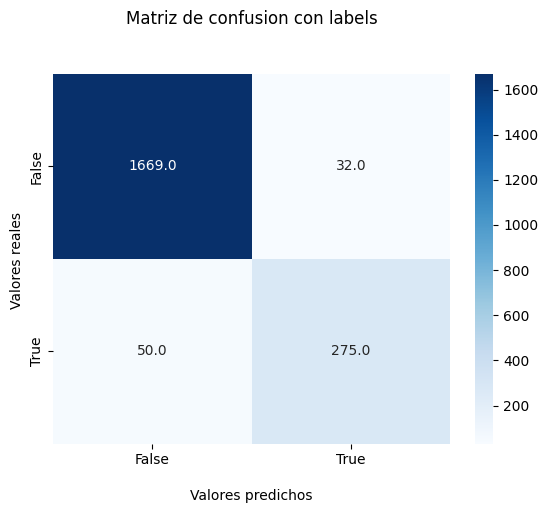

In [573]:
mat_conf(y_test,y_pred_RFC_o2)

Matriz de confusion modelo con tuneo de hiperparametros y datos sin estandarizar

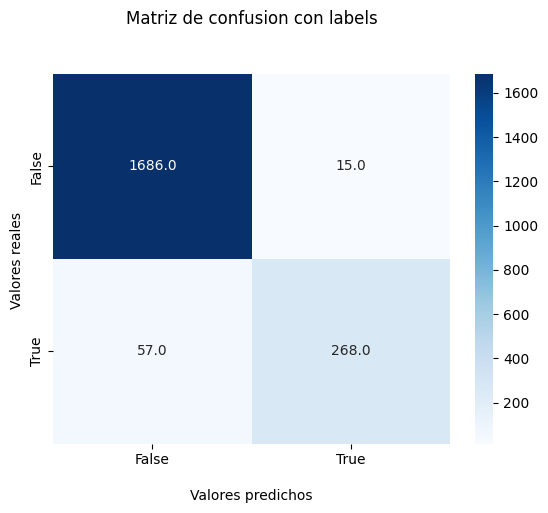

In [574]:
mat_conf(y_test,y_pred_RFC_o)

Como podemos ver las metricas mejoran en relacion con el modelo base. Pero tambien mejoran en comparacion con el modelo que se entreno SIN utilizar el conjunto de datos estandarizado. La mejora es casi nula, ya que pasamos de un ROC_AUC 0.906 a un ROC_AUC de 0.913

Por otro lado es interesante ver la diferencia entre ambas matrices de confusión. Ya que el modelo entrenado con datos estandarizados mostro una mayor cantidad de TP, tambien aumento considerablemente los valores TN y redujo los FN.

En este caso, seria conveniente analizar comercialmente que le conviene a la empresa o al cliente que va a utilizar el modelo. El equipo recomendaria utilizar los datos estandarizados. 


## CV con hypertuning, evaluado segun ROC_AUC

In [521]:
rfc = RandomForestClassifier(random_state=0,
                             criterion = 'gini')

In [522]:
num_estimators = np.linspace(400, 700, num = 10, endpoint = True).astype(int)
max_depth = range(15,21)
# max_depth = random.sample(range(15, 25), 20)

grid_params = {'n_estimators':num_estimators,
               'max_depth':max_depth}

In [523]:
skf4 = StratifiedKFold(n_splits=3,
                      shuffle=True, 
                      random_state=4)

rfc_rscv = RandomizedSearchCV(rfc,
                              grid_params,
                              cv=skf4,
                              n_jobs=-1,
                              refit=True,
                              scoring='roc_auc',
                              return_train_score=True,
                              n_iter=20,
                              random_state=7,
                              verbose=1)
rfc_rscv.fit(X_train_enc,y_train)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=3, random_state=4, shuffle=True),
                   estimator=RandomForestClassifier(random_state=0), n_iter=20,
                   n_jobs=-1,
                   param_distributions={'max_depth': range(15, 21),
                                        'n_estimators': array([400, 433, 466, 500, 533, 566, 600, 633, 666, 700])},
                   random_state=7, return_train_score=True, scoring='roc_auc',
                   verbose=1)

In [524]:
rfc_rscv.best_estimator_

RandomForestClassifier(max_depth=20, n_estimators=700, random_state=0)

In [525]:
rfc_rscv.best_score_

0.9860979457354571

In [526]:
rfc_rscv.scorer_

make_scorer(roc_auc_score, needs_threshold=True)

In [527]:
pd.DataFrame(rfc_rscv.cv_results_).sort_values('rank_test_score').head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
2,10.537173,0.274173,0.842330,0.006717,700,20,"{'n_estimators': 700, 'max_depth': 20}",0.984275,0.982731,0.991288,0.986098,0.003724,1,1.0,1.0,1.0,1.0,6.409876e-17
9,6.993855,0.489342,0.409340,0.121323,400,18,"{'n_estimators': 400, 'max_depth': 18}",0.984016,0.982981,0.991262,0.986086,0.003684,2,1.0,1.0,1.0,1.0,0.000000e+00
11,9.192927,0.577786,0.548474,0.144495,566,19,"{'n_estimators': 566, 'max_depth': 19}",0.984008,0.982788,0.991434,0.986077,0.003821,3,1.0,1.0,1.0,1.0,0.000000e+00
5,8.646434,0.759628,0.379251,0.056023,533,19,"{'n_estimators': 533, 'max_depth': 19}",0.983893,0.982793,0.991482,0.986056,0.003863,4,1.0,1.0,1.0,1.0,0.000000e+00
16,7.884169,0.751654,0.295625,0.016437,466,18,"{'n_estimators': 466, 'max_depth': 18}",0.983898,0.982977,0.991293,0.986056,0.003722,5,1.0,1.0,1.0,1.0,0.000000e+00


In [528]:
rfc_optimizado3 = RandomForestClassifier(random_state=0,
                             criterion = 'gini',
                             max_depth=20,
                             n_estimators=700)
rfc_optimizado3.fit(X_train_enc,y_train)
y_pred = rfc_optimizado3.predict(X_test_enc)

--IMPORTANTE--

En el caso de una clasificacion binaria, las metricas arrojan valores para el target = 1. Es importante que al transformar nuestros datos tengamos esta consideracion.



In [529]:
roc_auc_score(y_test,y_pred)

0.9063600596933931

In [530]:
recall_score(y_test,y_pred)

0.8215384615384616

In [531]:
y_pred_train = rfc_optimizado3.predict(X_train_enc)

In [532]:
print(classification_report(y_test,y_pred))
print(f'roc_auc: {roc_auc_score(y_test,y_pred)}')

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.95      0.82      0.88       325

    accuracy                           0.96      2026
   macro avg       0.96      0.91      0.93      2026
weighted avg       0.96      0.96      0.96      2026

roc_auc: 0.9063600596933931


El resultado es muy parecido al que arroja si no le asignamos un scoring de roc_auc.

## KNeighborsClassifier hypertuning

Vamos a usar los conjutnos X_tr_sKB y X_ts_sKB. Con los que, ademas de una reduccion de dimensionalidad, se obtuvo un mejor desempeño del modelo. Esto es lo que se hizo y puede verse en el apartado correspondiente


```
# selector = SelectKBest(score_func=f_classif, k=7)
X_tr_sKB = selector.fit_transform(X_train_enc, y_train)
X_ts_sKB = selector.transform(X_test_enc)
```



In [533]:
knn = KNeighborsClassifier()

In [534]:
n_neighbors = np.linspace(1, 50, num = 10, endpoint = True).astype(int)
weights = ['uniform','distance']
algorithm = ['auto', 'ball_tree', 'kd_tree', 'brute']
leaf_size = np.linspace(10, 100, num = 10, endpoint = True).astype(int)


grid_params = {'n_neighbors':n_neighbors,
               'weights':weights,
               'algorithm':algorithm,
               'leaf_size':leaf_size}

In [535]:
skf4 = StratifiedKFold(n_splits=3,
                      shuffle=True, 
                      random_state=4)

knn_rscv = RandomizedSearchCV(knn,
                              grid_params,
                              cv=skf4,
                              n_jobs=-1,
                              refit=True,
                              scoring='roc_auc',
                              return_train_score=True,
                              n_iter=20,
                              random_state=7,
                              verbose=1)
knn_rscv.fit(X_tr_sKB ,y_train)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=3, random_state=4, shuffle=True),
                   estimator=KNeighborsClassifier(), n_iter=20, n_jobs=-1,
                   param_distributions={'algorithm': ['auto', 'ball_tree',
                                                      'kd_tree', 'brute'],
                                        'leaf_size': array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100]),
                                        'n_neighbors': array([ 1,  6, 11, 17, 22, 28, 33, 39, 44, 50]),
                                        'weights': ['uniform', 'distance']},
                   random_state=7, return_train_score=True, scoring='roc_auc',
                   verbose=1)

In [536]:
knn_rscv.best_estimator_

KNeighborsClassifier(algorithm='ball_tree', leaf_size=40, n_neighbors=44,
                     weights='distance')

In [537]:
knn_rscv.best_score_

0.9262072131762648

In [538]:
knn_rscv.scorer_

make_scorer(roc_auc_score, needs_threshold=True)

In [539]:
pd.DataFrame(knn_rscv.cv_results_).sort_values('rank_test_score').head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_weights,param_n_neighbors,param_leaf_size,param_algorithm,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
19,0.007010,0.001639,0.054604,0.010059,distance,44,40,ball_tree,"{'weights': 'distance', 'n_neighbors': 44, 'le...",0.921015,0.920945,0.936662,0.926207,0.007393,1,1.0,1.0,1.0,1.0,0.0
1,0.003134,0.000392,0.249497,0.035503,distance,50,100,brute,"{'weights': 'distance', 'n_neighbors': 50, 'le...",0.920922,0.920544,0.937004,0.926157,0.007672,2,1.0,1.0,1.0,1.0,0.0
10,0.020353,0.001367,0.105707,0.012097,distance,28,40,ball_tree,"{'weights': 'distance', 'n_neighbors': 28, 'le...",0.919403,0.917785,0.934130,0.923772,0.007354,3,1.0,1.0,1.0,1.0,0.0
12,0.003055,0.000456,0.259082,0.072588,distance,28,70,brute,"{'weights': 'distance', 'n_neighbors': 28, 'le...",0.919403,0.917785,0.934130,0.923772,0.007354,3,1.0,1.0,1.0,1.0,0.0
6,0.010962,0.003457,0.117768,0.026115,distance,22,100,ball_tree,"{'weights': 'distance', 'n_neighbors': 22, 'le...",0.917129,0.915411,0.933872,0.922137,0.008327,5,1.0,1.0,1.0,1.0,0.0


In [540]:
knn_optimizado2 = KNeighborsClassifier(algorithm='ball_tree', 
                                      leaf_size=40, 
                                      n_neighbors=44,
                                      weights='distance')
knn_optimizado2.fit(X_tr_sKB ,y_train)
y_pred_knn_o = knn_optimizado2.predict(X_ts_sKB )

In [541]:
roc_auc_score(y_test,y_pred_knn_o)

0.8102808302808303

In [542]:
recall_score(y_test,y_pred_knn_o)

0.6523076923076923

In [543]:
print('Resultados KNeighborsClassifier optimizado')
print(classification_report(y_test, y_pred_knn_o,zero_division=0))
print(f'roc_auc : {roc_auc_score(y_test,y_pred_knn_o)}')
print('- '*27)
print('Resultados KNeighborsClassifier modelo base')
print(classification_report(y_test, predicciones_knn,zero_division=0))
print(f'roc_auc : {roc_auc_score(y_test,predicciones_knn)}')

Resultados KNeighborsClassifier optimizado
              precision    recall  f1-score   support

           0       0.94      0.97      0.95      1701
           1       0.80      0.65      0.72       325

    accuracy                           0.92      2026
   macro avg       0.87      0.81      0.83      2026
weighted avg       0.91      0.92      0.91      2026

roc_auc : 0.8102808302808303
- - - - - - - - - - - - - - - - - - - - - - - - - - - 
Resultados KNeighborsClassifier modelo base
              precision    recall  f1-score   support

           0       0.92      0.96      0.94      1701
           1       0.73      0.58      0.65       325

    accuracy                           0.90      2026
   macro avg       0.83      0.77      0.79      2026
weighted avg       0.89      0.90      0.89      2026

roc_auc : 0.7689485822819155


Con el modelo base tenemos una pequeña diferencia, pero si comparo las metricas con el modelo que estaba usando el conjunto de test y train que habia sido pasado por el metodo de featureSelections SelectKBest el resultado no mejora nada.

## XGBOOST hypertuning

In [544]:
import xgboost as xgb

In [545]:
prueba_xgb = xgb.XGBClassifier(learning_rate=0.001,
                               random_state = 7)
prueba_xgb.fit(X_train_enc,y_train)
y_pred_xgb = prueba_xgb.predict(X_test_enc)

In [546]:
roc_auc_score(y_test,y_pred_xgb)

0.8972477728033283

Ahora vamos a hacer un randomizedSearchCV para encontrar los mejores parametros

In [547]:
params_grid = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [5,6,7]
        }

In [548]:
skf4 = StratifiedKFold(n_splits=5)

In [549]:
grid_cv = RandomizedSearchCV(prueba_xgb,
                             params_grid,
                             scoring='roc_auc',
                             n_jobs = -1,
                             cv=skf4,
                             return_train_score=True)
grid_cv.fit(X_train_enc,y_train)

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           impor...
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=7, ...),
                   n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.6, 0.8, 1.0],
                                        'gamma': [0.5, 1, 1.5, 2, 5],
                                        'max_depth': [5, 6, 7],
                                        'min_child_weight': [1, 5, 10],
                                        'subsample': [0.6, 0.8, 1.0]},
                   return_train_score=True, scoring='roc_auc')

In [550]:
grid_cv.best_score_

0.9833960394262785

In [551]:
pd.DataFrame(grid_cv.cv_results_).sort_values('rank_test_score').head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_subsample,param_min_child_weight,param_max_depth,param_gamma,param_colsample_bytree,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
8,2.737368,0.443938,0.023358,0.009194,0.8,1,7,5,0.6,"{'subsample': 0.8, 'min_child_weight': 1, 'max...",0.983508,0.984282,0.981216,0.986872,0.981102,0.983396,0.002140,1,0.990920,0.991437,0.992738,0.992613,0.992154,0.991972,0.000696
7,1.503277,0.099776,0.021916,0.009056,0.8,10,6,0.5,0.6,"{'subsample': 0.8, 'min_child_weight': 10, 'ma...",0.979260,0.979016,0.978068,0.981340,0.977265,0.978990,0.001373,2,0.984490,0.985008,0.986580,0.985537,0.986445,0.985612,0.000807
6,2.245152,0.386532,0.021086,0.007550,1.0,10,7,1.5,0.6,"{'subsample': 1.0, 'min_child_weight': 10, 'ma...",0.979060,0.977755,0.977019,0.980848,0.975937,0.978124,0.001699,3,0.985670,0.985692,0.987288,0.986738,0.987547,0.986587,0.000784
0,1.973069,0.265151,0.018256,0.008487,1.0,5,6,1.5,0.8,"{'subsample': 1.0, 'min_child_weight': 5, 'max...",0.978106,0.976393,0.973824,0.979232,0.974064,0.976324,0.002145,4,0.986182,0.985975,0.987151,0.986226,0.986080,0.986323,0.000423
9,2.087112,0.474756,0.013988,0.000784,1.0,10,7,5,0.8,"{'subsample': 1.0, 'min_child_weight': 10, 'ma...",0.975249,0.973719,0.971110,0.976803,0.972664,0.973909,0.001979,5,0.981981,0.982122,0.983597,0.983000,0.983486,0.982837,0.000674


In [552]:
grid_cv.scorer_

make_scorer(roc_auc_score, needs_threshold=True)

In [553]:
grid_cv.best_params_

{'subsample': 0.8,
 'min_child_weight': 1,
 'max_depth': 7,
 'gamma': 5,
 'colsample_bytree': 0.6}

Vemos los resultados para el modelo optimizado

In [554]:
xbg_optimizado = xgb.XGBClassifier(learning_rate=0.001,
                                   random_state = 7,
                                   subsample= 0.8,
                                   min_child_weight = 1,
                                   max_depth = 7,
                                   gamma = 1.5,
                                   colsample_bytree = 0.8)
xbg_optimizado.fit(X_train_enc,y_train)
y_xbg = xbg_optimizado.predict(X_test_enc)

In [555]:
print(classification_report(y_test,y_xbg))
print(f'roc_auc: {roc_auc_score(y_test,y_xbg)}')

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.94      0.81      0.87       325

    accuracy                           0.96      2026
   macro avg       0.95      0.90      0.93      2026
weighted avg       0.96      0.96      0.96      2026

roc_auc: 0.9014507303396192


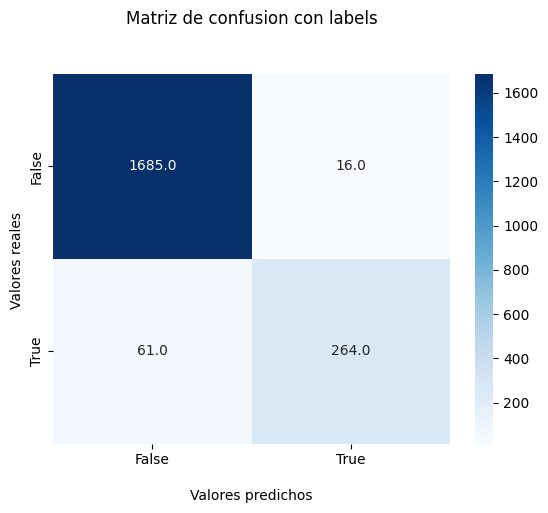

In [556]:
mat_conf(y_test,y_xbg)

Los resultados mejoran muy poco, en el caso del XGBOOSTCLAS.. podemos ver que el cv da valores un tanto mas altos (al rededor de un 0.98) y esto quiere decir que el modelo esta tendiendo a overfitear. Habira que ver como se trabaja esto, para evitar que el modelo aprenda a la perfeccion los datos de train y de esta forma poder predecir la tendencia de datos futuros con mayor certeza. 

## COMPARACION DE MEJORES MODELOS

In [578]:
print('XGBClassifier')
print(classification_report(y_test,y_xbg))
print(f'roc_auc XGBClassifier: {roc_auc_score(y_test,y_xbg)}')
print('- '*27)
print('RandomForestClassifier')
print(classification_report(y_test,y_pred))
print(f'roc_auc RandomForestClassifier: {roc_auc_score(y_test,y_pred_RFC_o2)}')
print('- '*27)
print('Resultados KNeighborsClassifier')
print(classification_report(y_test, y_pred_knn_o,zero_division=0))
print(f'roc_auc KNeighborsClassifier: {roc_auc_score(y_test,y_pred_knn_o)}')

XGBClassifier
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.94      0.81      0.87       325

    accuracy                           0.96      2026
   macro avg       0.95      0.90      0.93      2026
weighted avg       0.96      0.96      0.96      2026

roc_auc XGBClassifier: 0.9014507303396192
- - - - - - - - - - - - - - - - - - - - - - - - - - - 
RandomForestClassifier
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.95      0.82      0.88       325

    accuracy                           0.96      2026
   macro avg       0.96      0.91      0.93      2026
weighted avg       0.96      0.96      0.96      2026

roc_auc RandomForestClassifier: 0.9136706914484694
- - - - - - - - - - - - - - - - - - - - - - - - - - - 
Resultados KNeighborsClassifier
              precision    recall  f1-score   support

           0       

### Conclusión final

En conclusión, el modelo que se ha desarrollado muestra un alto rendimiento para predecir el resultado binario de una variable objetivo en un conjunto de datos. El puntaje ROC AUC de 0.914 indica que el modelo tiene una gran capacidad para distinguir entre aquellos clientes que abandonaran el servicio y los que no lo haran. 

> EDA

Mediante el análisis exploratorio de datos se pudo sacar algunas conclusiones preeliminares de los datos que fueron analizadas o puestas a prueba durante el desarrollo del proyecto.

El modelo que arrojo un mejor resultado fue un RandomForestClassifier

> Transformaciones

Se utilizo un Pipeline para hacer la transformacion de los conjuntos train y test con el cual fue entrenado y testeado el rendimiento del modelo

In [558]:
preprocess

ColumnTransformer(remainder='passthrough',
                  transformers=[('Cat_ordinales',
                                 Pipeline(steps=[('ord_enc',
                                                  OrdinalEncoder(categories=[['Unknown',
                                                                              'Uneducated',
                                                                              'Graduate',
                                                                              'Post-Graduate',
                                                                              'High '
                                                                              'School',
                                                                              'College',
                                                                              'Doctorate'],
                                                                             ['Unknown',
                                                                              'Less '
                                                                              'than '
                                                                              '$40K',
                                                                              '$40K '
                                                                              '- '
                                                                              '$60K',
                                                                              '$60K '
                                                                              '- '
                                                                              '$80K',
                                                                              '$80K '
                                                                              '- '
                                                                              '$120K',
                                                                              '$120K '
                                                                              '+'],
                                                                             ['Blue',
                                                                              'Silver',
                                                                              'Gold',
                                                                              'Platinum']])),
                                                 ('min_max_scaler',
                                                  MinMaxScaler())]),
                                 ['Education_Level', 'Income_Category',
                                  'Card_Category']),
                                ('Cat_no_ordinales',
                                 Pipeline(steps=[('ohe_enc',
                                                  OneHotEncoder(drop='first'))]),
                                 ['Gender', 'Marital_Status'])])

> Modelo base

Fue necesario crear un modelo base con el cual comparar los diferentes resultados obtenidos mas adelante. Por ello se hicieron 3 modelos diferentes que fueron evaluados segun roc_auc_score

In [559]:
print(f'ROC_AUC para RandomForestClassifier - modelo base -: {round(roc_auc_score(y_test,y_pred_RFC),3)}')

ROC_AUC para RandomForestClassifier - modelo base -: 0.902


> Estandarización

Debido a las transformaciones realizadas por OHE y OrdinalEncoder se obtuvo un resutado bastante aceptable. Sin embargo tambien se testeo estandarizar las variables. Al evaluar el rendimiento del modelo mediante un set de datos estandarizados segun RobustScaler y StandardScaler se obtuvieron los siguientes resutados 

In [560]:
print(f'ROC_AUC para RandomForestClassifier - variables estandarizadas-: {round(roc_auc_score(y_test,y_pred_RFCstd),3)}')

ROC_AUC para RandomForestClassifier - variables estandarizadas-: 0.907


El resultado mejoro en 0.003 la metrica de evaluacion

> Selección de variables

Se utilizaron 3 metodos de feature selection pero ninguno arrojo una mejora significativa en los modelos entrenados. Quiza en un caso con una mayor cantidad de datos podriamos estar dispuestos a sacrificar un poco el rendimiento por reducir la dimensionalidad de nuestro dataset. Este no era el caso.

In [561]:
print(f'ROC_AUC para RandomForestClassifier - PCA-: {round(roc_auc_score(y_test, y_pred_RFCpca),3)}')
print(f'ROC_AUC para RandomForestClassifier - VarianceThreshold-: {round(roc_auc_score(y_test,y_pred_RFCvt),3)}')
print(f'ROC_AUC para RandomForestClassifier - SelectKBest-: {round(roc_auc_score(y_test,y_pred_RFCsKB),3)}')

ROC_AUC para RandomForestClassifier - PCA-: 0.792
ROC_AUC para RandomForestClassifier - VarianceThreshold-: 0.89
ROC_AUC para RandomForestClassifier - SelectKBest-: 0.883


> Validación cruzada y selección de hiperparametros

Se hizo una validacion cruzada con StratifiedKFold en conjunto con un RandomizedSearchCV para lograr obtener los mejores hiperparametros que aumentaran el rendimiento de nuestro modelo.

Los hiperparametros obtenidos fueron los siguientes para el modelo entrenado con datos sin estandarizar 
```
rfc_rscv.best_estimator_
{'n_estimators': 700, 'max_depth': 28}
```
En cambio, para el modelo entrenado con datos estandarizados los hiperparametros tomaron otros valores. 
```
rfc_rscv2.best_estimator_
{'n_estimators': 500, 'max_depth': 28}
```

Analizando la validacion cruzada, podemos decir que en ambos casos, el modelo presenta un pequeño overfiting, ya que las metricas de test son un 5-6% mayores a las metricas de train. Para obtener los mejores resultados deberiamos utilizar el modelo que se entreno con datos estandarizados. 


> RESULTADO MODELO FINAL

Utilizando los mejores hiperparametros obtenidos y el conjunto de datos estandarizados, el modelo aumento notablemente su rendimiento.

In [575]:
print(f'ROC_AUC para RandomForestClassifier -FINAL-: {round(roc_auc_score(y_test,y_pred_RFC_o2),3)}')

ROC_AUC para RandomForestClassifier -FINAL-: 0.914


In [577]:
print('Resultados RandomForestClassifier optimizado')
print(classification_report(y_test, y_pred_RFC_o2,zero_division=0))

Resultados RandomForestClassifier optimizado
              precision    recall  f1-score   support

           0       0.97      0.98      0.98      1701
           1       0.90      0.85      0.87       325

    accuracy                           0.96      2026
   macro avg       0.93      0.91      0.92      2026
weighted avg       0.96      0.96      0.96      2026



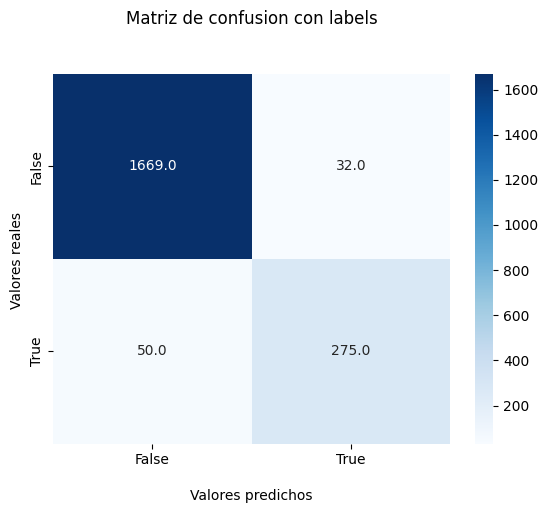

In [576]:
mat_conf(y_test,y_pred_RFC_o2)